In [1]:
import pandas as pd
import numpy as np
from pymatgen.core import Composition
import re
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
import numpy as np
from sklearn.ensemble import RandomForestRegressor
import matplotlib as mpl
from sklearn.model_selection import train_test_split
import math
from joblib import Parallel, delayed
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.model_selection import LeaveOneOut
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import cross_val_score
from tqdm import tqdm
config = {
    "mathtext.fontset":'stix',
    "font.family":'serif',
    "font.serif": ['Arial'],
    "font.size": 24,
    'axes.unicode_minus': False 
}
plt.rcParams.update(config)
plt.rcParams['axes.unicode_minus'] = False  
large = 22; med = 16; small = 12
params = {'axes.titlesize': large,
          'legend.fontsize': med,
          'figure.figsize': (8, 6),
          'axes.labelsize': med,
          'axes.titlesize': med,
          'xtick.labelsize': med,
          'ytick.labelsize': med,
          'figure.titlesize': large}
plt.rcParams.update(params)
plt.rcParams['figure.dpi'] = 400
plt.rcParams['axes.grid'] = False

In [2]:
from atomicfeaturespackage.atomicproperties import atomic_properties_pymat as pymat
from atomicfeaturespackage.atomicproperties import atomic_properties_matminer as mat
from atomicfeaturespackage.atomicproperties import atomic_properties_dft as dft

In [3]:
data = pd.read_csv('best_features_BO.csv')
data

,B_number of Valence Electrons,(A+B)-O_number of d Electrons,B_atomic_hfomo,B_atomic_lpumo,B_atomic_r_val_neg_1,A-B_number of Valence Electrons,B_atomic Radius,A_atomic_ndval,A_atomic_nunf,B_atomic_r_val_05,...,A-B_atomic Radius,A_number of s+p Electrons,A_atomic_nfval,A_atomic_lfumo,A_covalent Radius,A_atomic_lpumo,A_atomic_r_s_1,A_atomic_hpomo,A_atomic_r_d_1,target
0,6.0,5.8,-4.787510,-4.787510,0.45805,3.0,1.400,0.8,8.8,1.41305,...,0.250,2.0,1.2,-2.165658,152.8,-2.165658,0.00000,-2.165658,0.0,2.146025
1,8.0,6.8,-3.822640,-3.822660,0.38335,5.0,1.400,0.8,8.8,0.39065,...,0.250,2.0,1.2,-2.165658,152.8,-2.165658,0.00000,-2.165658,0.0,1.374682
2,4.0,2.8,-4.648010,-3.055890,0.90925,1.0,1.550,0.8,8.8,0.83435,...,0.100,2.0,1.2,-2.165658,152.8,-2.165658,0.00000,-2.165658,0.0,4.177025
3,4.0,0.8,-12.664360,-3.782330,1.32395,1.0,1.250,0.8,8.8,1.14245,...,0.400,2.0,1.2,-2.165658,152.8,-2.165658,0.00000,-2.165658,0.0,3.941249
4,4.0,2.8,-5.356470,-2.187910,0.98135,1.0,1.550,0.8,8.8,0.88435,...,0.100,2.0,1.2,-2.165658,152.8,-2.165658,0.00000,-2.165658,0.0,4.529786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35320,3.3,1.3,-2.685994,-2.208358,1.20619,1.3,1.760,0.0,0.0,1.64012,...,0.240,2.0,0.0,-0.900650,185.0,-0.900650,1.83315,-3.709160,0.0,3.843865
35321,2.7,0.7,-3.112693,-1.733521,1.45087,0.7,1.610,0.0,0.0,1.70297,...,0.390,2.0,0.0,-0.900650,185.0,-0.900650,1.83315,-3.709160,0.0,3.431016
35322,3.3,0.7,-5.090899,-2.426290,1.33060,1.3,1.670,0.0,0.0,1.73255,...,0.330,2.0,0.0,-0.900650,185.0,-0.900650,1.83315,-3.709160,0.0,2.085930
35323,3.3,1.3,-2.898532,-1.947964,1.22782,1.3,1.760,0.0,0.0,1.65512,...,0.240,2.0,0.0,-0.900650,185.0,-0.900650,1.83315,-3.709160,0.0,3.646532


In [278]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
idea_data = data[(data['target'] >= 0.8) & (data['target'] <= 2.7)]
core_data = idea_data[['B_number of Valence Electrons','(A+B)-O_number of d Electrons','B_atomic_hfomo','B_atomic_lpumo']]
core_data

,B_number of Valence Electrons,(A+B)-O_number of d Electrons,B_atomic_hfomo,B_atomic_lpumo
0,6.0,5.8,-4.787510,-4.787510
1,8.0,6.8,-3.822640,-3.822660
8,6.0,5.8,-4.787510,-4.787510
12,4.0,0.8,-11.777160,-3.946820
14,5.0,10.8,-4.906730,-4.906730
...,...,...,...,...
35314,3.7,1.7,-3.887240,-3.040912
35315,4.4,2.4,-4.584944,-2.848790
35316,3.0,0.3,-6.357036,-2.206904
35318,4.7,10.0,-6.819731,-4.508441


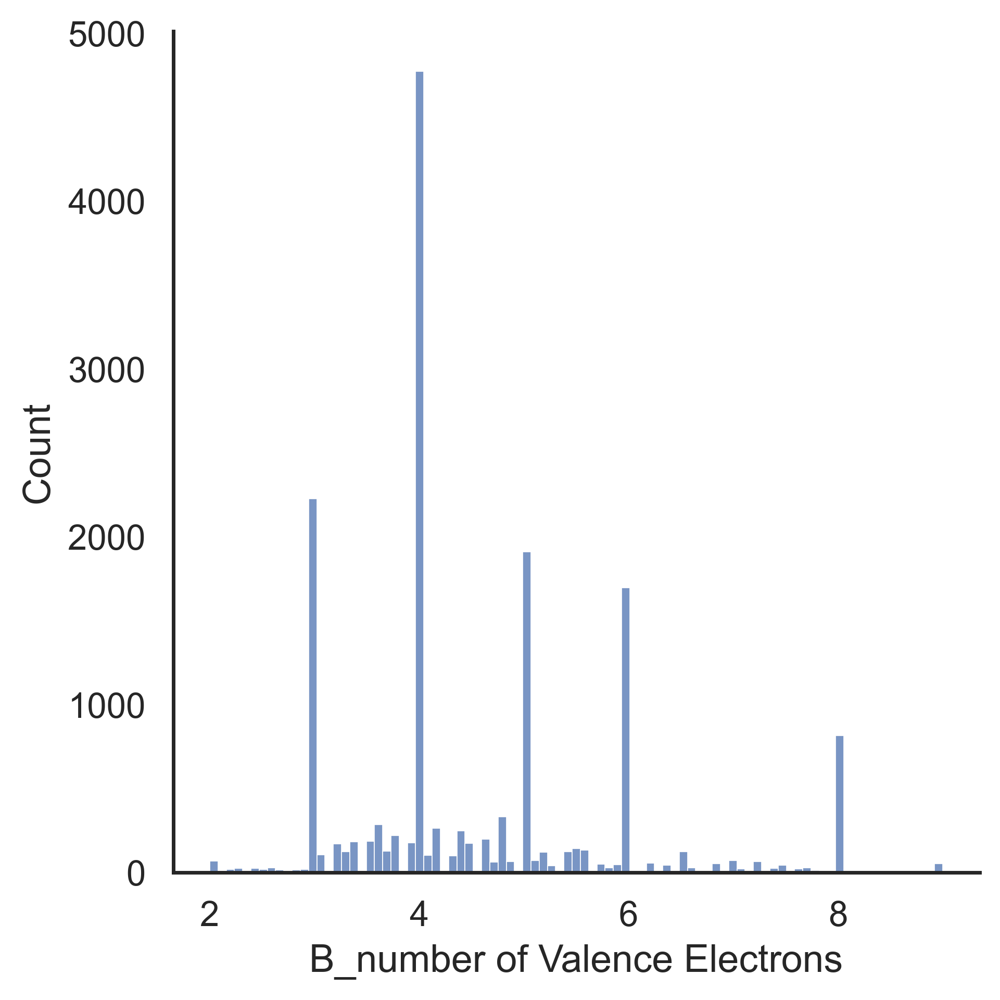

In [341]:
sns.displot(core_data['B_number of Valence Electrons'])

In [280]:
key_column = core_data.columns

In [281]:
data_52 = pd.read_csv('52_data.csv')
data_52

,B_number of Valence Electrons,(A+B)-O_number of d Electrons,B_atomic_hfomo,B_atomic_lpumo,B_atomic_r_val_neg_1,A-B_number of Valence Electrons,B_atomic Radius,A_atomic_ndval,A_atomic_nunf,B_atomic_r_val_05,...,A-B_atomic Radius,A_number of s+p Electrons,A_atomic_nfval,A_atomic_lfumo,A_covalent Radius,A_atomic_lpumo,A_atomic_r_s_1,A_atomic_hpomo,A_atomic_r_d_1,target
0,6,5,-4.78751,-4.78751,0.45805,3,1.40,0.0,8.0,1.41305,...,0.45,2,6.0,-1.78977,172,-1.78977,1.84425,-1.78977,0.00000,1.736200
1,9,8,-3.26630,-3.26631,0.35905,6,1.35,1.0,9.0,0.36465,...,0.25,2,0.0,-2.25963,148,-2.25963,0.00000,-2.25963,0.57205,0.786000
2,6,6,-4.78751,-4.78751,0.45805,3,1.40,1.0,16.0,1.41305,...,0.40,2,7.0,-0.47011,169,-0.47011,1.82645,-2.01997,1.09915,0.825000
3,6,6,-4.78751,-4.78751,0.45805,3,1.40,1.0,9.0,1.41305,...,0.40,2,0.0,-1.78655,163,-1.78655,1.63185,-1.78655,0.90045,1.767900
4,8,7,-3.82264,-3.82266,0.38335,5,1.40,1.0,9.0,0.39065,...,0.55,2,0.0,-2.34754,180,-2.34754,0.00000,-2.34754,1.13165,0.848400
5,9,7,-3.26630,-3.26631,0.35905,6,1.35,0.0,8.0,0.36465,...,0.50,2,6.0,-1.78977,172,-1.78977,1.84425,-1.78977,0.00000,0.803900
6,8,7,-3.82264,-3.82266,0.38335,5,1.40,1.0,9.0,0.39065,...,0.40,2,0.0,-1.78655,163,-1.78655,1.63185,-1.78655,0.90045,0.637300
7,6,6,-4.78751,-4.78751,0.45805,3,1.40,1.0,9.0,1.41305,...,0.55,2,0.0,-2.34754,180,-2.34754,0.00000,-2.34754,1.13165,1.903900
8,6,5,-4.78751,-4.78751,0.45805,3,1.40,0.0,11.0,1.41305,...,0.45,2,3.0,-1.85729,176,-1.85729,1.88875,-1.85729,0.00000,1.847000
9,6,5,-4.78751,-4.78751,0.45805,3,1.40,0.0,10.0,1.41305,...,0.45,2,4.0,-1.07232,174,-1.07232,1.92685,-2.78148,0.00000,1.904000


In [282]:
drop_column = 'target'
X = data.drop(drop_column, axis = 1)
y = data['target']

In [283]:
normal_features = X.drop(key_column, axis = 1)
normal_column = normal_features.columns

In [284]:
X_52 = data_52.drop(drop_column, axis = 1)
y_52 = data_52['target']

In [285]:
feature_set = X.columns

In [286]:
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from tqdm import tqdm
train_model = ExtraTreesRegressor(n_jobs=-1,random_state=42)
error1 = []
error2 = []
r2_prm = []
error1_base=[]
error2_base=[]
r2_prl=[]
train_set = []
test_set = []
tmp_df = pd.DataFrame()
kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_indices = kf.split(X,y)
for i,(train_index, test_index) in enumerate(cv_indices):
    train_set.append(train_index)
    test_set.append(test_index)
    X_train, X_test = X.loc[train_index], X.loc[test_index]
    y_train, y_test = y.loc[train_index], y.loc[test_index]
    X_train = X_train[feature_set]
    X_test = X_test[feature_set]
    name = f"fold_{i}"
    train_model.fit(X_train, y_train)
    
    y_pred = train_model.predict(X_test)
    mae_model = mean_absolute_error(y_test, y_pred)
    rmse_model = np.sqrt(mean_squared_error(y_test, y_pred))
    r2_model = r2_score(y_test,y_pred)
    error1.append(mae_model)
    error2.append(rmse_model)
    r2_prm.append(r2_model)
    
    y_base = train_model.predict(X_52)
    tmp_df[f'column_{i}'] = y_base
    MAE_BASE = mean_absolute_error(y_base,y_52)
    RMSE_BASE = np.sqrt(mean_squared_error(y_base,y_52))
    R2_BASE = r2_score(y_base,y_52)
    error1_base.append(MAE_BASE)
    error2_base.append(RMSE_BASE)
    r2_prl.append(R2_BASE)
    print(name)
    print(f"Performance on the test set: MAE = %0.4f,RMSE = %0.4f, R2 = %0.4f" % (mae_model, rmse_model, r2_model))
    print(f"Performance on the small set: MAE = %0.4f,RMSE = %0.4f, R2 = %0.4f" % (MAE_BASE, RMSE_BASE, R2_BASE))
mean_error1 = sum(error1) / len(error1)
mean_error2 = sum(error2) / len(error2)
mean_r2 = sum(r2_prm) / len(r2_prm)
print('Performance on the test set using 5-fold: MAE = %0.4f' % mean_error1)
print('Performance on the test set using 5-fold: RMSE = %0.4f' % mean_error2)
print('Performance on the test set using 5-fold: R2 = %0.4f' % mean_r2)

mean_error1_base = sum(error1_base) / len(error1_base)
mean_error2_base = sum(error2_base) / len(error2_base)
mean_r2_base = sum(r2_prl) / len(r2_prl)
print('Performance on the valid set using 5-fold: MAE = %0.4f' % mean_error1_base)
print('Performance on the valid set using 5-fold: RMSE = %0.4f' % mean_error2_base)
print('Performance on the valid set using 5-fold: R2 = %0.4f' % mean_r2_base)

fold_0
Performance on the test set: MAE = 0.3380,RMSE = 0.4620, R2 = 0.8608
Performance on the small set: MAE = 0.3707,RMSE = 0.4794, R2 = 0.7103
fold_1
Performance on the test set: MAE = 0.3437,RMSE = 0.4722, R2 = 0.8536
Performance on the small set: MAE = 0.3757,RMSE = 0.4884, R2 = 0.7141
fold_2
Performance on the test set: MAE = 0.3419,RMSE = 0.4689, R2 = 0.8604
Performance on the small set: MAE = 0.3896,RMSE = 0.5064, R2 = 0.6916
fold_3
Performance on the test set: MAE = 0.3373,RMSE = 0.4641, R2 = 0.8577
Performance on the small set: MAE = 0.3844,RMSE = 0.5030, R2 = 0.7012
fold_4
Performance on the test set: MAE = 0.3339,RMSE = 0.4607, R2 = 0.8605
Performance on the small set: MAE = 0.3671,RMSE = 0.4760, R2 = 0.7209
Performance on the test set using 5-fold: MAE = 0.3390
Performance on the test set using 5-fold: RMSE = 0.4656
Performance on the test set using 5-fold: R2 = 0.8586
Performance on the valid set using 5-fold: MAE = 0.3775
Performance on the valid set using 5-fold: RMSE =

In [287]:
best_train_index = train_set[4]
best_test_index = test_set[4]
best_X_train = X.loc[best_train_index].reset_index(drop=True)
best_X_test = X.loc[best_test_index].reset_index(drop=True)
best_y_train = y.loc[best_train_index].reset_index(drop=True)
best_y_test = y.loc[best_test_index].reset_index(drop=True)

In [288]:
model = ExtraTreesRegressor(n_jobs=-1, random_state=42)
model.fit(best_X_train, best_y_train)
y_pred = model.predict(best_X_test)
MAE = mean_absolute_error(best_y_test,y_pred)
RMSE = np.sqrt(mean_squared_error(best_y_test, y_pred))
R2 = r2_score(best_y_test,y_pred)
print('Performance on the test set: MAE = %0.4f' % MAE)
print('Performance on the test set: RMSE = %0.4f' % RMSE)
print('Performance on the test set: R2 SCORE = %0.4f' % R2)

Performance on the test set: MAE = 0.3339
Performance on the test set: RMSE = 0.4607
Performance on the test set: R2 SCORE = 0.8605


# Bayesian

In [289]:
columns = X.columns
def value_inf(df:pd.DataFrame,columns):
    result_df = []
    for column in columns:
        maxv = float(idea_data[column].max())
        minv = float(idea_data[column].min())
        result = {
            'feature':column,
            'Max_value':maxv,
            'Min_value':minv
        }
        result_df.append(result)
    return pd.DataFrame(result_df)
value_df = value_inf(idea_data,columns)
value_df

,feature,Max_value,Min_value
0,B_number of Valence Electrons,9.000000,2.000000
1,(A+B)-O_number of d Electrons,20.000000,0.000000
2,B_atomic_hfomo,-1.845130,-12.664360
3,B_atomic_lpumo,-0.104870,-4.906730
4,B_atomic_r_val_neg_1,1.734250,0.270150
5,A-B_number of Valence Electrons,9.700000,0.000000
6,B_atomic Radius,1.850000,0.850000
7,A_atomic_ndval,10.000000,0.000000
8,A_atomic_nunf,22.000000,0.000000
9,B_atomic_r_val_05,1.985450,0.364650


# 计算损失

In [290]:
def calculate_loss(formula_with_features, value_df):
    column_error_df = []
    row = formula_with_features.iloc[0]
    ft = value_df['feature']
    for column in ft:
        max_value = value_df[value_df['feature'] == column]['Max_value'].iloc[0]
        min_value = value_df[value_df['feature'] == column]['Min_value'].iloc[0]
        if row[column] <= max_value and row[column] >= min_value:
            column_loss = {
                'column':column,
                'loss': 0
            }
        else:
            ls = max(abs(row[column] - min_value), abs(row[column] - max_value))
            column_loss = {
                'column':column,
                'loss': ls
            }
        column_error_df.append(column_loss)
    column_error_df = pd.DataFrame(column_error_df)
    key_loss = sum(column_error_df['loss'][0:4]) * 0.123
    normal_loss = sum(column_error_df['loss'][4:]) * 0.024
    total_loss = key_loss + normal_loss
    return total_loss

# 四元氧化物元素筛选

In [291]:
A_cations = ['Sm','Sc','Gd','Y','La','Pr','Nd','Tm','Rb','Dy','Pm','Yb',
             'Mg','Hf','Cs','Ce','Ca','Pb','Cd','Bi','Ba','Tl','Ag','Tb',
             'Sb','Eu','K','Sn','In','Na','Sr']
B_cations = ['Cr','Co','Fe','Nb','In','Er','Sn','Zr','Be','Ge','Hf','Ti',
             'Ga','Si','Ta','Al','Bi','B','Sb','Ce','Mn','Ni']

In [292]:
len(B_cations)

22

In [347]:
X_anions = ['O']
A_ion_radii = {
    'Eu':1.437,'La':1.36,'Pr':1.304,'Nd':1.27,'Tm':1.168,'Rb':1.72,'Dy':1.192,'Pm':1.339,'Yb':1.343,'Mg':1.21,'Hf':1.07,
    'Cs':1.88,'Gd':1.212,'Ce':1.14,'Ca':1.34,'Pb':1.49,'Ba':1.61,'Sr':1.44,'Cd':1.31,'Y':1.223,'Sm':1.24,'Tl':1.70,'Bi':1.380,
    'In':1.596,'Ag':1.521,'Tb':1.201,'Sc':1.122,'Sb':1.234,'K':1.64,'Sn':1.408,'Na':1.39
}
B_ion_radii = {
    'Cr':0.615,'Nb':0.64,'In':0.80,'Er':0.89,'Sn':0.69,'Zr':0.72,'Be':0.45,'Ge':0.53,'Ti':0.605,'Si':0.40,'Sn':0.69,'Fe':0.645,
    'Co':0.61,'Sb':0.60,'Ta':0.64,'Al':0.535,'Bi':1.03,'B':0.27,'Ce':0.87,'Hf':0.71,'Ga':0.62,'Mn':0.645,'Ni':0.69,'Sc':0.745
}
X_ion_radii = {'O':1.40}
nA_jiatai = {
    'Eu':2,'La':3,'Pr':3,'Nd':3,'Tm':3,'Rb':1,'Dy':3,'Pm':3,'Yb':2,'Mg':2,'Hf':4,'Cs':1,'Gd':3,'Ce':4,'Ca':2,'Pb':2,
    'Ba':2,'Cd':2,'Ag':1,'Tb':3,'Sc':3,'Sb':3,'K':1,'Sn':2,'Na':1,'Sr':2,'Cd':2,'Y':3,'Sm':3,'Tl':1,'Bi':3,'In':1
}

In [294]:
ele_df1 = pd.read_csv('/home/zhouhairui/paper code/elements.csv')
ele_df2 = pd.read_csv('/home/zhouhairui/paper code/elements2.csv')

In [295]:
def get_physical_features(feature_df:pd.DataFrame, site):
    
    row = feature_df.iloc[0]
    
    if site == 'AB':
        tmp = {}
        o = 'O'
        if row['A1'] in list(ele_df1['symbol']) and row['A2'] in list(ele_df1['symbol']) and row['B1'] in list(ele_df1['symbol']) and row['B2'] in list(ele_df1['symbol']):
            A1 = row['A1']
            A2 = row['A2']
            B1 = row['B1']
            B2 = row['B2']
            a1 = row['A1_ratio']
            a2 = row['A2_ratio']
            b1 = row['B1_ratio']
            b2 = row['B2_ratio']
            tmp["formula"] = row['formula']
            tmp["A_number of Valence Electrons"] = a1 * ele_df1[ele_df1['symbol']==A1]['number_of_valence_electrons'].values[0] + \
            a2 * ele_df1[ele_df1['symbol']==A2]['number_of_valence_electrons'].values[0]
            tmp["B_number of Valence Electrons"] = b1 * ele_df1[ele_df1['symbol']==B1]['number_of_valence_electrons'].values[0] + \
                b2 * ele_df1[ele_df1['symbol']==B2]['number_of_valence_electrons'].values[0]
            tmp["O_number of Valence Electrons"] = ele_df1[ele_df1['symbol']==o]['number_of_valence_electrons'].values[0]
            tmp["A_atomic Radius"] = a1 * ele_df2[ele_df1['symbol']==A1]['Atomic radius'].values[0] + \
            a2 * ele_df2[ele_df1['symbol']==A2]['Atomic radius'].values[0]
            tmp["B_atomic Radius"] = b1 * ele_df2[ele_df1['symbol']==B1]['Atomic radius'].values[0] + \
            b2 * ele_df2[ele_df1['symbol']==B2]['Atomic radius'].values[0]
            tmp["O_atomic Radius"] = ele_df2[ele_df1['symbol']==o]['Atomic radius'].values[0]
            tmp["A_number of s+p Electrons"] = a1*(ele_df2[ele_df2['symbol']==A1]['Number of s electrons'].values[0] \
                                                   + ele_df2[ele_df2['symbol']==A1]['Number of p electrons'].values[0])+ \
            a2*(ele_df2[ele_df2['symbol']==A2]['Number of s electrons'].values[0] + \
                ele_df2[ele_df2['symbol']==A2]['Number of p electrons'].values[0])
            tmp["B_number of s+p Electrons"] = b1*(ele_df2[ele_df2['symbol']==B1]['Number of s electrons'].values[0] \
                                                   + ele_df2[ele_df2['symbol']==B1]['Number of p electrons'].values[0])+ \
            b2*(ele_df2[ele_df2['symbol']==B2]['Number of s electrons'].values[0] + \
                ele_df2[ele_df2['symbol']==B2]['Number of p electrons'].values[0])
            tmp["O_number of s+p Electrons"] = ele_df2[ele_df2['symbol']==o]['Number of s electrons'].values[0] \
            + ele_df2[ele_df2['symbol']==o]['Number of p electrons'].values[0]
            tmp["A_covalent Radius"] = a1 * ele_df1[ele_df1['symbol']==A1]['covalent_radius'].values[0] + \
            a2 * ele_df1[ele_df1['symbol']==A2]['covalent_radius'].values[0]
            tmp["B_covalent Radius"] = b1 * ele_df1[ele_df1['symbol']==B1]['covalent_radius'].values[0] + \
            b2 * ele_df1[ele_df1['symbol']==B2]['covalent_radius'].values[0]
            tmp["O_covalent Radius"] = ele_df1[ele_df1['symbol']==o]['covalent_radius'].values[0]
            tmp["A_number of d Electrons"] = a1*ele_df2[ele_df2['symbol']==A1]['Number of d electrons'].values[0] + \
            a2*ele_df2[ele_df2['symbol']==A2]['Number of d electrons'].values[0]
            tmp["B_number of d Electrons"] = b1*ele_df2[ele_df2['symbol']==B1]['Number of d electrons'].values[0] + \
                b2*ele_df2[ele_df2['symbol']==B2]['Number of d electrons'].values[0]
            tmp["O_number of d Electrons"] = ele_df2[ele_df2['symbol']==o]['Number of d electrons'].values[0]
    elif site == 'A':
        tmp = {}
        o = 'O'
        if row['A1'] in list(ele_df1['symbol']) and row['A2'] in list(ele_df1['symbol']) and row['A3'] in list(ele_df1['symbol']) and row['B'] in list(ele_df1['symbol']):
            A1 = row['A1']
            A2 = row['A2']
            A3 = row['A3']
            B = row['B']
            a1 = row['A1_ratio']
            a2 = row['A2_ratio']
            a3 = row['A3_ratio']
            b = row['B_ratio']
            tmp["formula"] = row['formula']
            tmp["A_number of Valence Electrons"] = a1 * ele_df1[ele_df1['symbol']==A1]['number_of_valence_electrons'].values[0] + \
            a2 * ele_df1[ele_df1['symbol']==A2]['number_of_valence_electrons'].values[0] + \
            a3 * ele_df1[ele_df1['symbol']==A3]['number_of_valence_electrons'].values[0]
            tmp["B_number of Valence Electrons"] = b * ele_df1[ele_df1['symbol']==B]['number_of_valence_electrons'].values[0]
            tmp["O_number of Valence Electrons"] = ele_df1[ele_df1['symbol']==o]['number_of_valence_electrons'].values[0]
            tmp["A_covalent Radius"] = a1 * ele_df1[ele_df1['symbol']==A1]['covalent_radius'].values[0] + \
            a2 * ele_df1[ele_df1['symbol']==A2]['covalent_radius'].values[0] + \
            a3 * ele_df1[ele_df1['symbol']==A3]['covalent_radius'].values[0]
            tmp["B_covalent Radius"] = ele_df1[ele_df1['symbol']==B]['covalent_radius'].values[0]
            tmp["O_covalent Radius"] = ele_df1[ele_df1['symbol']==o]['covalent_radius'].values[0]
            tmp["A_atomic Radius"] = a1 * ele_df2[ele_df1['symbol']==A1]['Atomic radius'].values[0] + \
            a2 * ele_df2[ele_df1['symbol']==A2]['Atomic radius'].values[0] + \
            a3 * ele_df2[ele_df1['symbol']==A3]['Atomic radius'].values[0]
            tmp["B_atomic Radius"] = ele_df2[ele_df1['symbol']==B]['Atomic radius'].values[0]
            tmp["O_atomic Radius"] = ele_df2[ele_df1['symbol']==o]['Atomic radius'].values[0]
            tmp["A_number of s+p Electrons"] = a1*(ele_df2[ele_df2['symbol']==A1]['Number of s electrons'].values[0] \
                                                   + ele_df2[ele_df2['symbol']==A1]['Number of p electrons'].values[0])+ \
            a2*(ele_df2[ele_df2['symbol']==A2]['Number of s electrons'].values[0] + \
                ele_df2[ele_df2['symbol']==A2]['Number of p electrons'].values[0]) + \
            a3*(ele_df2[ele_df2['symbol']==A3]['Number of s electrons'].values[0] + \
                ele_df2[ele_df2['symbol']==A3]['Number of p electrons'].values[0])
            tmp["B_number of s+p Electrons"] = ele_df2[ele_df2['symbol']==B]['Number of s electrons'].values[0] \
            + ele_df2[ele_df2['symbol']==B]['Number of p electrons'].values[0]
            tmp["O_number of s+p Electrons"] = ele_df2[ele_df2['symbol']==o]['Number of s electrons'].values[0] \
            + ele_df2[ele_df2['symbol']==o]['Number of p electrons'].values[0]
            tmp["A_number of d Electrons"] = a1*ele_df2[ele_df2['symbol']==A1]['Number of d electrons'].values[0] + \
            a2*ele_df2[ele_df2['symbol']==A2]['Number of d electrons'].values[0] + \
            a3*ele_df2[ele_df2['symbol']==A3]['Number of d electrons'].values[0]
            tmp["B_number of d Electrons"] = b * ele_df2[ele_df2['symbol']==B]['Number of d electrons'].values[0]
            tmp["O_number of d Electrons"] = ele_df2[ele_df2['symbol']==o]['Number of d electrons'].values[0]
    elif site == 'B':
        tmp = {}
        o = 'O'
        if row['B1'] in list(ele_df1['symbol']) and row['B2'] in list(ele_df1['symbol']) and row['B3'] in list(ele_df1['symbol']) and row['A'] in list(ele_df1['symbol']):
            B1 = row['B1']
            B2 = row['B2']
            B3 = row['B3']
            A = row['A']
            b1 = row['B1_ratio']
            b2 = row['B2_ratio']
            b3 = row['B3_ratio']
            a = row['A_ratio']
            tmp["formula"] = row['formula']
            tmp["A_number of Valence Electrons"] = a * ele_df1[ele_df1['symbol']==A]['number_of_valence_electrons'].values[0] 
            tmp["B_number of Valence Electrons"] = b1 * ele_df1[ele_df1['symbol']==B1]['number_of_valence_electrons'].values[0] + \
            b2 * ele_df1[ele_df1['symbol']==B2]['number_of_valence_electrons'].values[0] + \
            b3 * ele_df1[ele_df1['symbol']==B3]['number_of_valence_electrons'].values[0]
            tmp["O_number of Valence Electrons"] = ele_df1[ele_df1['symbol']==o]['number_of_valence_electrons'].values[0]
            tmp["B_covalent Radius"] = b1 * ele_df1[ele_df1['symbol']==B1]['covalent_radius'].values[0] + \
            b2 * ele_df1[ele_df1['symbol']==B2]['covalent_radius'].values[0] + \
            b3 * ele_df1[ele_df1['symbol']==B3]['covalent_radius'].values[0]
            tmp["A_covalent Radius"] = ele_df1[ele_df1['symbol']==A]['covalent_radius'].values[0]
            tmp["O_covalent Radius"] = ele_df1[ele_df1['symbol']==o]['covalent_radius'].values[0]
            tmp["B_atomic Radius"] = b1 * ele_df2[ele_df1['symbol']==B1]['Atomic radius'].values[0] + \
            b2 * ele_df2[ele_df1['symbol']==B2]['Atomic radius'].values[0] + \
            b3 * ele_df2[ele_df1['symbol']==B3]['Atomic radius'].values[0]
            tmp["A_atomic Radius"] = ele_df2[ele_df1['symbol']==A]['Atomic radius'].values[0]
            tmp["O_atomic Radius"] = ele_df2[ele_df1['symbol']==o]['Atomic radius'].values[0]
            tmp["B_number of s+p Electrons"] = b1*(ele_df2[ele_df2['symbol']==B1]['Number of s electrons'].values[0] \
                                                   + ele_df2[ele_df2['symbol']==B1]['Number of p electrons'].values[0])+ \
            b2*(ele_df2[ele_df2['symbol']==B2]['Number of s electrons'].values[0] + \
                ele_df2[ele_df2['symbol']==B2]['Number of p electrons'].values[0]) + \
            b3*(ele_df2[ele_df2['symbol']==B3]['Number of s electrons'].values[0] + \
                ele_df2[ele_df2['symbol']==B3]['Number of p electrons'].values[0])
            tmp["A_number of s+p Electrons"] = ele_df2[ele_df2['symbol']==A]['Number of s electrons'].values[0] \
            + ele_df2[ele_df2['symbol']==A]['Number of p electrons'].values[0]
            tmp["O_number of s+p Electrons"] = ele_df2[ele_df2['symbol']==o]['Number of s electrons'].values[0] \
            + ele_df2[ele_df2['symbol']==o]['Number of p electrons'].values[0]
            tmp["A_number of d Electrons"] = a * ele_df2[ele_df2['symbol']==A]['Number of d electrons'].values[0]
            tmp["B_number of d Electrons"] = b1 * ele_df2[ele_df2['symbol']==B1]['Number of d electrons'].values[0] + \
            b2 * ele_df2[ele_df2['symbol']==B2]['Number of d electrons'].values[0] + \
            b3 * ele_df2[ele_df2['symbol']==B3]['Number of d electrons'].values[0]
            tmp["O_number of d Electrons"] = ele_df2[ele_df2['symbol']==o]['Number of d electrons'].values[0]
    physical_features = pd.DataFrame(tmp, index = [0])
    return physical_features

In [26]:
def get_combined_features(formula_df: pd.DataFrame):
    row = formula_df.iloc[0]
    columns = formula_df.columns
    A_features = []
    B_features = []
    O_features = []
    for column in columns:
        if column.__contains__('A'):
            A_features.append(column)
        elif column.__contains__('B'):
            B_features.append(column)
        elif column.__contains__('O'):
            O_features.append(column)

    for a_feature, b_feature, o_feature in zip(A_features, B_features, O_features):
        feature_name = a_feature.split('_')[1]
        feature_name = feature_name
        formula_df['A-B_'+feature_name] = np.abs(row[a_feature] - row[b_feature])
        formula_df['(A+B)-O_'+feature_name] = np.abs((row[a_feature] + row[b_feature])- row[o_feature])


    formula_df = formula_df.drop(columns=O_features)
    return formula_df

In [27]:
from pint import UnitRegistry
ureg = UnitRegistry()

def get_atom_features(elem:str):
    return {
    'atomic_hfomo' : dft.symbol(elem).atomic_hfomo.to(ureg.electron_volt), 
    'atomic_hpomo' :dft.symbol(elem).atomic_hpomo.to(ureg.electron_volt), 
    'atomic_lfumo' :dft.symbol(elem).atomic_lfumo.to(ureg.electron_volt), 
    'atomic_lpumo' : dft.symbol(elem).atomic_lpumo.to(ureg.electron_volt), 
    'atomic_ea' : dft.symbol(elem).atomic_ea.to(ureg.electron_volt), 
    'atomic_ip' : dft.symbol(elem).atomic_ip.to(ureg.electron_volt), 
    'atomic_ea_by_half_charged_homo' : dft.symbol(elem).atomic_ea_by_half_charged_homo.to(ureg.electron_volt), 
    'atomic_ip_by_half_charged_homo' : dft.symbol(elem).atomic_ip_by_half_charged_homo.to(ureg.electron_volt), 
    'atomic_r_s_neg_1' : dft.symbol(elem).atomic_r_s_neg_1, 
    'atomic_r_p_neg_1' : dft.symbol(elem).atomic_r_p_neg_1, 
    'atomic_r_d_neg_1' : dft.symbol(elem).atomic_r_d_neg_1, 
    'atomic_r_val_neg_1' : dft.symbol(elem).atomic_r_val_neg_1, 
    'atomic_r_s_neg_05' : dft.symbol(elem).atomic_r_s_neg_05, 
    'atomic_r_p_neg_05' : dft.symbol(elem).atomic_r_p_neg_05, 
    'atomic_r_d_neg_05' : dft.symbol(elem).atomic_r_d_neg_05, 
    'atomic_r_val_neg_05' : dft.symbol(elem).atomic_r_d_neg_05, 
    'atomic_r_s': dft.symbol(elem).atomic_r_s, 
    'atomic_r_p': dft.symbol(elem).atomic_r_p, 
    'atomic_r_d': dft.symbol(elem).atomic_r_d, 
    'atomic_r_val':dft.symbol(elem).atomic_r_val, 
    'atomic_r_s_05':dft.symbol(elem).atomic_r_s_05,
    'atomic_r_p_05':dft.symbol(elem).atomic_r_p_05, 
    'atomic_r_d_05':dft.symbol(elem).atomic_r_d_05, 
    'atomic_r_val_05':dft.symbol(elem).atomic_r_val_05, 
    'atomic_r_s_1':dft.symbol(elem).atomic_r_s_1,
    'atomic_r_p_1':dft.symbol(elem).atomic_r_p_1, 
    'atomic_r_d_1':dft.symbol(elem).atomic_r_d_1, 
    'atomic_r_val_1':dft.symbol(elem).atomic_r_val_1, 
    'X':pymat.symbol(elem).x, 
    'atomic_ie_1':mat.symbol(elem).atomic_ie_1, 
    'atomic_ie_2':mat.symbol(elem).atomic_ie_2, 
    'atomic_ndunf':mat.symbol(elem).atomic_ndunf, 
    'atomic_ndval':mat.symbol(elem).atomic_ndval, 
    'atomic_nfunf':mat.symbol(elem).atomic_nfunf, 
    'atomic_nfval':mat.symbol(elem).atomic_nfval, 
    'atomic_npunf':mat.symbol(elem).atomic_npunf, 
    'atomic_npval':mat.symbol(elem).atomic_npval, 
    'atomic_nsunf':mat.symbol(elem).atomic_nsunf, 
    'atomic_nsval':mat.symbol(elem).atomic_nsval, 
    'atomic_nunf':mat.symbol(elem).atomic_nunf, 
    'atomic_nval':mat.symbol(elem).atomic_nval, 
    'atomic_phi':mat.symbol(elem).atomic_phi, 
    'atomic_pol':mat.symbol(elem).atomic_pol, 
    }

def get_features(elem):
    features = []
    features.append(get_atom_features(elem))
    return pd.DataFrame(features)
dft.method(method = 'hse06', Spin = 'False')

def contains_brackets(s):
    return '[' in s and ']' in s

def delete_danwei(df:pd.DataFrame):
    use_columns = df.columns
    for index,row in df.iterrows():
        for col in use_columns:
            data = row[col]
            if isinstance(data, (int, float, np.number)):
                continue
            if str(type(data)) == 'numpy.float64':
                df.at[index, col] = data
            else:
                data = str(data)
                fp,sp = data.split(' ')
                test_string = contains_brackets(fp)
                if test_string:
                    match_str = re.search(r"\[(.*?)\]", fp)
                    match_str = match_str.group(1)
                    if match_str.lower() == 'nan':
                        df.at[index, col] = np.nan
                    else:
                        df.at[index, col] = np.float64(match_str)
                else:
                    df.at[index,col] = np.float64(fp)
    return df

In [28]:
def generate_candidate_feature(candidate_df:pd.DataFrame, site):
  
    row = candidate_df.iloc[0]
    
  
    formula_features = get_physical_features(candidate_df, site)
    formula_features = get_combined_features(formula_features)
    
    if site == 'AB': 
        A1_features = get_features(row['A1'])
        A2_features = get_features(row['A2'])
        B1_features = get_features(row['B1'])
        B2_features = get_features(row['B2'])
        A1_ratio = row['A1_ratio']
        A2_ratio = row['A2_ratio']
        B1_ratio = row['B1_ratio']
        B2_ratio = row['B2_ratio']
        A_features = (A1_features.mul(A1_ratio, axis = 0) + A2_features.mul(A2_ratio, axis = 0))
        B_features = (B1_features.mul(B1_ratio, axis = 0) + B2_features.mul(B2_ratio, axis = 0))
        A_features.columns = ['A_'+i for i in A_features.columns]
        B_features.columns = ['B_'+i for i in B_features.columns]
        atomic_features = pd.concat([A_features,B_features],axis=1)
    elif site == 'A':
        A1_features = get_features(row['A1'])
        A2_features = get_features(row['A2'])
        A3_features = get_features(row['A3'])
        B_features = get_features(row['B'])
        A1_ratio = row['A1_ratio']
        A2_ratio = row['A2_ratio']
        A3_ratio = row['A3_ratio']
        B_ratio = row['B_ratio']
        A_features = (A1_features.mul(A1_ratio, axis = 0) + A2_features.mul(A2_ratio, axis = 0) + A3_features.mul(A3_ratio, axis = 0))
        B_features = B_features.mul(B_ratio, axis = 0)
        A_features.columns = ['A_'+i for i in A_features.columns]
        B_features.columns = ['B_'+i for i in B_features.columns]
        atomic_features = pd.concat([A_features,B_features],axis=1)
    elif site == 'B':
        B1_features = get_features(row['B1'])
        B2_features = get_features(row['B2'])
        B3_features = get_features(row['B3'])
        A_features = get_features(row['A'])
        B1_ratio = row['B1_ratio']
        B2_ratio = row['B2_ratio']
        B3_ratio = row['B3_ratio']
        A_ratio = row['A_ratio']
        A_features = A_features.mul(A_ratio, axis = 0)
        B_features = (B1_features.mul(B1_ratio, axis = 0) + B2_features.mul(B2_ratio, axis = 0) + B3_features.mul(B3_ratio, axis = 0))
        A_features.columns = ['A_'+i for i in A_features.columns]
        B_features.columns = ['B_'+i for i in B_features.columns]
        atomic_features = pd.concat([A_features,B_features],axis=1)
        
    
    atomic_features = atomic_features.dropna(axis=1, how='all')
    atomic_features = delete_danwei(atomic_features)
    
    nan_columns = atomic_features.columns[atomic_features.isnull().any()]
    for column in nan_columns:
        non_nan_values = atomic_features[column].dropna()
        if non_nan_values.all() or non_nan_values.all == -0:
            atomic_features[column] = atomic_features[column].fillna(0)
        else:
            positive_counts = (non_nan_values > 0).sum()
            negative_counts = (non_nan_values < 0).sum()
            if positive_counts > negative_counts:
                atomic_features[column] = atomic_features[column].fillna(float(inf))
            elif positive_counts < negative_counts:
                atomic_features[column] = atomic_features[column].fillna(float(-inf))
            else:
                atomic_features[column] = atomic_features[column].fillna(0)
    atomic_column = atomic_features.columns
    
    formula_features[atomic_column] = atomic_features
    formula_features['formula'] = candidate_df['formula']
    
    return formula_features

In [368]:

def basic_pre_bandgap(a, A_element, A_element2, b, B_element, B_element2):
    if a == 0 and b == 0:
        A1 = A2 = A_element
        B1 = B2 = B_element
        A1_ratio = 1
        A2_ratio = a
        B1_ratio = 1
        B2_ratio = b
        X = 'O'
        if A1 != B1:
            candidate = ''.join([X, '3', A1, str(A1_ratio), A2, str(A2_ratio), B1, str(B1_ratio), B2, str(B2_ratio)])
            poxides = {
                'formula':Composition(candidate).reduced_formula,
                'A1':A1, 'A1_ratio': A1_ratio,'nA1':nA_jiatai[A1],
                'A2':A2, 'A2_ratio': A2_ratio,'nA2':nA_jiatai[A2],
                'B1':B1, 'B1_ratio': B1_ratio,
                'B2':B2, 'B2_ratio': B2_ratio,
                'X': X, 'X_ratio': 3,
                'Ra': A_ion_radii[A1] * A1_ratio + A_ion_radii[A2] * A2_ratio,
                'Rb': B_ion_radii[B1] * B1_ratio +  B_ion_radii[B2] * B2_ratio,
                'Rx': X_ion_radii[X],
                'nA': round(nA_jiatai[A1] * A1_ratio + nA_jiatai[A2] * A2_ratio)
            }
            formula_df = pd.DataFrame(poxides, index = [0])
            formula_features = generate_candidate_feature(formula_df, 'AB')
            train_columns = best_X_train.columns
            formula_eg = model.predict(formula_features[train_columns])
            formula_df['bandgap'] = formula_eg
        else:
            print('Error Input')
    if a != 0 and b == 0:
        A1 = A_element
        A2 = A_element2
        B1 = B2 = B_element
        A1_ratio = 1 - a
        A2_ratio = a
        B1_ratio = 1
        B2_ratio = b
        X = 'O'
        if A1 != A2 and A1 != B1 and A2 != B1:
            candidate = ''.join([X, '3', A1, str(A1_ratio),A2, str(A2_ratio), B1, str(B1_ratio),B2, str(B2_ratio)])
            poxides = {
                'formula':Composition(candidate).reduced_formula,
                'A1':A1, 'A1_ratio': A1_ratio,'nA1':nA_jiatai[A1],
                'A2':A2, 'A2_ratio': A2_ratio,'nA2':nA_jiatai[A2],
                'B1':B1, 'B1_ratio': B1_ratio,
                'B2':B2, 'B2_ratio': B2_ratio,
                'X': X, 'X_ratio': 3,
                'Ra': A_ion_radii[A1] * A1_ratio + A_ion_radii[A2] * A2_ratio,
                'Rb': B_ion_radii[B1] * B1_ratio +  B_ion_radii[B2] * B2_ratio,
                'Rx': X_ion_radii[X],
                'nA': round(nA_jiatai[A1] * A1_ratio + nA_jiatai[A2] * A2_ratio)
            }
            formula_df = pd.DataFrame(poxides, index = [0])
            formula_features = generate_candidate_feature(formula_df, 'AB')
            train_columns = best_X_train.columns
            formula_eg = model.predict(formula_features[train_columns])
            formula_df['bandgap'] = formula_eg
    if a == 0 and b != 0:
        B1 = B_element
        B2 = B_element2
        A1 = A2 = A_element
        A1_ratio = 1
        A2_ratio = a
        B1_ratio = 1-b
        B2_ratio = b
        X = 'O'
        if B1 != B2 and B1 != A1 and B2 != A1:
            candidate = ''.join([X, '3', A1, str(A1_ratio),A2, str(A2_ratio), B1, str(B1_ratio),B2, str(B2_ratio)])
            poxides = {
                'formula':Composition(candidate).reduced_formula,
                'A1':A1, 'A1_ratio': A1_ratio,'nA1':nA_jiatai[A1],
                'A2':A2, 'A2_ratio': A2_ratio,
                'B1':B1, 'B1_ratio': B1_ratio,
                'B2':B2, 'B2_ratio': B2_ratio,
                'X': X, 'X_ratio': 3,
                'Ra': A_ion_radii[A1] * A1_ratio + A_ion_radii[A2] * A2_ratio,
                'Rb': B_ion_radii[B1] * B1_ratio +  B_ion_radii[B2] * B2_ratio,
                'Rx': X_ion_radii[X],
                'nA': round(nA_jiatai[A1] * A1_ratio)
            }
            formula_df = pd.DataFrame(poxides, index = [0])
            formula_features = generate_candidate_feature(formula_df, 'AB')
            train_columns = best_X_train.columns
            formula_eg = model.predict(formula_features[train_columns])
            formula_df['bandgap'] = formula_eg
    if a != 0 and b != 0:
        B1 = B_element
        B2 = B_element2
        A1 = A_element
        A2 = A_element2
        A1_ratio = 1 - a
        A2_ratio = a
        B1_ratio = 1-b
        B2_ratio = b
        X = 'O'
        if B1 != B2 and B1 != A1 and B2 != A1 and A1 != A2 and B1 != A2 and B2 != A2:
            candidate = ''.join([X, '3', A1, str(A1_ratio),A2, str(A2_ratio), B1, str(B1_ratio),B2, str(B2_ratio)])
            poxides = {
                'formula':Composition(candidate).reduced_formula,
                'A1':A1, 'A1_ratio': A1_ratio,'nA1':nA_jiatai[A1],
                'A2':A2, 'A2_ratio': A2_ratio,'nA1':nA_jiatai[A2],
                'B1':B1, 'B1_ratio': B1_ratio,
                'B2':B2, 'B2_ratio': B2_ratio,
                'X': X, 'X_ratio': 3,
                'Ra': A_ion_radii[A1] * A1_ratio + A_ion_radii[A2] * A2_ratio,
                'Rb': B_ion_radii[B1] * B1_ratio +  B_ion_radii[B2] * B2_ratio,
                'Rx': X_ion_radii[X],
                'nA': round(nA_jiatai[A1] * A1_ratio + nA_jiatai[A2] * A2_ratio)
            }
            formula_df = pd.DataFrame(poxides, index = [0])
            formula_features = generate_candidate_feature(formula_df, 'AB')
            train_columns = best_X_train.columns
            formula_eg = model.predict(formula_features[train_columns])
            formula_df['bandgap'] = formula_eg
    return formula_df

In [372]:
candidate_eg_df = []
for a in np.arange(0,0.501, 0.01):
    for b in np.arange(0,0.501,0.01):
        tmp_formula = basic_pre_bandgap(a, 'Sr', 'La',b, 'Ti', 'Mn')
        print(tmp_formula)
        candidate_eg_df.append(tmp_formula)
candidate_eg_df = pd.concat(candidate_eg_df, ignore_index=True)
candidate_eg_df

  formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  B2_ratio  \
0  SrTiO3  Sr         1    2  Sr       0.0    2  Ti         1  Ti       0.0   

   X  X_ratio    Ra     Rb   Rx  nA   bandgap  
0  O        3  1.44  0.605  1.4   2  3.029214  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Ti0.99Mn0.01O3  Sr         1    2  Sr       0.0  Ti      0.99  Mn   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA  bandgap  
0      0.01  O        3  1.44  0.6054  1.4   2  2.86834  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Ti0.98Mn0.02O3  Sr         1    2  Sr       0.0  Ti      0.98  Mn   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0      0.02  O        3  1.44  0.6058  1.4   2  2.744359  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Ti0.97Mn0.03O3  Sr         1    2  Sr       0.0  Ti      0.97  Mn   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  

             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Ti0.68Mn0.32O3  Sr         1    2  Sr       0.0  Ti      0.68  Mn   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0      0.32  O        3  1.44  0.6178  1.4   2  1.686483  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Ti0.67Mn0.33O3  Sr         1    2  Sr       0.0  Ti      0.67  Mn   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0      0.33  O        3  1.44  0.6182  1.4   2  1.681817  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Ti0.66Mn0.34O3  Sr         1    2  Sr       0.0  Ti      0.66  Mn   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA  bandgap  
0      0.34  O        3  1.44  0.6186  1.4   2   1.6546  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Ti0.65Mn0.35O3  Sr         1    2  Sr       0.0  Ti      0.65  Mn   

   B2_ratio  X  X_ratio    Ra     Rb   Rx  n

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Ti0.89Mn0.11O3  Sr      0.99    3  La      0.01  Ti      0.89   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.11  O        3  1.4392  0.6094  1.4   2  2.082081  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Ti0.88Mn0.12O3  Sr      0.99    3  La      0.01  Ti      0.88   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.12  O        3  1.4392  0.6098  1.4   2  1.998987  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Ti0.87Mn0.13O3  Sr      0.99    3  La      0.01  Ti      0.87   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.13  O        3  1.4392  0.6102  1.4   2  1.990677  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Ti0.86Mn0.14O3  Sr      0.99    

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Ti0.6Mn0.4O3  Sr      0.99    3  La      0.01  Ti       0.6   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.4  O        3  1.4392  0.621  1.4   2  1.414527  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Ti0.59Mn0.41O3  Sr      0.99    3  La      0.01  Ti      0.59   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.41  O        3  1.4392  0.6214  1.4   2  1.405029  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Ti0.58Mn0.42O3  Sr      0.99    3  La      0.01  Ti      0.58   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.42  O        3  1.4392  0.6218  1.4   2  1.405841  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Ti0.57Mn0.43O3  Sr      0.99    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Ti0.81Mn0.19O3  Sr      0.98    3  La      0.02  Ti      0.81   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.19  O        3  1.4384  0.6126  1.4   2  1.813249  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Ti0.8Mn0.2O3  Sr      0.98    3  La      0.02  Ti       0.8   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.2  O        3  1.4384  0.613  1.4   2  1.884266  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Ti0.79Mn0.21O3  Sr      0.98    3  La      0.02  Ti      0.79   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.21  O        3  1.4384  0.6134  1.4   2  1.840044  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Ti0.78Mn0.22O3  Sr      0.98    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Ti0.51Mn0.49O3  Sr      0.98    3  La      0.02  Ti      0.51   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.49  O        3  1.4384  0.6246  1.4   2  1.233131  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Ti0.5Mn0.5O3  Sr      0.98    3  La      0.02  Ti       0.5   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.5  O        3  1.4384  0.625  1.4   2  1.235614  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.97La0.03Ti1O3  Sr      0.97    2  La      0.03    3  Ti         1  Ti   

   B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0       0.0  O        3  1.4376  0.605  1.4   2  2.789014  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.97La0.03Ti0.99Mn0.01O3  Sr      0.97    3  La      0.03 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.97La0.03Ti0.73Mn0.27O3  Sr      0.97    3  La      0.03  Ti      0.73   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.27  O        3  1.4376  0.6158  1.4   2  1.843433  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.97La0.03Ti0.72Mn0.28O3  Sr      0.97    3  La      0.03  Ti      0.72   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.28  O        3  1.4376  0.6162  1.4   2  1.797092  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.97La0.03Ti0.71Mn0.29O3  Sr      0.97    3  La      0.03  Ti      0.71   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.29  O        3  1.4376  0.6166  1.4   2  1.75226  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.97La0.03Ti0.7Mn0.3O3  Sr      0.97    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Ti0.94Mn0.06O3  Sr      0.96    3  La      0.04  Ti      0.94   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.06  O        3  1.4368  0.6074  1.4   2  2.412939  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Ti0.93Mn0.07O3  Sr      0.96    3  La      0.04  Ti      0.93   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.07  O        3  1.4368  0.6078  1.4   2  2.346755  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Ti0.92Mn0.08O3  Sr      0.96    3  La      0.04  Ti      0.92   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.08  O        3  1.4368  0.6082  1.4   2  2.246799  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Ti0.91Mn0.09O3  Sr      0.96    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Ti0.64Mn0.36O3  Sr      0.96    3  La      0.04  Ti      0.64   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.36  O        3  1.4368  0.6194  1.4   2  1.484961  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Ti0.63Mn0.37O3  Sr      0.96    3  La      0.04  Ti      0.63   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.37  O        3  1.4368  0.6198  1.4   2  1.481947  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Ti0.62Mn0.38O3  Sr      0.96    3  La      0.04  Ti      0.62   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.38  O        3  1.4368  0.6202  1.4   2  1.459069  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Ti0.61Mn0.39O3  Sr      0.96    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Ti0.86Mn0.14O3  Sr      0.95    3  La      0.05  Ti      0.86   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.14  O        3  1.436  0.6106  1.4   2  1.956722  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Ti0.85Mn0.15O3  Sr      0.95    3  La      0.05  Ti      0.85   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0  Mn      0.15  O        3  1.436  0.611  1.4   2  1.896579  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Ti0.84Mn0.16O3  Sr      0.95    3  La      0.05  Ti      0.84   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.16  O        3  1.436  0.6114  1.4   2  1.919992  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Ti0.83Mn0.17O3  Sr      0.95    3  La   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Ti0.56Mn0.44O3  Sr      0.95    3  La      0.05  Ti      0.56   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.44  O        3  1.436  0.6226  1.4   2  1.325847  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Ti0.55Mn0.45O3  Sr      0.95    3  La      0.05  Ti      0.55   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0  Mn      0.45  O        3  1.436  0.623  1.4   2  1.258298  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Ti0.54Mn0.46O3  Sr      0.95    3  La      0.05  Ti      0.54   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.46  O        3  1.436  0.6234  1.4   2  1.219774  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Ti0.53Mn0.47O3  Sr      0.95    3  La   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.94La0.06Ti0.77Mn0.23O3  Sr      0.94    3  La      0.06  Ti      0.77   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.23  O        3  1.4352  0.6142  1.4   2  1.786348  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.94La0.06Ti0.76Mn0.24O3  Sr      0.94    3  La      0.06  Ti      0.76   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.24  O        3  1.4352  0.6146  1.4   2  1.777125  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.94La0.06Ti0.75Mn0.25O3  Sr      0.94    3  La      0.06  Ti      0.75   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.25  O        3  1.4352  0.615  1.4   2  1.769755  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.94La0.06Ti0.74Mn0.26O3  Sr      0.94    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Ti0.99Mn0.01O3  Sr      0.93    3  La      0.07  Ti      0.99   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.01  O        3  1.4344  0.6054  1.4   2  2.577309  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Ti0.98Mn0.02O3  Sr      0.93    3  La      0.07  Ti      0.98   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.02  O        3  1.4344  0.6058  1.4   2  2.564384  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Ti0.97Mn0.03O3  Sr      0.93    3  La      0.07  Ti      0.97   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.03  O        3  1.4344  0.6062  1.4   2  2.527986  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Ti0.96Mn0.04O3  Sr      0.93    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Ti0.69Mn0.31O3  Sr      0.93    3  La      0.07  Ti      0.69   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.31  O        3  1.4344  0.6174  1.4   2  1.68927  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Ti0.68Mn0.32O3  Sr      0.93    3  La      0.07  Ti      0.68   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.32  O        3  1.4344  0.6178  1.4   2  1.680251  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Ti0.67Mn0.33O3  Sr      0.93    3  La      0.07  Ti      0.67   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.33  O        3  1.4344  0.6182  1.4   2  1.670127  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Ti0.66Mn0.34O3  Sr      0.93    3 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Ti0.9Mn0.1O3  Sr      0.92    3  La      0.08  Ti       0.9   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.1  O        3  1.4336  0.609  1.4   2  2.127371  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Ti0.89Mn0.11O3  Sr      0.92    3  La      0.08  Ti      0.89   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.11  O        3  1.4336  0.6094  1.4   2  2.047324  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Ti0.88Mn0.12O3  Sr      0.92    3  La      0.08  Ti      0.88   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.12  O        3  1.4336  0.6098  1.4   2  1.968174  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Ti0.87Mn0.13O3  Sr      0.92    3  La 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Ti0.6Mn0.4O3  Sr      0.92    3  La      0.08  Ti       0.6   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.4  O        3  1.4336  0.621  1.4   2  1.377764  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Ti0.59Mn0.41O3  Sr      0.92    3  La      0.08  Ti      0.59   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.41  O        3  1.4336  0.6214  1.4   2  1.368026  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Ti0.58Mn0.42O3  Sr      0.92    3  La      0.08  Ti      0.58   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.42  O        3  1.4336  0.6218  1.4   2  1.370755  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Ti0.57Mn0.43O3  Sr      0.92    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Ti0.81Mn0.19O3  Sr      0.91    3  La      0.09  Ti      0.81   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.19  O        3  1.4328  0.6126  1.4   2  1.717399  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Ti0.8Mn0.2O3  Sr      0.91    3  La      0.09  Ti       0.8   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA  bandgap  
0  Mn       0.2  O        3  1.4328  0.613  1.4   2  1.78263  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Ti0.79Mn0.21O3  Sr      0.91    3  La      0.09  Ti      0.79   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.21  O        3  1.4328  0.6134  1.4   2  1.763238  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Ti0.78Mn0.22O3  Sr      0.91    3  La   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Ti0.51Mn0.49O3  Sr      0.91    3  La      0.09  Ti      0.51   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.49  O        3  1.4328  0.6246  1.4   2  1.23121  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Ti0.5Mn0.5O3  Sr      0.91    3  La      0.09  Ti       0.5   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.5  O        3  1.4328  0.625  1.4   2  1.224649  
           formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.9La0.1Ti1O3  Sr       0.9    2  La       0.1    3  Ti         1  Ti   

   B2_ratio  X  X_ratio     Ra     Rb   Rx  nA  bandgap  
0       0.0  O        3  1.432  0.605  1.4   2  2.46379  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.9La0.1Ti0.99Mn0.01O3  Sr       0.9    3  La       0.1  Ti      0.99 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.9La0.1Ti0.73Mn0.27O3  Sr       0.9    3  La       0.1  Ti      0.73   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.27  O        3  1.432  0.6158  1.4   2  1.790249  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.9La0.1Ti0.72Mn0.28O3  Sr       0.9    3  La       0.1  Ti      0.72   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.28  O        3  1.432  0.6162  1.4   2  1.769878  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.9La0.1Ti0.71Mn0.29O3  Sr       0.9    3  La       0.1  Ti      0.71   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.29  O        3  1.432  0.6166  1.4   2  1.709196  
                  formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr0.9La0.1Ti0.7Mn0.3O3  Sr       0.9    3  La       0.1  Ti   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Ti0.94Mn0.06O3  Sr      0.89    3  La      0.11  Ti      0.94   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.06  O        3  1.4312  0.6074  1.4   2  2.316217  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Ti0.93Mn0.07O3  Sr      0.89    3  La      0.11  Ti      0.93   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.07  O        3  1.4312  0.6078  1.4   2  2.285993  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Ti0.92Mn0.08O3  Sr      0.89    3  La      0.11  Ti      0.92   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.08  O        3  1.4312  0.6082  1.4   2  2.224851  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Ti0.91Mn0.09O3  Sr      0.89    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Ti0.64Mn0.36O3  Sr      0.89    3  La      0.11  Ti      0.64   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.36  O        3  1.4312  0.6194  1.4   2  1.48666  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Ti0.63Mn0.37O3  Sr      0.89    3  La      0.11  Ti      0.63   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.37  O        3  1.4312  0.6198  1.4   2  1.483493  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Ti0.62Mn0.38O3  Sr      0.89    3  La      0.11  Ti      0.62   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.38  O        3  1.4312  0.6202  1.4   2  1.460615  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Ti0.61Mn0.39O3  Sr      0.89    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Ti0.86Mn0.14O3  Sr      0.88    3  La      0.12  Ti      0.86   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.14  O        3  1.4304  0.6106  1.4   2  1.866753  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Ti0.85Mn0.15O3  Sr      0.88    3  La      0.12  Ti      0.85   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.15  O        3  1.4304  0.611  1.4   2  1.845836  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Ti0.84Mn0.16O3  Sr      0.88    3  La      0.12  Ti      0.84   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.16  O        3  1.4304  0.6114  1.4   2  1.868001  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Ti0.83Mn0.17O3  Sr      0.88    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Ti0.56Mn0.44O3  Sr      0.88    3  La      0.12  Ti      0.56   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.44  O        3  1.4304  0.6226  1.4   2  1.329358  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Ti0.55Mn0.45O3  Sr      0.88    3  La      0.12  Ti      0.55   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.45  O        3  1.4304  0.623  1.4   2  1.241576  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Ti0.54Mn0.46O3  Sr      0.88    3  La      0.12  Ti      0.54   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.46  O        3  1.4304  0.6234  1.4   2  1.211209  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Ti0.53Mn0.47O3  Sr      0.88    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.87La0.13Ti0.77Mn0.23O3  Sr      0.87    3  La      0.13  Ti      0.77   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.23  O        3  1.4296  0.6142  1.4   2  1.793968  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.87La0.13Ti0.76Mn0.24O3  Sr      0.87    3  La      0.13  Ti      0.76   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.24  O        3  1.4296  0.6146  1.4   2  1.767359  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.87La0.13Ti0.75Mn0.25O3  Sr      0.87    3  La      0.13  Ti      0.75   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.25  O        3  1.4296  0.615  1.4   2  1.758815  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.87La0.13Ti0.74Mn0.26O3  Sr      0.87    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Ti0.99Mn0.01O3  Sr      0.86    3  La      0.14  Ti      0.99   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.01  O        3  1.4288  0.6054  1.4   2  2.472033  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Ti0.98Mn0.02O3  Sr      0.86    3  La      0.14  Ti      0.98   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.02  O        3  1.4288  0.6058  1.4   2  2.434766  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Ti0.97Mn0.03O3  Sr      0.86    3  La      0.14  Ti      0.97   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.03  O        3  1.4288  0.6062  1.4   2  2.434406  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Ti0.96Mn0.04O3  Sr      0.86    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Ti0.69Mn0.31O3  Sr      0.86    3  La      0.14  Ti      0.69   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.31  O        3  1.4288  0.6174  1.4   2  1.70319  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Ti0.68Mn0.32O3  Sr      0.86    3  La      0.14  Ti      0.68   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.32  O        3  1.4288  0.6178  1.4   2  1.704536  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Ti0.67Mn0.33O3  Sr      0.86    3  La      0.14  Ti      0.67   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.33  O        3  1.4288  0.6182  1.4   2  1.687365  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Ti0.66Mn0.34O3  Sr      0.86    3 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Ti0.9Mn0.1O3  Sr      0.85    3  La      0.15  Ti       0.9   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0  Mn       0.1  O        3  1.428  0.609  1.4   2  2.114635  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Ti0.89Mn0.11O3  Sr      0.85    3  La      0.15  Ti      0.89   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.11  O        3  1.428  0.6094  1.4   2  2.019841  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Ti0.88Mn0.12O3  Sr      0.85    3  La      0.15  Ti      0.88   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA  bandgap  
0  Mn      0.12  O        3  1.428  0.6098  1.4   2  1.94987  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Ti0.87Mn0.13O3  Sr      0.85    3  La      0.1

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Ti0.6Mn0.4O3  Sr      0.85    3  La      0.15  Ti       0.6   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0  Mn       0.4  O        3  1.428  0.621  1.4   2  1.339751  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Ti0.59Mn0.41O3  Sr      0.85    3  La      0.15  Ti      0.59   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.41  O        3  1.428  0.6214  1.4   2  1.335389  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Ti0.58Mn0.42O3  Sr      0.85    3  La      0.15  Ti      0.58   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.42  O        3  1.428  0.6218  1.4   2  1.364615  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Ti0.57Mn0.43O3  Sr      0.85    3  La      0

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.84La0.16Ti0.81Mn0.19O3  Sr      0.84    3  La      0.16  Ti      0.81   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.19  O        3  1.4272  0.6126  1.4   2  1.746696  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.84La0.16Ti0.8Mn0.2O3  Sr      0.84    3  La      0.16  Ti       0.8   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.2  O        3  1.4272  0.613  1.4   2  1.762757  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.84La0.16Ti0.79Mn0.21O3  Sr      0.84    3  La      0.16  Ti      0.79   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.21  O        3  1.4272  0.6134  1.4   2  1.748659  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.84La0.16Ti0.78Mn0.22O3  Sr      0.84    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.84La0.16Ti0.52Mn0.48O3  Sr      0.84    3  La      0.16  Ti      0.52   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.48  O        3  1.4272  0.6242  1.4   2  1.212077  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.84La0.16Ti0.51Mn0.49O3  Sr      0.84    3  La      0.16  Ti      0.51   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.49  O        3  1.4272  0.6246  1.4   2  1.228519  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.84La0.16Ti0.5Mn0.5O3  Sr      0.84    3  La      0.16  Ti       0.5   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.5  O        3  1.4272  0.625  1.4   2  1.219614  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.83La0.17Ti1O3  Sr      0.83    2  La      0.17

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.83La0.17Ti0.73Mn0.27O3  Sr      0.83    3  La      0.17  Ti      0.73   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.27  O        3  1.4264  0.6158  1.4   2  1.762177  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.83La0.17Ti0.72Mn0.28O3  Sr      0.83    3  La      0.17  Ti      0.72   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.28  O        3  1.4264  0.6162  1.4   2  1.755776  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.83La0.17Ti0.71Mn0.29O3  Sr      0.83    3  La      0.17  Ti      0.71   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.29  O        3  1.4264  0.6166  1.4   2  1.720538  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.83La0.17Ti0.7Mn0.3O3  Sr      0.83    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Ti0.94Mn0.06O3  Sr      0.82    3  La      0.18  Ti      0.94   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.06  O        3  1.4256  0.6074  1.4   2  2.340335  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Ti0.93Mn0.07O3  Sr      0.82    3  La      0.18  Ti      0.93   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.07  O        3  1.4256  0.6078  1.4   2  2.272766  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Ti0.92Mn0.08O3  Sr      0.82    3  La      0.18  Ti      0.92   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.08  O        3  1.4256  0.6082  1.4   2  2.176269  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Ti0.91Mn0.09O3  Sr      0.82    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Ti0.64Mn0.36O3  Sr      0.82    3  La      0.18  Ti      0.64   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.36  O        3  1.4256  0.6194  1.4   2  1.470201  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Ti0.63Mn0.37O3  Sr      0.82    3  La      0.18  Ti      0.63   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.37  O        3  1.4256  0.6198  1.4   2  1.467206  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Ti0.62Mn0.38O3  Sr      0.82    3  La      0.18  Ti      0.62   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.38  O        3  1.4256  0.6202  1.4   2  1.436383  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Ti0.61Mn0.39O3  Sr      0.82    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Ti0.85Mn0.15O3  Sr      0.81    3  La      0.19  Ti      0.85   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.15  O        3  1.4248  0.611  1.4   2  1.806432  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Ti0.84Mn0.16O3  Sr      0.81    3  La      0.19  Ti      0.84   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.16  O        3  1.4248  0.6114  1.4   2  1.827219  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Ti0.83Mn0.17O3  Sr      0.81    3  La      0.19  Ti      0.83   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.17  O        3  1.4248  0.6118  1.4   2  1.81643  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Ti0.82Mn0.18O3  Sr      0.81    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Ti0.55Mn0.45O3  Sr      0.81    3  La      0.19  Ti      0.55   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.45  O        3  1.4248  0.623  1.4   2  1.216167  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Ti0.54Mn0.46O3  Sr      0.81    3  La      0.19  Ti      0.54   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.46  O        3  1.4248  0.6234  1.4   2  1.180469  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Ti0.53Mn0.47O3  Sr      0.81    3  La      0.19  Ti      0.53   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.47  O        3  1.4248  0.6238  1.4   2  1.18535  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Ti0.52Mn0.48O3  Sr      0.81    3  L

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.8La0.2Ti0.76Mn0.24O3  Sr       0.8    3  La       0.2  Ti      0.76   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.24  O        3  1.424  0.6146  1.4   2  1.725752  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.8La0.2Ti0.75Mn0.25O3  Sr       0.8    3  La       0.2  Ti      0.75   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA  bandgap  
0  Mn      0.25  O        3  1.424  0.615  1.4   2  1.73531  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.8La0.2Ti0.74Mn0.26O3  Sr       0.8    3  La       0.2  Ti      0.74   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.26  O        3  1.424  0.6154  1.4   2  1.750827  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.8La0.2Ti0.73Mn0.27O3  Sr       0.8    3  La       0.2  Ti      0

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Ti0.97Mn0.03O3  Sr      0.79    3  La      0.21  Ti      0.97   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.03  O        3  1.4232  0.6062  1.4   2  2.48544  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Ti0.96Mn0.04O3  Sr      0.79    3  La      0.21  Ti      0.96   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.04  O        3  1.4232  0.6066  1.4   2  2.503097  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Ti0.95Mn0.05O3  Sr      0.79    3  La      0.21  Ti      0.95   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.05  O        3  1.4232  0.607  1.4   2  2.449635  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Ti0.94Mn0.06O3  Sr      0.79    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Ti0.67Mn0.33O3  Sr      0.79    3  La      0.21  Ti      0.67   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.33  O        3  1.4232  0.6182  1.4   2  1.68631  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Ti0.66Mn0.34O3  Sr      0.79    3  La      0.21  Ti      0.66   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.34  O        3  1.4232  0.6186  1.4   2  1.633967  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Ti0.65Mn0.35O3  Sr      0.79    3  La      0.21  Ti      0.65   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.35  O        3  1.4232  0.619  1.4   2  1.541569  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Ti0.64Mn0.36O3  Sr      0.79    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Ti0.88Mn0.12O3  Sr      0.78    3  La      0.22  Ti      0.88   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.12  O        3  1.4224  0.6098  1.4   2  1.970916  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Ti0.87Mn0.13O3  Sr      0.78    3  La      0.22  Ti      0.87   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.13  O        3  1.4224  0.6102  1.4   2  1.910099  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Ti0.86Mn0.14O3  Sr      0.78    3  La      0.22  Ti      0.86   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.14  O        3  1.4224  0.6106  1.4   2  1.87097  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Ti0.85Mn0.15O3  Sr      0.78    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Ti0.58Mn0.42O3  Sr      0.78    3  La      0.22  Ti      0.58   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.42  O        3  1.4224  0.6218  1.4   2  1.349061  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Ti0.57Mn0.43O3  Sr      0.78    3  La      0.22  Ti      0.57   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.43  O        3  1.4224  0.6222  1.4   2  1.340214  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Ti0.56Mn0.44O3  Sr      0.78    3  La      0.22  Ti      0.56   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.44  O        3  1.4224  0.6226  1.4   2  1.309961  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Ti0.55Mn0.45O3  Sr      0.78    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.77La0.23Ti0.79Mn0.21O3  Sr      0.77    3  La      0.23  Ti      0.79   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.21  O        3  1.4216  0.6134  1.4   2  1.761101  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.77La0.23Ti0.78Mn0.22O3  Sr      0.77    3  La      0.23  Ti      0.78   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.22  O        3  1.4216  0.6138  1.4   2  1.748627  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.77La0.23Ti0.77Mn0.23O3  Sr      0.77    3  La      0.23  Ti      0.77   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.23  O        3  1.4216  0.6142  1.4   2  1.743497  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.77La0.23Ti0.76Mn0.24O3  Sr      0.77    

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.77La0.23Ti0.5Mn0.5O3  Sr      0.77    3  La      0.23  Ti       0.5   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.5  O        3  1.4216  0.625  1.4   2  1.173669  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.76La0.24Ti1O3  Sr      0.76    2  La      0.24    3  Ti         1  Ti   

   B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0       0.0  O        3  1.4208  0.605  1.4   2  2.640858  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.76La0.24Ti0.99Mn0.01O3  Sr      0.76    3  La      0.24  Ti      0.99   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.01  O        3  1.4208  0.6054  1.4   2  2.598808  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.76La0.24Ti0.98Mn0.02O3  Sr      0.76    3  La      0.24 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.76La0.24Ti0.71Mn0.29O3  Sr      0.76    3  La      0.24  Ti      0.71   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.29  O        3  1.4208  0.6166  1.4   2  1.731779  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.76La0.24Ti0.7Mn0.3O3  Sr      0.76    3  La      0.24  Ti       0.7   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.3  O        3  1.4208  0.617  1.4   2  1.706954  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.76La0.24Ti0.69Mn0.31O3  Sr      0.76    3  La      0.24  Ti      0.69   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.31  O        3  1.4208  0.6174  1.4   2  1.704576  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.76La0.24Ti0.68Mn0.32O3  Sr      0.76    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Ti0.92Mn0.08O3  Sr      0.75    3  La      0.25  Ti      0.92   

   B2  B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0  Mn      0.08  O        3  1.42  0.6082  1.4   2  2.216556  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Ti0.91Mn0.09O3  Sr      0.75    3  La      0.25  Ti      0.91   

   B2  B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0  Mn      0.09  O        3  1.42  0.6086  1.4   2  2.173423  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Ti0.9Mn0.1O3  Sr      0.75    3  La      0.25  Ti       0.9   

   B2  B2_ratio  X  X_ratio    Ra     Rb   Rx  nA   bandgap  
0  Mn       0.1  O        3  1.42  0.609  1.4   2  2.107876  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Ti0.89Mn0.11O3  Sr      0.75    3  La      0.25  T

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Ti0.63Mn0.37O3  Sr      0.75    3  La      0.25  Ti      0.63   

   B2  B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0  Mn      0.37  O        3  1.42  0.6198  1.4   2  1.459547  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Ti0.62Mn0.38O3  Sr      0.75    3  La      0.25  Ti      0.62   

   B2  B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0  Mn      0.38  O        3  1.42  0.6202  1.4   2  1.457025  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Ti0.61Mn0.39O3  Sr      0.75    3  La      0.25  Ti      0.61   

   B2  B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0  Mn      0.39  O        3  1.42  0.6206  1.4   2  1.433871  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Ti0.6Mn0.4O3  Sr      0.75    3  La      0.25 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Ti0.84Mn0.16O3  Sr      0.74    3  La      0.26  Ti      0.84   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.16  O        3  1.4192  0.6114  1.4   2  1.803771  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Ti0.83Mn0.17O3  Sr      0.74    3  La      0.26  Ti      0.83   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.17  O        3  1.4192  0.6118  1.4   2  1.785496  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Ti0.82Mn0.18O3  Sr      0.74    3  La      0.26  Ti      0.82   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.18  O        3  1.4192  0.6122  1.4   2  1.751405  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Ti0.81Mn0.19O3  Sr      0.74    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Ti0.54Mn0.46O3  Sr      0.74    3  La      0.26  Ti      0.54   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.46  O        3  1.4192  0.6234  1.4   2  1.203115  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Ti0.53Mn0.47O3  Sr      0.74    3  La      0.26  Ti      0.53   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.47  O        3  1.4192  0.6238  1.4   2  1.207996  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Ti0.52Mn0.48O3  Sr      0.74    3  La      0.26  Ti      0.52   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.48  O        3  1.4192  0.6242  1.4   2  1.180044  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Ti0.51Mn0.49O3  Sr      0.74    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.73La0.27Ti0.75Mn0.25O3  Sr      0.73    3  La      0.27  Ti      0.75   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.25  O        3  1.4184  0.615  1.4   2  1.705179  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.73La0.27Ti0.74Mn0.26O3  Sr      0.73    3  La      0.27  Ti      0.74   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.26  O        3  1.4184  0.6154  1.4   2  1.720696  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.73La0.27Ti0.73Mn0.27O3  Sr      0.73    3  La      0.27  Ti      0.73   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.27  O        3  1.4184  0.6158  1.4   2  1.721377  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.73La0.27Ti0.72Mn0.28O3  Sr      0.73    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Ti0.96Mn0.04O3  Sr      0.72    3  La      0.28  Ti      0.96   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.04  O        3  1.4176  0.6066  1.4   2  2.491874  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Ti0.95Mn0.05O3  Sr      0.72    3  La      0.28  Ti      0.95   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.05  O        3  1.4176  0.607  1.4   2  2.453138  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Ti0.94Mn0.06O3  Sr      0.72    3  La      0.28  Ti      0.94   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.06  O        3  1.4176  0.6074  1.4   2  2.396437  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Ti0.93Mn0.07O3  Sr      0.72    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Ti0.66Mn0.34O3  Sr      0.72    3  La      0.28  Ti      0.66   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.34  O        3  1.4176  0.6186  1.4   2  1.615377  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Ti0.65Mn0.35O3  Sr      0.72    3  La      0.28  Ti      0.65   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.35  O        3  1.4176  0.619  1.4   2  1.527063  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Ti0.64Mn0.36O3  Sr      0.72    3  La      0.28  Ti      0.64   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.36  O        3  1.4176  0.6194  1.4   2  1.455809  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Ti0.63Mn0.37O3  Sr      0.72    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Ti0.87Mn0.13O3  Sr      0.71    3  La      0.29  Ti      0.87   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.13  O        3  1.4168  0.6102  1.4   2  1.904334  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Ti0.86Mn0.14O3  Sr      0.71    3  La      0.29  Ti      0.86   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.14  O        3  1.4168  0.6106  1.4   2  1.884174  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Ti0.85Mn0.15O3  Sr      0.71    3  La      0.29  Ti      0.85   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA  bandgap  
0  Mn      0.15  O        3  1.4168  0.611  1.4   2  1.81246  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Ti0.84Mn0.16O3  Sr      0.71    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Ti0.57Mn0.43O3  Sr      0.71    3  La      0.29  Ti      0.57   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.43  O        3  1.4168  0.6222  1.4   2  1.376334  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Ti0.56Mn0.44O3  Sr      0.71    3  La      0.29  Ti      0.56   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.44  O        3  1.4168  0.6226  1.4   2  1.352072  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Ti0.55Mn0.45O3  Sr      0.71    3  La      0.29  Ti      0.55   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.45  O        3  1.4168  0.623  1.4   2  1.251233  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Ti0.54Mn0.46O3  Sr      0.71    3 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.7La0.3Ti0.78Mn0.22O3  Sr       0.7    3  La       0.3  Ti      0.78   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.22  O        3  1.416  0.6138  1.4   2  1.726269  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.7La0.3Ti0.77Mn0.23O3  Sr       0.7    3  La       0.3  Ti      0.77   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA  bandgap  
0  Mn      0.23  O        3  1.416  0.6142  1.4   2  1.75096  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.7La0.3Ti0.76Mn0.24O3  Sr       0.7    3  La       0.3  Ti      0.76   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.24  O        3  1.416  0.6146  1.4   2  1.709722  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.7La0.3Ti0.75Mn0.25O3  Sr       0.7    3  La       0.3  Ti     

             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.69La0.31Ti1O3  Sr      0.69    2  La      0.31    3  Ti         1  Ti   

   B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0       0.0  O        3  1.4152  0.605  1.4   2  2.670364  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Ti0.99Mn0.01O3  Sr      0.69    3  La      0.31  Ti      0.99   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.01  O        3  1.4152  0.6054  1.4   2  2.583048  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Ti0.98Mn0.02O3  Sr      0.69    3  La      0.31  Ti      0.98   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.02  O        3  1.4152  0.6058  1.4   2  2.497531  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Ti0.97Mn0.03O3  Sr      0.69    3  La     

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Ti0.7Mn0.3O3  Sr      0.69    3  La      0.31  Ti       0.7   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.3  O        3  1.4152  0.617  1.4   2  1.712159  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Ti0.69Mn0.31O3  Sr      0.69    3  La      0.31  Ti      0.69   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.31  O        3  1.4152  0.6174  1.4   2  1.709781  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Ti0.68Mn0.32O3  Sr      0.69    3  La      0.31  Ti      0.68   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.32  O        3  1.4152  0.6178  1.4   2  1.695339  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Ti0.67Mn0.33O3  Sr      0.69    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Ti0.91Mn0.09O3  Sr      0.68    3  La      0.32  Ti      0.91   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.09  O        3  1.4144  0.6086  1.4   2  2.19163  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Ti0.9Mn0.1O3  Sr      0.68    3  La      0.32  Ti       0.9   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.1  O        3  1.4144  0.609  1.4   2  2.129338  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Ti0.89Mn0.11O3  Sr      0.68    3  La      0.32  Ti      0.89   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.11  O        3  1.4144  0.6094  1.4   2  2.092751  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Ti0.88Mn0.12O3  Sr      0.68    3  La   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Ti0.61Mn0.39O3  Sr      0.68    3  La      0.32  Ti      0.61   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.39  O        3  1.4144  0.6206  1.4   2  1.463225  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Ti0.6Mn0.4O3  Sr      0.68    3  La      0.32  Ti       0.6   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA  bandgap  
0  Mn       0.4  O        3  1.4144  0.621  1.4   2  1.39944  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Ti0.59Mn0.41O3  Sr      0.68    3  La      0.32  Ti      0.59   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.41  O        3  1.4144  0.6214  1.4   2  1.400013  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Ti0.58Mn0.42O3  Sr      0.68    3  La   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Ti0.82Mn0.18O3  Sr      0.67    3  La      0.33  Ti      0.82   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.18  O        3  1.4136  0.6122  1.4   2  1.757344  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Ti0.81Mn0.19O3  Sr      0.67    3  La      0.33  Ti      0.81   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.19  O        3  1.4136  0.6126  1.4   2  1.752405  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Ti0.8Mn0.2O3  Sr      0.67    3  La      0.33  Ti       0.8   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.2  O        3  1.4136  0.613  1.4   2  1.772739  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Ti0.79Mn0.21O3  Sr      0.67    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Ti0.52Mn0.48O3  Sr      0.67    3  La      0.33  Ti      0.52   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.48  O        3  1.4136  0.6242  1.4   2  1.219749  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Ti0.51Mn0.49O3  Sr      0.67    3  La      0.33  Ti      0.51   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.49  O        3  1.4136  0.6246  1.4   2  1.21634  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Ti0.5Mn0.5O3  Sr      0.67    3  La      0.33  Ti       0.5   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.5  O        3  1.4136  0.625  1.4   2  1.208767  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.66La0.34Ti1O3  Sr      0.66    2  La      0.34  

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.66La0.34Ti0.73Mn0.27O3  Sr      0.66    3  La      0.34  Ti      0.73   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.27  O        3  1.4128  0.6158  1.4   2  1.737504  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.66La0.34Ti0.72Mn0.28O3  Sr      0.66    3  La      0.34  Ti      0.72   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.28  O        3  1.4128  0.6162  1.4   2  1.734779  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.66La0.34Ti0.71Mn0.29O3  Sr      0.66    3  La      0.34  Ti      0.71   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.29  O        3  1.4128  0.6166  1.4   2  1.713211  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.66La0.34Ti0.7Mn0.3O3  Sr      0.66    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Ti0.94Mn0.06O3  Sr      0.65    3  La      0.35  Ti      0.94   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.06  O        3  1.412  0.6074  1.4   2  2.391668  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Ti0.93Mn0.07O3  Sr      0.65    3  La      0.35  Ti      0.93   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.07  O        3  1.412  0.6078  1.4   2  2.307199  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Ti0.92Mn0.08O3  Sr      0.65    3  La      0.35  Ti      0.92   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.08  O        3  1.412  0.6082  1.4   2  2.230881  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Ti0.91Mn0.09O3  Sr      0.65    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Ti0.64Mn0.36O3  Sr      0.65    3  La      0.35  Ti      0.64   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.36  O        3  1.412  0.6194  1.4   2  1.480376  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Ti0.63Mn0.37O3  Sr      0.65    3  La      0.35  Ti      0.63   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.37  O        3  1.412  0.6198  1.4   2  1.489678  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Ti0.62Mn0.38O3  Sr      0.65    3  La      0.35  Ti      0.62   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.38  O        3  1.412  0.6202  1.4   2  1.480142  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Ti0.61Mn0.39O3  Sr      0.65    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Ti0.85Mn0.15O3  Sr      0.64    3  La      0.36  Ti      0.85   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.15  O        3  1.4112  0.611  1.4   2  1.794254  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Ti0.84Mn0.16O3  Sr      0.64    3  La      0.36  Ti      0.84   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.16  O        3  1.4112  0.6114  1.4   2  1.784398  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Ti0.83Mn0.17O3  Sr      0.64    3  La      0.36  Ti      0.83   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.17  O        3  1.4112  0.6118  1.4   2  1.758981  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Ti0.82Mn0.18O3  Sr      0.64    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Ti0.55Mn0.45O3  Sr      0.64    3  La      0.36  Ti      0.55   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.45  O        3  1.4112  0.623  1.4   2  1.222586  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Ti0.54Mn0.46O3  Sr      0.64    3  La      0.36  Ti      0.54   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.46  O        3  1.4112  0.6234  1.4   2  1.201362  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Ti0.53Mn0.47O3  Sr      0.64    3  La      0.36  Ti      0.53   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.47  O        3  1.4112  0.6238  1.4   2  1.193398  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Ti0.52Mn0.48O3  Sr      0.64    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.63La0.37Ti0.76Mn0.24O3  Sr      0.63    3  La      0.37  Ti      0.76   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.24  O        3  1.4104  0.6146  1.4   2  1.68813  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.63La0.37Ti0.75Mn0.25O3  Sr      0.63    3  La      0.37  Ti      0.75   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.25  O        3  1.4104  0.615  1.4   2  1.693469  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.63La0.37Ti0.74Mn0.26O3  Sr      0.63    3  La      0.37  Ti      0.74   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.26  O        3  1.4104  0.6154  1.4   2  1.709816  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.63La0.37Ti0.73Mn0.27O3  Sr      0.63    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Ti0.97Mn0.03O3  Sr      0.62    3  La      0.38  Ti      0.97   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.03  O        3  1.4096  0.6062  1.4   2  2.508751  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Ti0.96Mn0.04O3  Sr      0.62    3  La      0.38  Ti      0.96   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.04  O        3  1.4096  0.6066  1.4   2  2.462055  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Ti0.95Mn0.05O3  Sr      0.62    3  La      0.38  Ti      0.95   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.05  O        3  1.4096  0.607  1.4   2  2.427805  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Ti0.94Mn0.06O3  Sr      0.62    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Ti0.67Mn0.33O3  Sr      0.62    3  La      0.38  Ti      0.67   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.33  O        3  1.4096  0.6182  1.4   2  1.638859  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Ti0.66Mn0.34O3  Sr      0.62    3  La      0.38  Ti      0.66   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.34  O        3  1.4096  0.6186  1.4   2  1.585032  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Ti0.65Mn0.35O3  Sr      0.62    3  La      0.38  Ti      0.65   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA  bandgap  
0  Mn      0.35  O        3  1.4096  0.619  1.4   2  1.51613  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Ti0.64Mn0.36O3  Sr      0.62    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Ti0.88Mn0.12O3  Sr      0.61    3  La      0.39  Ti      0.88   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.12  O        3  1.4088  0.6098  1.4   2  1.97862  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Ti0.87Mn0.13O3  Sr      0.61    3  La      0.39  Ti      0.87   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.13  O        3  1.4088  0.6102  1.4   2  1.88102  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Ti0.86Mn0.14O3  Sr      0.61    3  La      0.39  Ti      0.86   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.14  O        3  1.4088  0.6106  1.4   2  1.858318  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Ti0.85Mn0.15O3  Sr      0.61    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Ti0.58Mn0.42O3  Sr      0.61    3  La      0.39  Ti      0.58   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.42  O        3  1.4088  0.6218  1.4   2  1.312591  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Ti0.57Mn0.43O3  Sr      0.61    3  La      0.39  Ti      0.57   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.43  O        3  1.4088  0.6222  1.4   2  1.341381  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Ti0.56Mn0.44O3  Sr      0.61    3  La      0.39  Ti      0.56   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.44  O        3  1.4088  0.6226  1.4   2  1.294283  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Ti0.55Mn0.45O3  Sr      0.61    

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.6La0.4Ti0.79Mn0.21O3  Sr       0.6    3  La       0.4  Ti      0.79   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.21  O        3  1.408  0.6134  1.4   2  1.778968  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.6La0.4Ti0.78Mn0.22O3  Sr       0.6    3  La       0.4  Ti      0.78   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.22  O        3  1.408  0.6138  1.4   2  1.751194  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.6La0.4Ti0.77Mn0.23O3  Sr       0.6    3  La       0.4  Ti      0.77   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.23  O        3  1.408  0.6142  1.4   2  1.724199  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.6La0.4Ti0.76Mn0.24O3  Sr       0.6    3  La       0.4  Ti   

             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.59La0.41Ti1O3  Sr      0.59    2  La      0.41    3  Ti         1  Ti   

   B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0       0.0  O        3  1.4072  0.605  1.4   2  2.810727  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.59La0.41Ti0.99Mn0.01O3  Sr      0.59    3  La      0.41  Ti      0.99   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.01  O        3  1.4072  0.6054  1.4   2  2.733479  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.59La0.41Ti0.98Mn0.02O3  Sr      0.59    3  La      0.41  Ti      0.98   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.02  O        3  1.4072  0.6058  1.4   2  2.614882  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.59La0.41Ti0.97Mn0.03O3  Sr      0.59    3  La     

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.59La0.41Ti0.71Mn0.29O3  Sr      0.59    3  La      0.41  Ti      0.71   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.29  O        3  1.4072  0.6166  1.4   2  1.684834  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.59La0.41Ti0.7Mn0.3O3  Sr      0.59    3  La      0.41  Ti       0.7   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.3  O        3  1.4072  0.617  1.4   2  1.684112  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.59La0.41Ti0.69Mn0.31O3  Sr      0.59    3  La      0.41  Ti      0.69   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.31  O        3  1.4072  0.6174  1.4   2  1.676962  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.59La0.41Ti0.68Mn0.32O3  Sr      0.59    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Ti0.92Mn0.08O3  Sr      0.58    3  La      0.42  Ti      0.92   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.08  O        3  1.4064  0.6082  1.4   2  2.150542  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Ti0.91Mn0.09O3  Sr      0.58    3  La      0.42  Ti      0.91   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.09  O        3  1.4064  0.6086  1.4   2  2.118142  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Ti0.9Mn0.1O3  Sr      0.58    3  La      0.42  Ti       0.9   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.1  O        3  1.4064  0.609  1.4   2  2.080425  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Ti0.89Mn0.11O3  Sr      0.58    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Ti0.62Mn0.38O3  Sr      0.58    3  La      0.42  Ti      0.62   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.38  O        3  1.4064  0.6202  1.4   2  1.406889  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Ti0.61Mn0.39O3  Sr      0.58    3  La      0.42  Ti      0.61   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.39  O        3  1.4064  0.6206  1.4   2  1.389281  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Ti0.6Mn0.4O3  Sr      0.58    3  La      0.42  Ti       0.6   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.4  O        3  1.4064  0.621  1.4   2  1.327697  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Ti0.59Mn0.41O3  Sr      0.58    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Ti0.83Mn0.17O3  Sr      0.57    3  La      0.43  Ti      0.83   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.17  O        3  1.4056  0.6118  1.4   2  1.801366  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Ti0.82Mn0.18O3  Sr      0.57    3  La      0.43  Ti      0.82   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.18  O        3  1.4056  0.6122  1.4   2  1.771183  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Ti0.81Mn0.19O3  Sr      0.57    3  La      0.43  Ti      0.81   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.19  O        3  1.4056  0.6126  1.4   2  1.78133  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Ti0.8Mn0.2O3  Sr      0.57    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Ti0.53Mn0.47O3  Sr      0.57    3  La      0.43  Ti      0.53   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.47  O        3  1.4056  0.6238  1.4   2  1.212636  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Ti0.52Mn0.48O3  Sr      0.57    3  La      0.43  Ti      0.52   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.48  O        3  1.4056  0.6242  1.4   2  1.204953  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Ti0.51Mn0.49O3  Sr      0.57    3  La      0.43  Ti      0.51   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.49  O        3  1.4056  0.6246  1.4   2  1.219989  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Ti0.5Mn0.5O3  Sr      0.57    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.56La0.44Ti0.74Mn0.26O3  Sr      0.56    3  La      0.44  Ti      0.74   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.26  O        3  1.4048  0.6154  1.4   2  1.698618  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.56La0.44Ti0.73Mn0.27O3  Sr      0.56    3  La      0.44  Ti      0.73   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.27  O        3  1.4048  0.6158  1.4   2  1.722353  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.56La0.44Ti0.72Mn0.28O3  Sr      0.56    3  La      0.44  Ti      0.72   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.28  O        3  1.4048  0.6162  1.4   2  1.725206  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.56La0.44Ti0.71Mn0.29O3  Sr      0.56    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Ti0.95Mn0.05O3  Sr      0.55    3  La      0.45  Ti      0.95   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0  Mn      0.05  O        3  1.404  0.607  1.4   2  2.302087  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Ti0.94Mn0.06O3  Sr      0.55    3  La      0.45  Ti      0.94   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.06  O        3  1.404  0.6074  1.4   2  2.250694  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Ti0.93Mn0.07O3  Sr      0.55    3  La      0.45  Ti      0.93   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.07  O        3  1.404  0.6078  1.4   2  2.185175  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Ti0.92Mn0.08O3  Sr      0.55    3  La   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Ti0.66Mn0.34O3  Sr      0.55    3  La      0.45  Ti      0.66   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.34  O        3  1.404  0.6186  1.4   2  1.553509  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Ti0.65Mn0.35O3  Sr      0.55    3  La      0.45  Ti      0.65   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0  Mn      0.35  O        3  1.404  0.619  1.4   2  1.497429  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Ti0.64Mn0.36O3  Sr      0.55    3  La      0.45  Ti      0.64   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Mn      0.36  O        3  1.404  0.6194  1.4   2  1.420506  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Ti0.63Mn0.37O3  Sr      0.55    3  La   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Ti0.87Mn0.13O3  Sr      0.54    3  La      0.46  Ti      0.87   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.13  O        3  1.4032  0.6102  1.4   2  1.802098  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Ti0.86Mn0.14O3  Sr      0.54    3  La      0.46  Ti      0.86   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.14  O        3  1.4032  0.6106  1.4   2  1.784956  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Ti0.85Mn0.15O3  Sr      0.54    3  La      0.46  Ti      0.85   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.15  O        3  1.4032  0.611  1.4   2  1.761001  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Ti0.84Mn0.16O3  Sr      0.54    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Ti0.57Mn0.43O3  Sr      0.54    3  La      0.46  Ti      0.57   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.43  O        3  1.4032  0.6222  1.4   2  1.264658  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Ti0.56Mn0.44O3  Sr      0.54    3  La      0.46  Ti      0.56   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.44  O        3  1.4032  0.6226  1.4   2  1.265733  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Ti0.55Mn0.45O3  Sr      0.54    3  La      0.46  Ti      0.55   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn      0.45  O        3  1.4032  0.623  1.4   2  1.200214  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Ti0.54Mn0.46O3  Sr      0.54    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.53La0.47Ti0.79Mn0.21O3  Sr      0.53    3  La      0.47  Ti      0.79   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.21  O        3  1.4024  0.6134  1.4   2  1.727072  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.53La0.47Ti0.78Mn0.22O3  Sr      0.53    3  La      0.47  Ti      0.78   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.22  O        3  1.4024  0.6138  1.4   2  1.703027  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.53La0.47Ti0.77Mn0.23O3  Sr      0.53    3  La      0.47  Ti      0.77   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.23  O        3  1.4024  0.6142  1.4   2  1.669116  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.53La0.47Ti0.76Mn0.24O3  Sr      0.53    

             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.52La0.48Ti1O3  Sr      0.52    2  La      0.48    3  Ti         1  Ti   

   B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0       0.0  O        3  1.4016  0.605  1.4   2  2.159624  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Ti0.99Mn0.01O3  Sr      0.52    3  La      0.48  Ti      0.99   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.01  O        3  1.4016  0.6054  1.4   2  2.184768  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Ti0.98Mn0.02O3  Sr      0.52    3  La      0.48  Ti      0.98   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.02  O        3  1.4016  0.6058  1.4   2  2.205175  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Ti0.97Mn0.03O3  Sr      0.52    3  La     

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Ti0.7Mn0.3O3  Sr      0.52    3  La      0.48  Ti       0.7   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.3  O        3  1.4016  0.617  1.4   2  1.654372  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Ti0.69Mn0.31O3  Sr      0.52    3  La      0.48  Ti      0.69   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.31  O        3  1.4016  0.6174  1.4   2  1.647222  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Ti0.68Mn0.32O3  Sr      0.52    3  La      0.48  Ti      0.68   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.32  O        3  1.4016  0.6178  1.4   2  1.652424  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Ti0.67Mn0.33O3  Sr      0.52    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Ti0.92Mn0.08O3  Sr      0.51    3  La      0.49  Ti      0.92   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.08  O        3  1.4008  0.6082  1.4   2  2.075604  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Ti0.91Mn0.09O3  Sr      0.51    3  La      0.49  Ti      0.91   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Mn      0.09  O        3  1.4008  0.6086  1.4   2  1.995224  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Ti0.9Mn0.1O3  Sr      0.51    3  La      0.49  Ti       0.9   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.1  O        3  1.4008  0.609  1.4   2  1.911332  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Ti0.89Mn0.11O3  Sr      0.51    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Ti0.62Mn0.38O3  Sr      0.51    3  La      0.49  Ti      0.62   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.38  O        3  1.4008  0.6202  1.4   2  1.35871  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Ti0.61Mn0.39O3  Sr      0.51    3  La      0.49  Ti      0.61   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Mn      0.39  O        3  1.4008  0.6206  1.4   2  1.33354  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Ti0.6Mn0.4O3  Sr      0.51    3  La      0.49  Ti       0.6   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Mn       0.4  O        3  1.4008  0.621  1.4   2  1.256015  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Ti0.59Mn0.41O3  Sr      0.51    3  La     

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.5La0.5Ti0.83Mn0.17O3  Sr       0.5    3  La       0.5  Ti      0.83   

   B2  B2_ratio  X  X_ratio   Ra      Rb   Rx  nA   bandgap  
0  Mn      0.17  O        3  1.4  0.6118  1.4   2  1.721606  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.5La0.5Ti0.82Mn0.18O3  Sr       0.5    3  La       0.5  Ti      0.82   

   B2  B2_ratio  X  X_ratio   Ra      Rb   Rx  nA   bandgap  
0  Mn      0.18  O        3  1.4  0.6122  1.4   2  1.663119  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.5La0.5Ti0.81Mn0.19O3  Sr       0.5    3  La       0.5  Ti      0.81   

   B2  B2_ratio  X  X_ratio   Ra      Rb   Rx  nA   bandgap  
0  Mn      0.19  O        3  1.4  0.6126  1.4   2  1.655421  
                  formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr0.5La0.5Ti0.8Mn0.2O3  Sr       0.5    3  La       0.5  Ti       0.8  Mn 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.5La0.5Ti0.52Mn0.48O3  Sr       0.5    3  La       0.5  Ti      0.52   

   B2  B2_ratio  X  X_ratio   Ra      Rb   Rx  nA   bandgap  
0  Mn      0.48  O        3  1.4  0.6242  1.4   2  1.196926  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.5La0.5Ti0.51Mn0.49O3  Sr       0.5    3  La       0.5  Ti      0.51   

   B2  B2_ratio  X  X_ratio   Ra      Rb   Rx  nA   bandgap  
0  Mn      0.49  O        3  1.4  0.6246  1.4   2  1.244167  
                  formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr0.5La0.5Ti0.5Mn0.5O3  Sr       0.5    3  La       0.5  Ti       0.5  Mn   

   B2_ratio  X  X_ratio   Ra     Rb   Rx  nA   bandgap  
0       0.5  O        3  1.4  0.625  1.4   2  1.234573  


,formula,A1,A1_ratio,nA1,A2,A2_ratio,nA2,B1,B1_ratio,B2,B2_ratio,X,X_ratio,Ra,Rb,Rx,nA,bandgap
0,SrTiO3,Sr,1.0,2,Sr,0.0,2.0,Ti,1.00,Ti,0.00,O,3,1.44,0.6050,1.4,2,3.029214
1,Sr1Ti0.99Mn0.01O3,Sr,1.0,2,Sr,0.0,NaN,Ti,0.99,Mn,0.01,O,3,1.44,0.6054,1.4,2,2.868340
2,Sr1Ti0.98Mn0.02O3,Sr,1.0,2,Sr,0.0,NaN,Ti,0.98,Mn,0.02,O,3,1.44,0.6058,1.4,2,2.744359
3,Sr1Ti0.97Mn0.03O3,Sr,1.0,2,Sr,0.0,NaN,Ti,0.97,Mn,0.03,O,3,1.44,0.6062,1.4,2,2.624667
4,Sr1Ti0.96Mn0.04O3,Sr,1.0,2,Sr,0.0,NaN,Ti,0.96,Mn,0.04,O,3,1.44,0.6066,1.4,2,2.495350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2596,Sr0.5La0.5Ti0.54Mn0.46O3,Sr,0.5,3,La,0.5,NaN,Ti,0.54,Mn,0.46,O,3,1.40,0.6234,1.4,2,1.186843
2597,Sr0.5La0.5Ti0.53Mn0.47O3,Sr,0.5,3,La,0.5,NaN,Ti,0.53,Mn,0.47,O,3,1.40,0.6238,1.4,2,1.203536
2598,Sr0.5La0.5Ti0.52Mn0.48O3,Sr,0.5,3,La,0.5,NaN,Ti,0.52,Mn,0.48,O,3,1.40,0.6242,1.4,2,1.196926
2599,Sr0.5La0.5Ti0.51Mn0.49O3,Sr,0.5,3,La,0.5,NaN,Ti,0.51,Mn,0.49,O,3,1.40,0.6246,1.4,2,1.244167


In [373]:
candidate_eg_df2 = []
for a in np.arange(0,0.501, 0.01):
    for b in np.arange(0,0.501,0.01):
        tmp_formula = basic_pre_bandgap(a, 'Sr', 'La',b, 'Ti', 'Sc')
        print(tmp_formula)
        candidate_eg_df2.append(tmp_formula)
candidate_eg_df2 = pd.concat(candidate_eg_df2, ignore_index=True)
candidate_eg_df2

  formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  B2_ratio  \
0  SrTiO3  Sr         1    2  Sr       0.0    2  Ti         1  Ti       0.0   

   X  X_ratio    Ra     Rb   Rx  nA   bandgap  
0  O        3  1.44  0.605  1.4   2  3.029214  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Sc0.01Ti0.99O3  Sr         1    2  Sr       0.0  Ti      0.99  Sc   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0      0.01  O        3  1.44  0.6064  1.4   2  3.027412  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Sc0.02Ti0.98O3  Sr         1    2  Sr       0.0  Ti      0.98  Sc   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0      0.02  O        3  1.44  0.6078  1.4   2  3.001368  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Sc0.03Ti0.97O3  Sr         1    2  Sr       0.0  Ti      0.97  Sc   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap

             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Sc0.31Ti0.69O3  Sr         1    2  Sr       0.0  Ti      0.69  Sc   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0      0.31  O        3  1.44  0.6484  1.4   2  3.122099  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Sc0.32Ti0.68O3  Sr         1    2  Sr       0.0  Ti      0.68  Sc   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0      0.32  O        3  1.44  0.6498  1.4   2  3.097358  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Sc0.33Ti0.67O3  Sr         1    2  Sr       0.0  Ti      0.67  Sc   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0      0.33  O        3  1.44  0.6512  1.4   2  3.104623  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Sc0.34Ti0.66O3  Sr         1    2  Sr       0.0  Ti      0.66  Sc   

   B2_ratio  X  X_ratio    Ra      Rb   Rx

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Sc0.1Ti0.9O3  Sr      0.99    3  La      0.01  Ti       0.9   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.1  O        3  1.4392  0.619  1.4   2  2.774658  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Sc0.11Ti0.89O3  Sr      0.99    3  La      0.01  Ti      0.89   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.11  O        3  1.4392  0.6204  1.4   2  2.794707  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Sc0.12Ti0.88O3  Sr      0.99    3  La      0.01  Ti      0.88   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.12  O        3  1.4392  0.6218  1.4   2  2.80288  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Sc0.13Ti0.87O3  Sr      0.99    3  La   

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Sc0.4Ti0.6O3  Sr      0.99    3  La      0.01  Ti       0.6   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.4  O        3  1.4392  0.661  1.4   2  3.021092  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Sc0.41Ti0.59O3  Sr      0.99    3  La      0.01  Ti      0.59   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.41  O        3  1.4392  0.6624  1.4   2  3.019651  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Sc0.42Ti0.58O3  Sr      0.99    3  La      0.01  Ti      0.58   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.42  O        3  1.4392  0.6638  1.4   2  3.072973  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Sc0.43Ti0.57O3  Sr      0.99    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Sc0.19Ti0.81O3  Sr      0.98    3  La      0.02  Ti      0.81   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.19  O        3  1.4384  0.6316  1.4   2  2.939702  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Sc0.2Ti0.8O3  Sr      0.98    3  La      0.02  Ti       0.8   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.2  O        3  1.4384  0.633  1.4   2  2.942142  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Sc0.21Ti0.79O3  Sr      0.98    3  La      0.02  Ti      0.79   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.21  O        3  1.4384  0.6344  1.4   2  2.923441  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Sc0.22Ti0.78O3  Sr      0.98    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Sc0.49Ti0.51O3  Sr      0.98    3  La      0.02  Ti      0.51   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.49  O        3  1.4384  0.6736  1.4   2  3.268155  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Sc0.5Ti0.5O3  Sr      0.98    3  La      0.02  Ti       0.5   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.5  O        3  1.4384  0.675  1.4   2  3.271469  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.97La0.03Ti1O3  Sr      0.97    2  La      0.03    3  Ti         1  Ti   

   B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0       0.0  O        3  1.4376  0.605  1.4   2  2.789014  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.97La0.03Sc0.01Ti0.99O3  Sr      0.97    3  La      0.03 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.97La0.03Sc0.28Ti0.72O3  Sr      0.97    3  La      0.03  Ti      0.72   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.28  O        3  1.4376  0.6442  1.4   2  3.110362  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.97La0.03Sc0.29Ti0.71O3  Sr      0.97    3  La      0.03  Ti      0.71   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.29  O        3  1.4376  0.6456  1.4   2  3.143236  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.97La0.03Sc0.3Ti0.7O3  Sr      0.97    3  La      0.03  Ti       0.7   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA  bandgap  
0  Sc       0.3  O        3  1.4376  0.647  1.4   2  3.11206  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.97La0.03Sc0.31Ti0.69O3  Sr      0.97    3  La   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Sc0.06Ti0.94O3  Sr      0.96    3  La      0.04  Ti      0.94   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.06  O        3  1.4368  0.6134  1.4   2  2.768534  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Sc0.07Ti0.93O3  Sr      0.96    3  La      0.04  Ti      0.93   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.07  O        3  1.4368  0.6148  1.4   2  2.778658  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Sc0.08Ti0.92O3  Sr      0.96    3  La      0.04  Ti      0.92   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.08  O        3  1.4368  0.6162  1.4   2  2.75561  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Sc0.09Ti0.91O3  Sr      0.96    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Sc0.36Ti0.64O3  Sr      0.96    3  La      0.04  Ti      0.64   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.36  O        3  1.4368  0.6554  1.4   2  3.042024  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Sc0.37Ti0.63O3  Sr      0.96    3  La      0.04  Ti      0.63   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.37  O        3  1.4368  0.6568  1.4   2  3.044058  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Sc0.38Ti0.62O3  Sr      0.96    3  La      0.04  Ti      0.62   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.38  O        3  1.4368  0.6582  1.4   2  3.019348  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Sc0.39Ti0.61O3  Sr      0.96    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Sc0.15Ti0.85O3  Sr      0.95    3  La      0.05  Ti      0.85   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0  Sc      0.15  O        3  1.436  0.626  1.4   2  2.859254  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Sc0.16Ti0.84O3  Sr      0.95    3  La      0.05  Ti      0.84   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.16  O        3  1.436  0.6274  1.4   2  2.901643  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Sc0.17Ti0.83O3  Sr      0.95    3  La      0.05  Ti      0.83   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.17  O        3  1.436  0.6288  1.4   2  2.914584  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Sc0.18Ti0.82O3  Sr      0.95    3  La   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Sc0.44Ti0.56O3  Sr      0.95    3  La      0.05  Ti      0.56   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.44  O        3  1.436  0.6666  1.4   2  3.192586  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Sc0.45Ti0.55O3  Sr      0.95    3  La      0.05  Ti      0.55   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0  Sc      0.45  O        3  1.436  0.668  1.4   2  3.224868  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Sc0.46Ti0.54O3  Sr      0.95    3  La      0.05  Ti      0.54   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.46  O        3  1.436  0.6694  1.4   2  3.236478  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Sc0.47Ti0.53O3  Sr      0.95    3  La   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.94La0.06Sc0.23Ti0.77O3  Sr      0.94    3  La      0.06  Ti      0.77   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.23  O        3  1.4352  0.6372  1.4   2  2.970664  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.94La0.06Sc0.24Ti0.76O3  Sr      0.94    3  La      0.06  Ti      0.76   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.24  O        3  1.4352  0.6386  1.4   2  3.002217  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.94La0.06Sc0.25Ti0.75O3  Sr      0.94    3  La      0.06  Ti      0.75   

   B2  B2_ratio  X  X_ratio      Ra    Rb   Rx  nA   bandgap  
0  Sc      0.25  O        3  1.4352  0.64  1.4   2  3.059097  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.94La0.06Sc0.26Ti0.74O3  Sr      0.94    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Sc0.02Ti0.98O3  Sr      0.93    3  La      0.07  Ti      0.98   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.02  O        3  1.4344  0.6078  1.4   2  2.64639  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Sc0.03Ti0.97O3  Sr      0.93    3  La      0.07  Ti      0.97   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.03  O        3  1.4344  0.6092  1.4   2  2.661664  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Sc0.04Ti0.96O3  Sr      0.93    3  La      0.07  Ti      0.96   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.04  O        3  1.4344  0.6106  1.4   2  2.669873  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Sc0.05Ti0.95O3  Sr      0.93    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Sc0.31Ti0.69O3  Sr      0.93    3  La      0.07  Ti      0.69   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.31  O        3  1.4344  0.6484  1.4   2  3.139528  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Sc0.32Ti0.68O3  Sr      0.93    3  La      0.07  Ti      0.68   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.32  O        3  1.4344  0.6498  1.4   2  3.107994  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Sc0.33Ti0.67O3  Sr      0.93    3  La      0.07  Ti      0.67   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.33  O        3  1.4344  0.6512  1.4   2  3.055493  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Sc0.34Ti0.66O3  Sr      0.93    

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Sc0.1Ti0.9O3  Sr      0.92    3  La      0.08  Ti       0.9   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.1  O        3  1.4336  0.619  1.4   2  2.684942  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Sc0.11Ti0.89O3  Sr      0.92    3  La      0.08  Ti      0.89   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.11  O        3  1.4336  0.6204  1.4   2  2.752701  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Sc0.12Ti0.88O3  Sr      0.92    3  La      0.08  Ti      0.88   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.12  O        3  1.4336  0.6218  1.4   2  2.764581  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Sc0.13Ti0.87O3  Sr      0.92    3  La 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Sc0.4Ti0.6O3  Sr      0.92    3  La      0.08  Ti       0.6   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.4  O        3  1.4336  0.661  1.4   2  3.017861  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Sc0.41Ti0.59O3  Sr      0.92    3  La      0.08  Ti      0.59   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.41  O        3  1.4336  0.6624  1.4   2  3.014541  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Sc0.42Ti0.58O3  Sr      0.92    3  La      0.08  Ti      0.58   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.42  O        3  1.4336  0.6638  1.4   2  3.017173  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Sc0.43Ti0.57O3  Sr      0.92    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Sc0.18Ti0.82O3  Sr      0.91    3  La      0.09  Ti      0.82   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.18  O        3  1.4328  0.6302  1.4   2  2.852082  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Sc0.19Ti0.81O3  Sr      0.91    3  La      0.09  Ti      0.81   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.19  O        3  1.4328  0.6316  1.4   2  2.861835  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Sc0.2Ti0.8O3  Sr      0.91    3  La      0.09  Ti       0.8   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.2  O        3  1.4328  0.633  1.4   2  2.850163  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Sc0.21Ti0.79O3  Sr      0.91    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Sc0.48Ti0.52O3  Sr      0.91    3  La      0.09  Ti      0.52   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.48  O        3  1.4328  0.6722  1.4   2  3.23898  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Sc0.49Ti0.51O3  Sr      0.91    3  La      0.09  Ti      0.51   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.49  O        3  1.4328  0.6736  1.4   2  3.252012  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Sc0.5Ti0.5O3  Sr      0.91    3  La      0.09  Ti       0.5   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.5  O        3  1.4328  0.675  1.4   2  3.283173  
           formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.9La0.1Ti1O3  Sr       0.9    2  La       0.1    3 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.9La0.1Sc0.27Ti0.73O3  Sr       0.9    3  La       0.1  Ti      0.73   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.27  O        3  1.432  0.6428  1.4   2  3.006511  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.9La0.1Sc0.28Ti0.72O3  Sr       0.9    3  La       0.1  Ti      0.72   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.28  O        3  1.432  0.6442  1.4   2  3.042889  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.9La0.1Sc0.29Ti0.71O3  Sr       0.9    3  La       0.1  Ti      0.71   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.29  O        3  1.432  0.6456  1.4   2  3.100733  
                  formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr0.9La0.1Sc0.3Ti0.7O3  Sr       0.9    3  La       0.1  Ti   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Sc0.05Ti0.95O3  Sr      0.89    3  La      0.11  Ti      0.95   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc      0.05  O        3  1.4312  0.612  1.4   2  2.624399  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Sc0.06Ti0.94O3  Sr      0.89    3  La      0.11  Ti      0.94   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.06  O        3  1.4312  0.6134  1.4   2  2.666541  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Sc0.07Ti0.93O3  Sr      0.89    3  La      0.11  Ti      0.93   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.07  O        3  1.4312  0.6148  1.4   2  2.673252  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Sc0.08Ti0.92O3  Sr      0.89    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Sc0.35Ti0.65O3  Sr      0.89    3  La      0.11  Ti      0.65   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA  bandgap  
0  Sc      0.35  O        3  1.4312  0.654  1.4   2  2.93478  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Sc0.36Ti0.64O3  Sr      0.89    3  La      0.11  Ti      0.64   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.36  O        3  1.4312  0.6554  1.4   2  2.931238  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Sc0.37Ti0.63O3  Sr      0.89    3  La      0.11  Ti      0.63   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.37  O        3  1.4312  0.6568  1.4   2  2.913117  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Sc0.38Ti0.62O3  Sr      0.89    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Sc0.14Ti0.86O3  Sr      0.88    3  La      0.12  Ti      0.86   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.14  O        3  1.4304  0.6246  1.4   2  2.783442  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Sc0.15Ti0.85O3  Sr      0.88    3  La      0.12  Ti      0.85   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc      0.15  O        3  1.4304  0.626  1.4   2  2.819745  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Sc0.16Ti0.84O3  Sr      0.88    3  La      0.12  Ti      0.84   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.16  O        3  1.4304  0.6274  1.4   2  2.861736  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Sc0.17Ti0.83O3  Sr      0.88    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Sc0.44Ti0.56O3  Sr      0.88    3  La      0.12  Ti      0.56   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.44  O        3  1.4304  0.6666  1.4   2  3.17407  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Sc0.45Ti0.55O3  Sr      0.88    3  La      0.12  Ti      0.55   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc      0.45  O        3  1.4304  0.668  1.4   2  3.206353  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Sc0.46Ti0.54O3  Sr      0.88    3  La      0.12  Ti      0.54   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.46  O        3  1.4304  0.6694  1.4   2  3.196149  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Sc0.47Ti0.53O3  Sr      0.88    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.87La0.13Sc0.23Ti0.77O3  Sr      0.87    3  La      0.13  Ti      0.77   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.23  O        3  1.4296  0.6372  1.4   2  2.900753  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.87La0.13Sc0.24Ti0.76O3  Sr      0.87    3  La      0.13  Ti      0.76   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.24  O        3  1.4296  0.6386  1.4   2  2.929942  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.87La0.13Sc0.25Ti0.75O3  Sr      0.87    3  La      0.13  Ti      0.75   

   B2  B2_ratio  X  X_ratio      Ra    Rb   Rx  nA   bandgap  
0  Sc      0.25  O        3  1.4296  0.64  1.4   2  2.969821  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.87La0.13Sc0.26Ti0.74O3  Sr      0.87    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Sc0.01Ti0.99O3  Sr      0.86    3  La      0.14  Ti      0.99   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.01  O        3  1.4288  0.6064  1.4   2  2.583146  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Sc0.02Ti0.98O3  Sr      0.86    3  La      0.14  Ti      0.98   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.02  O        3  1.4288  0.6078  1.4   2  2.619331  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Sc0.03Ti0.97O3  Sr      0.86    3  La      0.14  Ti      0.97   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.03  O        3  1.4288  0.6092  1.4   2  2.636263  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Sc0.04Ti0.96O3  Sr      0.86    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Sc0.31Ti0.69O3  Sr      0.86    3  La      0.14  Ti      0.69   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.31  O        3  1.4288  0.6484  1.4   2  2.975698  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Sc0.32Ti0.68O3  Sr      0.86    3  La      0.14  Ti      0.68   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.32  O        3  1.4288  0.6498  1.4   2  2.905109  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Sc0.33Ti0.67O3  Sr      0.86    3  La      0.14  Ti      0.67   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.33  O        3  1.4288  0.6512  1.4   2  2.942169  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Sc0.34Ti0.66O3  Sr      0.86    

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Sc0.1Ti0.9O3  Sr      0.85    3  La      0.15  Ti       0.9   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0  Sc       0.1  O        3  1.428  0.619  1.4   2  2.742645  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Sc0.11Ti0.89O3  Sr      0.85    3  La      0.15  Ti      0.89   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.11  O        3  1.428  0.6204  1.4   2  2.784239  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Sc0.12Ti0.88O3  Sr      0.85    3  La      0.15  Ti      0.88   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA  bandgap  
0  Sc      0.12  O        3  1.428  0.6218  1.4   2  2.78985  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Sc0.13Ti0.87O3  Sr      0.85    3  La      0.1

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Sc0.4Ti0.6O3  Sr      0.85    3  La      0.15  Ti       0.6   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0  Sc       0.4  O        3  1.428  0.661  1.4   2  3.024836  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Sc0.41Ti0.59O3  Sr      0.85    3  La      0.15  Ti      0.59   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.41  O        3  1.428  0.6624  1.4   2  3.031996  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Sc0.42Ti0.58O3  Sr      0.85    3  La      0.15  Ti      0.58   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA  bandgap  
0  Sc      0.42  O        3  1.428  0.6638  1.4   2  3.04074  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Sc0.43Ti0.57O3  Sr      0.85    3  La      0.1

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.84La0.16Sc0.19Ti0.81O3  Sr      0.84    3  La      0.16  Ti      0.81   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.19  O        3  1.4272  0.6316  1.4   2  2.892342  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.84La0.16Sc0.2Ti0.8O3  Sr      0.84    3  La      0.16  Ti       0.8   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.2  O        3  1.4272  0.633  1.4   2  2.861722  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.84La0.16Sc0.21Ti0.79O3  Sr      0.84    3  La      0.16  Ti      0.79   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.21  O        3  1.4272  0.6344  1.4   2  2.865648  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.84La0.16Sc0.22Ti0.78O3  Sr      0.84    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.84La0.16Sc0.49Ti0.51O3  Sr      0.84    3  La      0.16  Ti      0.51   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.49  O        3  1.4272  0.6736  1.4   2  3.27506  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.84La0.16Sc0.5Ti0.5O3  Sr      0.84    3  La      0.16  Ti       0.5   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA  bandgap  
0  Sc       0.5  O        3  1.4272  0.675  1.4   2  3.27381  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.83La0.17Ti1O3  Sr      0.83    2  La      0.17    3  Ti         1  Ti   

   B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0       0.0  O        3  1.4264  0.605  1.4   2  2.573387  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.83La0.17Sc0.01Ti0.99O3  Sr      0.83    3  La      0.17  Ti 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.83La0.17Sc0.27Ti0.73O3  Sr      0.83    3  La      0.17  Ti      0.73   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.27  O        3  1.4264  0.6428  1.4   2  2.944663  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.83La0.17Sc0.28Ti0.72O3  Sr      0.83    3  La      0.17  Ti      0.72   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.28  O        3  1.4264  0.6442  1.4   2  2.968982  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.83La0.17Sc0.29Ti0.71O3  Sr      0.83    3  La      0.17  Ti      0.71   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.29  O        3  1.4264  0.6456  1.4   2  2.957608  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.83La0.17Sc0.3Ti0.7O3  Sr      0.83    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Sc0.06Ti0.94O3  Sr      0.82    3  La      0.18  Ti      0.94   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.06  O        3  1.4256  0.6134  1.4   2  2.733629  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Sc0.07Ti0.93O3  Sr      0.82    3  La      0.18  Ti      0.93   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.07  O        3  1.4256  0.6148  1.4   2  2.717651  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Sc0.08Ti0.92O3  Sr      0.82    3  La      0.18  Ti      0.92   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.08  O        3  1.4256  0.6162  1.4   2  2.724375  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Sc0.09Ti0.91O3  Sr      0.82    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Sc0.36Ti0.64O3  Sr      0.82    3  La      0.18  Ti      0.64   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.36  O        3  1.4256  0.6554  1.4   2  3.003563  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Sc0.37Ti0.63O3  Sr      0.82    3  La      0.18  Ti      0.63   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.37  O        3  1.4256  0.6568  1.4   2  3.02545  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Sc0.38Ti0.62O3  Sr      0.82    3  La      0.18  Ti      0.62   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.38  O        3  1.4256  0.6582  1.4   2  3.049919  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Sc0.39Ti0.61O3  Sr      0.82    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Sc0.15Ti0.85O3  Sr      0.81    3  La      0.19  Ti      0.85   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc      0.15  O        3  1.4248  0.626  1.4   2  2.862002  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Sc0.16Ti0.84O3  Sr      0.81    3  La      0.19  Ti      0.84   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.16  O        3  1.4248  0.6274  1.4   2  2.871989  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Sc0.17Ti0.83O3  Sr      0.81    3  La      0.19  Ti      0.83   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.17  O        3  1.4248  0.6288  1.4   2  2.866832  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Sc0.18Ti0.82O3  Sr      0.81    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Sc0.45Ti0.55O3  Sr      0.81    3  La      0.19  Ti      0.55   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc      0.45  O        3  1.4248  0.668  1.4   2  3.242601  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Sc0.46Ti0.54O3  Sr      0.81    3  La      0.19  Ti      0.54   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.46  O        3  1.4248  0.6694  1.4   2  3.247932  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Sc0.47Ti0.53O3  Sr      0.81    3  La      0.19  Ti      0.53   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.47  O        3  1.4248  0.6708  1.4   2  3.252222  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Sc0.48Ti0.52O3  Sr      0.81    3 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.8La0.2Sc0.24Ti0.76O3  Sr       0.8    3  La       0.2  Ti      0.76   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA  bandgap  
0  Sc      0.24  O        3  1.424  0.6386  1.4   2  2.99698  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.8La0.2Sc0.25Ti0.75O3  Sr       0.8    3  La       0.2  Ti      0.75   

   B2  B2_ratio  X  X_ratio     Ra    Rb   Rx  nA   bandgap  
0  Sc      0.25  O        3  1.424  0.64  1.4   2  3.001083  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.8La0.2Sc0.26Ti0.74O3  Sr       0.8    3  La       0.2  Ti      0.74   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.26  O        3  1.424  0.6414  1.4   2  2.967051  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.8La0.2Sc0.27Ti0.73O3  Sr       0.8    3  La       0.2  Ti      0.7

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Sc0.02Ti0.98O3  Sr      0.79    3  La      0.21  Ti      0.98   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.02  O        3  1.4232  0.6078  1.4   2  2.681053  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Sc0.03Ti0.97O3  Sr      0.79    3  La      0.21  Ti      0.97   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.03  O        3  1.4232  0.6092  1.4   2  2.703296  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Sc0.04Ti0.96O3  Sr      0.79    3  La      0.21  Ti      0.96   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.04  O        3  1.4232  0.6106  1.4   2  2.703478  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Sc0.05Ti0.95O3  Sr      0.79    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Sc0.32Ti0.68O3  Sr      0.79    3  La      0.21  Ti      0.68   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.32  O        3  1.4232  0.6498  1.4   2  2.950805  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Sc0.33Ti0.67O3  Sr      0.79    3  La      0.21  Ti      0.67   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.33  O        3  1.4232  0.6512  1.4   2  2.969719  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Sc0.34Ti0.66O3  Sr      0.79    3  La      0.21  Ti      0.66   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.34  O        3  1.4232  0.6526  1.4   2  2.976072  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.79La0.21Sc0.35Ti0.65O3  Sr      0.79    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Sc0.11Ti0.89O3  Sr      0.78    3  La      0.22  Ti      0.89   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.11  O        3  1.4224  0.6204  1.4   2  2.825291  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Sc0.12Ti0.88O3  Sr      0.78    3  La      0.22  Ti      0.88   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.12  O        3  1.4224  0.6218  1.4   2  2.832974  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Sc0.13Ti0.87O3  Sr      0.78    3  La      0.22  Ti      0.87   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.13  O        3  1.4224  0.6232  1.4   2  2.810251  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Sc0.14Ti0.86O3  Sr      0.78    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Sc0.41Ti0.59O3  Sr      0.78    3  La      0.22  Ti      0.59   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.41  O        3  1.4224  0.6624  1.4   2  3.03064  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Sc0.42Ti0.58O3  Sr      0.78    3  La      0.22  Ti      0.58   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.42  O        3  1.4224  0.6638  1.4   2  3.057755  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Sc0.43Ti0.57O3  Sr      0.78    3  La      0.22  Ti      0.57   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.43  O        3  1.4224  0.6652  1.4   2  3.046642  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.78La0.22Sc0.44Ti0.56O3  Sr      0.78    3 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.77La0.23Sc0.2Ti0.8O3  Sr      0.77    3  La      0.23  Ti       0.8   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.2  O        3  1.4216  0.633  1.4   2  2.856689  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.77La0.23Sc0.21Ti0.79O3  Sr      0.77    3  La      0.23  Ti      0.79   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.21  O        3  1.4216  0.6344  1.4   2  2.874615  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.77La0.23Sc0.22Ti0.78O3  Sr      0.77    3  La      0.23  Ti      0.78   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.22  O        3  1.4216  0.6358  1.4   2  2.922012  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.77La0.23Sc0.23Ti0.77O3  Sr      0.77    3  La 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.77La0.23Sc0.5Ti0.5O3  Sr      0.77    3  La      0.23  Ti       0.5   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.5  O        3  1.4216  0.675  1.4   2  3.260327  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.76La0.24Ti1O3  Sr      0.76    2  La      0.24    3  Ti         1  Ti   

   B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0       0.0  O        3  1.4208  0.605  1.4   2  2.640858  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.76La0.24Sc0.01Ti0.99O3  Sr      0.76    3  La      0.24  Ti      0.99   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.01  O        3  1.4208  0.6064  1.4   2  2.680993  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.76La0.24Sc0.02Ti0.98O3  Sr      0.76    3  La      0.24 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.76La0.24Sc0.29Ti0.71O3  Sr      0.76    3  La      0.24  Ti      0.71   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.29  O        3  1.4208  0.6456  1.4   2  2.979932  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.76La0.24Sc0.3Ti0.7O3  Sr      0.76    3  La      0.24  Ti       0.7   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.3  O        3  1.4208  0.647  1.4   2  2.965301  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.76La0.24Sc0.31Ti0.69O3  Sr      0.76    3  La      0.24  Ti      0.69   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.31  O        3  1.4208  0.6484  1.4   2  2.978922  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.76La0.24Sc0.32Ti0.68O3  Sr      0.76    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Sc0.08Ti0.92O3  Sr      0.75    3  La      0.25  Ti      0.92   

   B2  B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0  Sc      0.08  O        3  1.42  0.6162  1.4   2  2.760568  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Sc0.09Ti0.91O3  Sr      0.75    3  La      0.25  Ti      0.91   

   B2  B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0  Sc      0.09  O        3  1.42  0.6176  1.4   2  2.792747  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Sc0.1Ti0.9O3  Sr      0.75    3  La      0.25  Ti       0.9   

   B2  B2_ratio  X  X_ratio    Ra     Rb   Rx  nA   bandgap  
0  Sc       0.1  O        3  1.42  0.619  1.4   2  2.793814  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Sc0.11Ti0.89O3  Sr      0.75    3  La      0.25  T

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Sc0.38Ti0.62O3  Sr      0.75    3  La      0.25  Ti      0.62   

   B2  B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0  Sc      0.38  O        3  1.42  0.6582  1.4   2  3.001324  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Sc0.39Ti0.61O3  Sr      0.75    3  La      0.25  Ti      0.61   

   B2  B2_ratio  X  X_ratio    Ra      Rb   Rx  nA  bandgap  
0  Sc      0.39  O        3  1.42  0.6596  1.4   2  3.02599  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Sc0.4Ti0.6O3  Sr      0.75    3  La      0.25  Ti       0.6   

   B2  B2_ratio  X  X_ratio    Ra     Rb   Rx  nA   bandgap  
0  Sc       0.4  O        3  1.42  0.661  1.4   2  3.009435  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.75La0.25Sc0.41Ti0.59O3  Sr      0.75    3  La      0.25  Ti 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Sc0.17Ti0.83O3  Sr      0.74    3  La      0.26  Ti      0.83   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.17  O        3  1.4192  0.6288  1.4   2  2.818513  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Sc0.18Ti0.82O3  Sr      0.74    3  La      0.26  Ti      0.82   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.18  O        3  1.4192  0.6302  1.4   2  2.833428  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Sc0.19Ti0.81O3  Sr      0.74    3  La      0.26  Ti      0.81   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.19  O        3  1.4192  0.6316  1.4   2  2.816531  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Sc0.2Ti0.8O3  Sr      0.74    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Sc0.47Ti0.53O3  Sr      0.74    3  La      0.26  Ti      0.53   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.47  O        3  1.4192  0.6708  1.4   2  3.182259  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Sc0.48Ti0.52O3  Sr      0.74    3  La      0.26  Ti      0.52   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.48  O        3  1.4192  0.6722  1.4   2  3.214327  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Sc0.49Ti0.51O3  Sr      0.74    3  La      0.26  Ti      0.51   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.49  O        3  1.4192  0.6736  1.4   2  3.213585  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.74La0.26Sc0.5Ti0.5O3  Sr      0.74    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.73La0.27Sc0.26Ti0.74O3  Sr      0.73    3  La      0.27  Ti      0.74   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.26  O        3  1.4184  0.6414  1.4   2  2.960688  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.73La0.27Sc0.27Ti0.73O3  Sr      0.73    3  La      0.27  Ti      0.73   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.27  O        3  1.4184  0.6428  1.4   2  2.953136  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.73La0.27Sc0.28Ti0.72O3  Sr      0.73    3  La      0.27  Ti      0.72   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.28  O        3  1.4184  0.6442  1.4   2  2.972378  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.73La0.27Sc0.29Ti0.71O3  Sr      0.73    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Sc0.04Ti0.96O3  Sr      0.72    3  La      0.28  Ti      0.96   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.04  O        3  1.4176  0.6106  1.4   2  2.719972  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Sc0.05Ti0.95O3  Sr      0.72    3  La      0.28  Ti      0.95   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc      0.05  O        3  1.4176  0.612  1.4   2  2.737873  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Sc0.06Ti0.94O3  Sr      0.72    3  La      0.28  Ti      0.94   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.06  O        3  1.4176  0.6134  1.4   2  2.764651  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Sc0.07Ti0.93O3  Sr      0.72    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Sc0.34Ti0.66O3  Sr      0.72    3  La      0.28  Ti      0.66   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.34  O        3  1.4176  0.6526  1.4   2  2.957398  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Sc0.35Ti0.65O3  Sr      0.72    3  La      0.28  Ti      0.65   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc      0.35  O        3  1.4176  0.654  1.4   2  2.937975  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Sc0.36Ti0.64O3  Sr      0.72    3  La      0.28  Ti      0.64   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.36  O        3  1.4176  0.6554  1.4   2  2.970303  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.72La0.28Sc0.37Ti0.63O3  Sr      0.72    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Sc0.13Ti0.87O3  Sr      0.71    3  La      0.29  Ti      0.87   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.13  O        3  1.4168  0.6232  1.4   2  2.840271  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Sc0.14Ti0.86O3  Sr      0.71    3  La      0.29  Ti      0.86   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.14  O        3  1.4168  0.6246  1.4   2  2.833262  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Sc0.15Ti0.85O3  Sr      0.71    3  La      0.29  Ti      0.85   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc      0.15  O        3  1.4168  0.626  1.4   2  2.834546  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Sc0.16Ti0.84O3  Sr      0.71    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Sc0.42Ti0.58O3  Sr      0.71    3  La      0.29  Ti      0.58   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.42  O        3  1.4168  0.6638  1.4   2   2.9776  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Sc0.43Ti0.57O3  Sr      0.71    3  La      0.29  Ti      0.57   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.43  O        3  1.4168  0.6652  1.4   2  2.966487  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Sc0.44Ti0.56O3  Sr      0.71    3  La      0.29  Ti      0.56   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.44  O        3  1.4168  0.6666  1.4   2  3.088328  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.71La0.29Sc0.45Ti0.55O3  Sr      0.71    3 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.7La0.3Sc0.21Ti0.79O3  Sr       0.7    3  La       0.3  Ti      0.79   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.21  O        3  1.416  0.6344  1.4   2  2.858782  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.7La0.3Sc0.22Ti0.78O3  Sr       0.7    3  La       0.3  Ti      0.78   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.22  O        3  1.416  0.6358  1.4   2  2.877606  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.7La0.3Sc0.23Ti0.77O3  Sr       0.7    3  La       0.3  Ti      0.77   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.23  O        3  1.416  0.6372  1.4   2  2.898158  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.7La0.3Sc0.24Ti0.76O3  Sr       0.7    3  La       0.3  Ti   

             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.69La0.31Ti1O3  Sr      0.69    2  La      0.31    3  Ti         1  Ti   

   B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0       0.0  O        3  1.4152  0.605  1.4   2  2.670364  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Sc0.01Ti0.99O3  Sr      0.69    3  La      0.31  Ti      0.99   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.01  O        3  1.4152  0.6064  1.4   2  2.704736  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Sc0.02Ti0.98O3  Sr      0.69    3  La      0.31  Ti      0.98   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.02  O        3  1.4152  0.6078  1.4   2  2.745367  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Sc0.03Ti0.97O3  Sr      0.69    3  La     

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Sc0.3Ti0.7O3  Sr      0.69    3  La      0.31  Ti       0.7   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.3  O        3  1.4152  0.647  1.4   2  3.018882  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Sc0.31Ti0.69O3  Sr      0.69    3  La      0.31  Ti      0.69   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.31  O        3  1.4152  0.6484  1.4   2  3.034836  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Sc0.32Ti0.68O3  Sr      0.69    3  La      0.31  Ti      0.68   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.32  O        3  1.4152  0.6498  1.4   2  3.000975  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.69La0.31Sc0.33Ti0.67O3  Sr      0.69    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Sc0.09Ti0.91O3  Sr      0.68    3  La      0.32  Ti      0.91   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.09  O        3  1.4144  0.6176  1.4   2  2.915644  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Sc0.1Ti0.9O3  Sr      0.68    3  La      0.32  Ti       0.9   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.1  O        3  1.4144  0.619  1.4   2  2.882254  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Sc0.11Ti0.89O3  Sr      0.68    3  La      0.32  Ti      0.89   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.11  O        3  1.4144  0.6204  1.4   2  2.883792  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Sc0.12Ti0.88O3  Sr      0.68    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Sc0.39Ti0.61O3  Sr      0.68    3  La      0.32  Ti      0.61   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.39  O        3  1.4144  0.6596  1.4   2  3.067099  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Sc0.4Ti0.6O3  Sr      0.68    3  La      0.32  Ti       0.6   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.4  O        3  1.4144  0.661  1.4   2  3.051249  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Sc0.41Ti0.59O3  Sr      0.68    3  La      0.32  Ti      0.59   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.41  O        3  1.4144  0.6624  1.4   2  3.009661  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.68La0.32Sc0.42Ti0.58O3  Sr      0.68    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Sc0.18Ti0.82O3  Sr      0.67    3  La      0.33  Ti      0.82   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.18  O        3  1.4136  0.6302  1.4   2  2.851864  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Sc0.19Ti0.81O3  Sr      0.67    3  La      0.33  Ti      0.81   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.19  O        3  1.4136  0.6316  1.4   2  2.843045  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Sc0.2Ti0.8O3  Sr      0.67    3  La      0.33  Ti       0.8   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.2  O        3  1.4136  0.633  1.4   2  2.820923  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Sc0.21Ti0.79O3  Sr      0.67    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Sc0.48Ti0.52O3  Sr      0.67    3  La      0.33  Ti      0.52   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.48  O        3  1.4136  0.6722  1.4   2  3.236125  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Sc0.49Ti0.51O3  Sr      0.67    3  La      0.33  Ti      0.51   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.49  O        3  1.4136  0.6736  1.4   2  3.248449  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.67La0.33Sc0.5Ti0.5O3  Sr      0.67    3  La      0.33  Ti       0.5   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.5  O        3  1.4136  0.675  1.4   2  3.243747  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.66La0.34Ti1O3  Sr      0.66    2  La      0.34

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.66La0.34Sc0.27Ti0.73O3  Sr      0.66    3  La      0.34  Ti      0.73   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.27  O        3  1.4128  0.6428  1.4   2  2.917038  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.66La0.34Sc0.28Ti0.72O3  Sr      0.66    3  La      0.34  Ti      0.72   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.28  O        3  1.4128  0.6442  1.4   2  2.955765  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.66La0.34Sc0.29Ti0.71O3  Sr      0.66    3  La      0.34  Ti      0.71   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.29  O        3  1.4128  0.6456  1.4   2  2.975333  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.66La0.34Sc0.3Ti0.7O3  Sr      0.66    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Sc0.06Ti0.94O3  Sr      0.65    3  La      0.35  Ti      0.94   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.06  O        3  1.412  0.6134  1.4   2  2.901888  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Sc0.07Ti0.93O3  Sr      0.65    3  La      0.35  Ti      0.93   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.07  O        3  1.412  0.6148  1.4   2  2.881678  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Sc0.08Ti0.92O3  Sr      0.65    3  La      0.35  Ti      0.92   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.08  O        3  1.412  0.6162  1.4   2  2.879847  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Sc0.09Ti0.91O3  Sr      0.65    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Sc0.35Ti0.65O3  Sr      0.65    3  La      0.35  Ti      0.65   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA  bandgap  
0  Sc      0.35  O        3  1.412  0.654  1.4   2  2.94294  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Sc0.36Ti0.64O3  Sr      0.65    3  La      0.35  Ti      0.64   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.36  O        3  1.412  0.6554  1.4   2  2.974028  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Sc0.37Ti0.63O3  Sr      0.65    3  La      0.35  Ti      0.63   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.37  O        3  1.412  0.6568  1.4   2  2.968704  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.65La0.35Sc0.38Ti0.62O3  Sr      0.65    3  La     

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Sc0.14Ti0.86O3  Sr      0.64    3  La      0.36  Ti      0.86   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.14  O        3  1.4112  0.6246  1.4   2  2.797326  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Sc0.15Ti0.85O3  Sr      0.64    3  La      0.36  Ti      0.85   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc      0.15  O        3  1.4112  0.626  1.4   2  2.803933  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Sc0.16Ti0.84O3  Sr      0.64    3  La      0.36  Ti      0.84   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.16  O        3  1.4112  0.6274  1.4   2  2.760362  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Sc0.17Ti0.83O3  Sr      0.64    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Sc0.44Ti0.56O3  Sr      0.64    3  La      0.36  Ti      0.56   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.44  O        3  1.4112  0.6666  1.4   2  3.116179  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Sc0.45Ti0.55O3  Sr      0.64    3  La      0.36  Ti      0.55   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc      0.45  O        3  1.4112  0.668  1.4   2  3.121446  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Sc0.46Ti0.54O3  Sr      0.64    3  La      0.36  Ti      0.54   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.46  O        3  1.4112  0.6694  1.4   2  3.12815  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.64La0.36Sc0.47Ti0.53O3  Sr      0.64    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.63La0.37Sc0.23Ti0.77O3  Sr      0.63    3  La      0.37  Ti      0.77   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.23  O        3  1.4104  0.6372  1.4   2  2.915494  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.63La0.37Sc0.24Ti0.76O3  Sr      0.63    3  La      0.37  Ti      0.76   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.24  O        3  1.4104  0.6386  1.4   2  2.904189  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.63La0.37Sc0.25Ti0.75O3  Sr      0.63    3  La      0.37  Ti      0.75   

   B2  B2_ratio  X  X_ratio      Ra    Rb   Rx  nA   bandgap  
0  Sc      0.25  O        3  1.4104  0.64  1.4   2  2.887183  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.63La0.37Sc0.26Ti0.74O3  Sr      0.63    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Sc0.02Ti0.98O3  Sr      0.62    3  La      0.38  Ti      0.98   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.02  O        3  1.4096  0.6078  1.4   2  2.898979  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Sc0.03Ti0.97O3  Sr      0.62    3  La      0.38  Ti      0.97   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.03  O        3  1.4096  0.6092  1.4   2  2.926622  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Sc0.04Ti0.96O3  Sr      0.62    3  La      0.38  Ti      0.96   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.04  O        3  1.4096  0.6106  1.4   2  2.857054  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Sc0.05Ti0.95O3  Sr      0.62    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Sc0.32Ti0.68O3  Sr      0.62    3  La      0.38  Ti      0.68   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.32  O        3  1.4096  0.6498  1.4   2  2.938936  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Sc0.33Ti0.67O3  Sr      0.62    3  La      0.38  Ti      0.67   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.33  O        3  1.4096  0.6512  1.4   2  2.936608  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Sc0.34Ti0.66O3  Sr      0.62    3  La      0.38  Ti      0.66   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.34  O        3  1.4096  0.6526  1.4   2  2.932849  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.62La0.38Sc0.35Ti0.65O3  Sr      0.62    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Sc0.11Ti0.89O3  Sr      0.61    3  La      0.39  Ti      0.89   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.11  O        3  1.4088  0.6204  1.4   2  2.810062  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Sc0.12Ti0.88O3  Sr      0.61    3  La      0.39  Ti      0.88   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.12  O        3  1.4088  0.6218  1.4   2  2.817512  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Sc0.13Ti0.87O3  Sr      0.61    3  La      0.39  Ti      0.87   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.13  O        3  1.4088  0.6232  1.4   2  2.787289  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Sc0.14Ti0.86O3  Sr      0.61    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Sc0.41Ti0.59O3  Sr      0.61    3  La      0.39  Ti      0.59   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.41  O        3  1.4088  0.6624  1.4   2  2.99898  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Sc0.42Ti0.58O3  Sr      0.61    3  La      0.39  Ti      0.58   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.42  O        3  1.4088  0.6638  1.4   2  3.004409  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Sc0.43Ti0.57O3  Sr      0.61    3  La      0.39  Ti      0.57   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.43  O        3  1.4088  0.6652  1.4   2  2.973529  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.61La0.39Sc0.44Ti0.56O3  Sr      0.61    3 

                  formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr0.6La0.4Sc0.2Ti0.8O3  Sr       0.6    3  La       0.4  Ti       0.8  Sc   

   B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0       0.2  O        3  1.408  0.633  1.4   2  2.878709  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.6La0.4Sc0.21Ti0.79O3  Sr       0.6    3  La       0.4  Ti      0.79   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.21  O        3  1.408  0.6344  1.4   2  2.881785  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.6La0.4Sc0.22Ti0.78O3  Sr       0.6    3  La       0.4  Ti      0.78   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.22  O        3  1.408  0.6358  1.4   2  2.912725  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.6La0.4Sc0.23Ti0.77O3  Sr       0.6    3  La       0.4  Ti      0.7

                  formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr0.6La0.4Sc0.5Ti0.5O3  Sr       0.6    3  La       0.4  Ti       0.5  Sc   

   B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0       0.5  O        3  1.408  0.675  1.4   2  3.183548  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.59La0.41Ti1O3  Sr      0.59    2  La      0.41    3  Ti         1  Ti   

   B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0       0.0  O        3  1.4072  0.605  1.4   2  2.810727  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.59La0.41Sc0.01Ti0.99O3  Sr      0.59    3  La      0.41  Ti      0.99   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.01  O        3  1.4072  0.6064  1.4   2  2.813852  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.59La0.41Sc0.02Ti0.98O3  Sr      0.59    3  La      0.41  Ti   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.59La0.41Sc0.29Ti0.71O3  Sr      0.59    3  La      0.41  Ti      0.71   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.29  O        3  1.4072  0.6456  1.4   2  2.920518  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.59La0.41Sc0.3Ti0.7O3  Sr      0.59    3  La      0.41  Ti       0.7   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.3  O        3  1.4072  0.647  1.4   2  2.934675  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.59La0.41Sc0.31Ti0.69O3  Sr      0.59    3  La      0.41  Ti      0.69   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.31  O        3  1.4072  0.6484  1.4   2  2.944822  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.59La0.41Sc0.32Ti0.68O3  Sr      0.59    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Sc0.08Ti0.92O3  Sr      0.58    3  La      0.42  Ti      0.92   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.08  O        3  1.4064  0.6162  1.4   2  2.748433  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Sc0.09Ti0.91O3  Sr      0.58    3  La      0.42  Ti      0.91   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.09  O        3  1.4064  0.6176  1.4   2  2.743874  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Sc0.1Ti0.9O3  Sr      0.58    3  La      0.42  Ti       0.9   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.1  O        3  1.4064  0.619  1.4   2  2.717669  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Sc0.11Ti0.89O3  Sr      0.58    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Sc0.37Ti0.63O3  Sr      0.58    3  La      0.42  Ti      0.63   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.37  O        3  1.4064  0.6568  1.4   2  2.921246  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Sc0.38Ti0.62O3  Sr      0.58    3  La      0.42  Ti      0.62   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.38  O        3  1.4064  0.6582  1.4   2  2.956465  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Sc0.39Ti0.61O3  Sr      0.58    3  La      0.42  Ti      0.61   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.39  O        3  1.4064  0.6596  1.4   2  2.987508  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.58La0.42Sc0.4Ti0.6O3  Sr      0.58    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Sc0.16Ti0.84O3  Sr      0.57    3  La      0.43  Ti      0.84   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.16  O        3  1.4056  0.6274  1.4   2  2.756147  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Sc0.17Ti0.83O3  Sr      0.57    3  La      0.43  Ti      0.83   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.17  O        3  1.4056  0.6288  1.4   2  2.763686  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Sc0.18Ti0.82O3  Sr      0.57    3  La      0.43  Ti      0.82   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.18  O        3  1.4056  0.6302  1.4   2  2.812489  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Sc0.19Ti0.81O3  Sr      0.57    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Sc0.46Ti0.54O3  Sr      0.57    3  La      0.43  Ti      0.54   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.46  O        3  1.4056  0.6694  1.4   2  3.066931  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Sc0.47Ti0.53O3  Sr      0.57    3  La      0.43  Ti      0.53   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.47  O        3  1.4056  0.6708  1.4   2   3.0762  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Sc0.48Ti0.52O3  Sr      0.57    3  La      0.43  Ti      0.52   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.48  O        3  1.4056  0.6722  1.4   2  3.119191  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.57La0.43Sc0.49Ti0.51O3  Sr      0.57    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.56La0.44Sc0.24Ti0.76O3  Sr      0.56    3  La      0.44  Ti      0.76   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.24  O        3  1.4048  0.6386  1.4   2  2.834949  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.56La0.44Sc0.25Ti0.75O3  Sr      0.56    3  La      0.44  Ti      0.75   

   B2  B2_ratio  X  X_ratio      Ra    Rb   Rx  nA   bandgap  
0  Sc      0.25  O        3  1.4048  0.64  1.4   2  2.830463  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.56La0.44Sc0.26Ti0.74O3  Sr      0.56    3  La      0.44  Ti      0.74   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.26  O        3  1.4048  0.6414  1.4   2  2.854943  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.56La0.44Sc0.27Ti0.73O3  Sr      0.56    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Sc0.03Ti0.97O3  Sr      0.55    3  La      0.45  Ti      0.97   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.03  O        3  1.404  0.6092  1.4   2  2.395851  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Sc0.04Ti0.96O3  Sr      0.55    3  La      0.45  Ti      0.96   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.04  O        3  1.404  0.6106  1.4   2  2.416627  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Sc0.05Ti0.95O3  Sr      0.55    3  La      0.45  Ti      0.95   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0  Sc      0.05  O        3  1.404  0.612  1.4   2  2.454106  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Sc0.06Ti0.94O3  Sr      0.55    3  La   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Sc0.33Ti0.67O3  Sr      0.55    3  La      0.45  Ti      0.67   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.33  O        3  1.404  0.6512  1.4   2  2.788882  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Sc0.34Ti0.66O3  Sr      0.55    3  La      0.45  Ti      0.66   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Sc      0.34  O        3  1.404  0.6526  1.4   2  2.779182  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Sc0.35Ti0.65O3  Sr      0.55    3  La      0.45  Ti      0.65   

   B2  B2_ratio  X  X_ratio     Ra     Rb   Rx  nA   bandgap  
0  Sc      0.35  O        3  1.404  0.654  1.4   2  2.812835  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.55La0.45Sc0.36Ti0.64O3  Sr      0.55    3  La   

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Sc0.12Ti0.88O3  Sr      0.54    3  La      0.46  Ti      0.88   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.12  O        3  1.4032  0.6218  1.4   2  2.685763  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Sc0.13Ti0.87O3  Sr      0.54    3  La      0.46  Ti      0.87   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.13  O        3  1.4032  0.6232  1.4   2  2.636056  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Sc0.14Ti0.86O3  Sr      0.54    3  La      0.46  Ti      0.86   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.14  O        3  1.4032  0.6246  1.4   2  2.637751  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Sc0.15Ti0.85O3  Sr      0.54    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Sc0.42Ti0.58O3  Sr      0.54    3  La      0.46  Ti      0.58   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.42  O        3  1.4032  0.6638  1.4   2  2.829749  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Sc0.43Ti0.57O3  Sr      0.54    3  La      0.46  Ti      0.57   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.43  O        3  1.4032  0.6652  1.4   2  2.82303  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Sc0.44Ti0.56O3  Sr      0.54    3  La      0.46  Ti      0.56   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.44  O        3  1.4032  0.6666  1.4   2  2.949868  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.54La0.46Sc0.45Ti0.55O3  Sr      0.54    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.53La0.47Sc0.21Ti0.79O3  Sr      0.53    3  La      0.47  Ti      0.79   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.21  O        3  1.4024  0.6344  1.4   2  2.66773  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.53La0.47Sc0.22Ti0.78O3  Sr      0.53    3  La      0.47  Ti      0.78   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.22  O        3  1.4024  0.6358  1.4   2  2.697377  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.53La0.47Sc0.23Ti0.77O3  Sr      0.53    3  La      0.47  Ti      0.77   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.23  O        3  1.4024  0.6372  1.4   2  2.773673  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.53La0.47Sc0.24Ti0.76O3  Sr      0.53    3 

             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.52La0.48Ti1O3  Sr      0.52    2  La      0.48    3  Ti         1  Ti   

   B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0       0.0  O        3  1.4016  0.605  1.4   2  2.159624  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Sc0.01Ti0.99O3  Sr      0.52    3  La      0.48  Ti      0.99   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.01  O        3  1.4016  0.6064  1.4   2  2.178009  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Sc0.02Ti0.98O3  Sr      0.52    3  La      0.48  Ti      0.98   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Sc      0.02  O        3  1.4016  0.6078  1.4   2  2.23933  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Sc0.03Ti0.97O3  Sr      0.52    3  La      0

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Sc0.3Ti0.7O3  Sr      0.52    3  La      0.48  Ti       0.7   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.3  O        3  1.4016  0.647  1.4   2  2.817374  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Sc0.31Ti0.69O3  Sr      0.52    3  La      0.48  Ti      0.69   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.31  O        3  1.4016  0.6484  1.4   2  2.825176  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Sc0.32Ti0.68O3  Sr      0.52    3  La      0.48  Ti      0.68   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.32  O        3  1.4016  0.6498  1.4   2  2.786356  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.52La0.48Sc0.33Ti0.67O3  Sr      0.52    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Sc0.09Ti0.91O3  Sr      0.51    3  La      0.49  Ti      0.91   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.09  O        3  1.4008  0.6176  1.4   2  2.443031  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Sc0.1Ti0.9O3  Sr      0.51    3  La      0.49  Ti       0.9   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.1  O        3  1.4008  0.619  1.4   2  2.459322  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Sc0.11Ti0.89O3  Sr      0.51    3  La      0.49  Ti      0.89   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.11  O        3  1.4008  0.6204  1.4   2  2.508957  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Sc0.12Ti0.88O3  Sr      0.51    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Sc0.39Ti0.61O3  Sr      0.51    3  La      0.49  Ti      0.61   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.39  O        3  1.4008  0.6596  1.4   2  2.780375  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Sc0.4Ti0.6O3  Sr      0.51    3  La      0.49  Ti       0.6   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Sc       0.4  O        3  1.4008  0.661  1.4   2  2.778931  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Sc0.41Ti0.59O3  Sr      0.51    3  La      0.49  Ti      0.59   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Sc      0.41  O        3  1.4008  0.6624  1.4   2  2.766629  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.51La0.49Sc0.42Ti0.58O3  Sr      0.51    3  La 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.5La0.5Sc0.18Ti0.82O3  Sr       0.5    3  La       0.5  Ti      0.82   

   B2  B2_ratio  X  X_ratio   Ra      Rb   Rx  nA  bandgap  
0  Sc      0.18  O        3  1.4  0.6302  1.4   2  2.59201  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.5La0.5Sc0.19Ti0.81O3  Sr       0.5    3  La       0.5  Ti      0.81   

   B2  B2_ratio  X  X_ratio   Ra      Rb   Rx  nA   bandgap  
0  Sc      0.19  O        3  1.4  0.6316  1.4   2  2.581192  
                  formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr0.5La0.5Sc0.2Ti0.8O3  Sr       0.5    3  La       0.5  Ti       0.8  Sc   

   B2_ratio  X  X_ratio   Ra     Rb   Rx  nA   bandgap  
0       0.2  O        3  1.4  0.633  1.4   2  2.564107  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.5La0.5Sc0.21Ti0.79O3  Sr       0.5    3  La       0.5  Ti      0.79   

   B2  B

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.5La0.5Sc0.48Ti0.52O3  Sr       0.5    3  La       0.5  Ti      0.52   

   B2  B2_ratio  X  X_ratio   Ra      Rb   Rx  nA   bandgap  
0  Sc      0.48  O        3  1.4  0.6722  1.4   2  3.015208  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.5La0.5Sc0.49Ti0.51O3  Sr       0.5    3  La       0.5  Ti      0.51   

   B2  B2_ratio  X  X_ratio   Ra      Rb   Rx  nA   bandgap  
0  Sc      0.49  O        3  1.4  0.6736  1.4   2  3.047452  
                  formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr0.5La0.5Sc0.5Ti0.5O3  Sr       0.5    3  La       0.5  Ti       0.5  Sc   

   B2_ratio  X  X_ratio   Ra     Rb   Rx  nA   bandgap  
0       0.5  O        3  1.4  0.675  1.4   2  3.075538  


,formula,A1,A1_ratio,nA1,A2,A2_ratio,nA2,B1,B1_ratio,B2,B2_ratio,X,X_ratio,Ra,Rb,Rx,nA,bandgap
0,SrTiO3,Sr,1.0,2,Sr,0.0,2.0,Ti,1.00,Ti,0.00,O,3,1.44,0.6050,1.4,2,3.029214
1,Sr1Sc0.01Ti0.99O3,Sr,1.0,2,Sr,0.0,NaN,Ti,0.99,Sc,0.01,O,3,1.44,0.6064,1.4,2,3.027412
2,Sr1Sc0.02Ti0.98O3,Sr,1.0,2,Sr,0.0,NaN,Ti,0.98,Sc,0.02,O,3,1.44,0.6078,1.4,2,3.001368
3,Sr1Sc0.03Ti0.97O3,Sr,1.0,2,Sr,0.0,NaN,Ti,0.97,Sc,0.03,O,3,1.44,0.6092,1.4,2,2.989627
4,Sr1Sc0.04Ti0.96O3,Sr,1.0,2,Sr,0.0,NaN,Ti,0.96,Sc,0.04,O,3,1.44,0.6106,1.4,2,2.953211
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2596,Sr0.5La0.5Sc0.46Ti0.54O3,Sr,0.5,3,La,0.5,NaN,Ti,0.54,Sc,0.46,O,3,1.40,0.6694,1.4,2,3.003167
2597,Sr0.5La0.5Sc0.47Ti0.53O3,Sr,0.5,3,La,0.5,NaN,Ti,0.53,Sc,0.47,O,3,1.40,0.6708,1.4,2,3.010827
2598,Sr0.5La0.5Sc0.48Ti0.52O3,Sr,0.5,3,La,0.5,NaN,Ti,0.52,Sc,0.48,O,3,1.40,0.6722,1.4,2,3.015208
2599,Sr0.5La0.5Sc0.49Ti0.51O3,Sr,0.5,3,La,0.5,NaN,Ti,0.51,Sc,0.49,O,3,1.40,0.6736,1.4,2,3.047452


In [400]:
candidate_eg_df3 = []
for a in np.arange(0,0.201, 0.01):
    for b in np.arange(0,0.201,0.01):
        tmp_formula = basic_pre_bandgap(a, 'Sr', 'La',b, 'Ti', 'Cr')
        print(tmp_formula)
        candidate_eg_df3.append(tmp_formula)
candidate_eg_df3 = pd.concat(candidate_eg_df3, ignore_index=True)
candidate_eg_df3

  formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  B2_ratio  \
0  SrTiO3  Sr         1    2  Sr       0.0    2  Ti         1  Ti       0.0   

   X  X_ratio    Ra     Rb   Rx  nA   bandgap  
0  O        3  1.44  0.605  1.4   2  3.029214  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Ti0.99Cr0.01O3  Sr         1    2  Sr       0.0  Ti      0.99  Cr   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0      0.01  O        3  1.44  0.6051  1.4   2  2.861883  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Ti0.98Cr0.02O3  Sr         1    2  Sr       0.0  Ti      0.98  Cr   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap  
0      0.02  O        3  1.44  0.6052  1.4   2  2.710171  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  B2  \
0  Sr1Ti0.97Cr0.03O3  Sr         1    2  Sr       0.0  Ti      0.97  Cr   

   B2_ratio  X  X_ratio    Ra      Rb   Rx  nA   bandgap

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Ti0.91Cr0.09O3  Sr      0.99    3  La      0.01  Ti      0.91   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.09  O        3  1.4392  0.6059  1.4   2  2.413645  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Ti0.9Cr0.1O3  Sr      0.99    3  La      0.01  Ti       0.9   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Cr       0.1  O        3  1.4392  0.606  1.4   2  2.353226  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Ti0.89Cr0.11O3  Sr      0.99    3  La      0.01  Ti      0.89   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.11  O        3  1.4392  0.6061  1.4   2  2.267739  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.99La0.01Ti0.88Cr0.12O3  Sr      0.99    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Ti0.82Cr0.18O3  Sr      0.98    3  La      0.02  Ti      0.82   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.18  O        3  1.4384  0.6068  1.4   2  1.961286  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Ti0.81Cr0.19O3  Sr      0.98    3  La      0.02  Ti      0.81   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.19  O        3  1.4384  0.6069  1.4   2  1.855517  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.98La0.02Ti0.8Cr0.2O3  Sr      0.98    3  La      0.02  Ti       0.8   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Cr       0.2  O        3  1.4384  0.607  1.4   2  1.808772  
             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.97La0.03Ti1O3  Sr      0.97    2  La      0.03

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Ti0.94Cr0.06O3  Sr      0.96    3  La      0.04  Ti      0.94   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Cr      0.06  O        3  1.4368  0.6056  1.4   2  2.44912  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Ti0.93Cr0.07O3  Sr      0.96    3  La      0.04  Ti      0.93   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.07  O        3  1.4368  0.6057  1.4   2  2.420704  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Ti0.92Cr0.08O3  Sr      0.96    3  La      0.04  Ti      0.92   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.08  O        3  1.4368  0.6058  1.4   2  2.382719  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.96La0.04Ti0.91Cr0.09O3  Sr      0.96    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Ti0.86Cr0.14O3  Sr      0.95    3  La      0.05  Ti      0.86   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Cr      0.14  O        3  1.436  0.6064  1.4   2  2.130275  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Ti0.85Cr0.15O3  Sr      0.95    3  La      0.05  Ti      0.85   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Cr      0.15  O        3  1.436  0.6065  1.4   2  2.093405  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Ti0.84Cr0.16O3  Sr      0.95    3  La      0.05  Ti      0.84   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Cr      0.16  O        3  1.436  0.6066  1.4   2  2.059052  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.95La0.05Ti0.83Cr0.17O3  Sr      0.95    3  La 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Ti0.98Cr0.02O3  Sr      0.93    3  La      0.07  Ti      0.98   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.02  O        3  1.4344  0.6052  1.4   2  2.584074  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Ti0.97Cr0.03O3  Sr      0.93    3  La      0.07  Ti      0.97   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.03  O        3  1.4344  0.6053  1.4   2  2.597253  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Ti0.96Cr0.04O3  Sr      0.93    3  La      0.07  Ti      0.96   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.04  O        3  1.4344  0.6054  1.4   2  2.527798  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.93La0.07Ti0.95Cr0.05O3  Sr      0.93    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Ti0.89Cr0.11O3  Sr      0.92    3  La      0.08  Ti      0.89   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.11  O        3  1.4336  0.6061  1.4   2  2.237148  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Ti0.88Cr0.12O3  Sr      0.92    3  La      0.08  Ti      0.88   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.12  O        3  1.4336  0.6062  1.4   2  2.237628  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Ti0.87Cr0.13O3  Sr      0.92    3  La      0.08  Ti      0.87   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Cr      0.13  O        3  1.4336  0.6063  1.4   2  2.19334  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.92La0.08Ti0.86Cr0.14O3  Sr      0.92    3 

                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.91La0.09Ti0.8Cr0.2O3  Sr      0.91    3  La      0.09  Ti       0.8   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Cr       0.2  O        3  1.4328  0.607  1.4   2  1.762565  
           formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.9La0.1Ti1O3  Sr       0.9    2  La       0.1    3  Ti         1  Ti   

   B2_ratio  X  X_ratio     Ra     Rb   Rx  nA  bandgap  
0       0.0  O        3  1.432  0.605  1.4   2  2.46379  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.9La0.1Ti0.99Cr0.01O3  Sr       0.9    3  La       0.1  Ti      0.99   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA  bandgap  
0  Cr      0.01  O        3  1.432  0.6051  1.4   2  2.46556  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.9La0.1Ti0.98Cr0.02O3  Sr       0.9    3  La       0.1  Ti      0.98   

  

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Ti0.93Cr0.07O3  Sr      0.89    3  La      0.11  Ti      0.93   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.07  O        3  1.4312  0.6057  1.4   2  2.393418  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Ti0.92Cr0.08O3  Sr      0.89    3  La      0.11  Ti      0.92   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.08  O        3  1.4312  0.6058  1.4   2  2.412417  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Ti0.91Cr0.09O3  Sr      0.89    3  La      0.11  Ti      0.91   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.09  O        3  1.4312  0.6059  1.4   2  2.381776  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.89La0.11Ti0.9Cr0.1O3  Sr      0.89    3  L

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Ti0.84Cr0.16O3  Sr      0.88    3  La      0.12  Ti      0.84   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Cr      0.16  O        3  1.4304  0.6066  1.4   2  2.08598  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Ti0.83Cr0.17O3  Sr      0.88    3  La      0.12  Ti      0.83   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.17  O        3  1.4304  0.6067  1.4   2  2.033945  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Ti0.82Cr0.18O3  Sr      0.88    3  La      0.12  Ti      0.82   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.18  O        3  1.4304  0.6068  1.4   2  1.936739  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.88La0.12Ti0.81Cr0.19O3  Sr      0.88    3 

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Ti0.96Cr0.04O3  Sr      0.86    3  La      0.14  Ti      0.96   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.04  O        3  1.4288  0.6054  1.4   2  2.460282  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Ti0.95Cr0.05O3  Sr      0.86    3  La      0.14  Ti      0.95   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.05  O        3  1.4288  0.6055  1.4   2  2.448057  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Ti0.94Cr0.06O3  Sr      0.86    3  La      0.14  Ti      0.94   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.06  O        3  1.4288  0.6056  1.4   2  2.439296  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.86La0.14Ti0.93Cr0.07O3  Sr      0.86    

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Ti0.88Cr0.12O3  Sr      0.85    3  La      0.15  Ti      0.88   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Cr      0.12  O        3  1.428  0.6062  1.4   2  2.281082  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Ti0.87Cr0.13O3  Sr      0.85    3  La      0.15  Ti      0.87   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Cr      0.13  O        3  1.428  0.6063  1.4   2  2.251114  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Ti0.86Cr0.14O3  Sr      0.85    3  La      0.15  Ti      0.86   

   B2  B2_ratio  X  X_ratio     Ra      Rb   Rx  nA   bandgap  
0  Cr      0.14  O        3  1.428  0.6064  1.4   2  2.176827  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.85La0.15Ti0.85Cr0.15O3  Sr      0.85    3  La 

             formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.83La0.17Ti1O3  Sr      0.83    2  La      0.17    3  Ti         1  Ti   

   B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0       0.0  O        3  1.4264  0.605  1.4   2  2.573387  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.83La0.17Ti0.99Cr0.01O3  Sr      0.83    3  La      0.17  Ti      0.99   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.01  O        3  1.4264  0.6051  1.4   2  2.555947  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.83La0.17Ti0.98Cr0.02O3  Sr      0.83    3  La      0.17  Ti      0.98   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.02  O        3  1.4264  0.6052  1.4   2  2.533714  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.83La0.17Ti0.97Cr0.03O3  Sr      0.83    3  La     

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Ti0.91Cr0.09O3  Sr      0.82    3  La      0.18  Ti      0.91   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.09  O        3  1.4256  0.6059  1.4   2  2.310323  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Ti0.9Cr0.1O3  Sr      0.82    3  La      0.18  Ti       0.9   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA  bandgap  
0  Cr       0.1  O        3  1.4256  0.606  1.4   2   2.2998  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Ti0.89Cr0.11O3  Sr      0.82    3  La      0.18  Ti      0.89   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Cr      0.11  O        3  1.4256  0.6061  1.4   2   2.2775  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.82La0.18Ti0.88Cr0.12O3  Sr      0.82    3  La     

                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Ti0.82Cr0.18O3  Sr      0.81    3  La      0.19  Ti      0.82   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA   bandgap  
0  Cr      0.18  O        3  1.4248  0.6068  1.4   2  1.939673  
                      formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Ti0.81Cr0.19O3  Sr      0.81    3  La      0.19  Ti      0.81   

   B2  B2_ratio  X  X_ratio      Ra      Rb   Rx  nA  bandgap  
0  Cr      0.19  O        3  1.4248  0.6069  1.4   2  1.83216  
                    formula  A1  A1_ratio  nA1  A2  A2_ratio  B1  B1_ratio  \
0  Sr0.81La0.19Ti0.8Cr0.2O3  Sr      0.81    3  La      0.19  Ti       0.8   

   B2  B2_ratio  X  X_ratio      Ra     Rb   Rx  nA   bandgap  
0  Cr       0.2  O        3  1.4248  0.607  1.4   2  1.772958  
           formula  A1  A1_ratio  nA1  A2  A2_ratio  nA2  B1  B1_ratio  B2  \
0  Sr0.8La0.2Ti1O3  Sr       0.8    2  La       0.2    3 

,formula,A1,A1_ratio,nA1,A2,A2_ratio,nA2,B1,B1_ratio,B2,B2_ratio,X,X_ratio,Ra,Rb,Rx,nA,bandgap
0,SrTiO3,Sr,1.0,2,Sr,0.0,2.0,Ti,1.00,Ti,0.00,O,3,1.440,0.6050,1.4,2,3.029214
1,Sr1Ti0.99Cr0.01O3,Sr,1.0,2,Sr,0.0,NaN,Ti,0.99,Cr,0.01,O,3,1.440,0.6051,1.4,2,2.861883
2,Sr1Ti0.98Cr0.02O3,Sr,1.0,2,Sr,0.0,NaN,Ti,0.98,Cr,0.02,O,3,1.440,0.6052,1.4,2,2.710171
3,Sr1Ti0.97Cr0.03O3,Sr,1.0,2,Sr,0.0,NaN,Ti,0.97,Cr,0.03,O,3,1.440,0.6053,1.4,2,2.632181
4,Sr1Ti0.96Cr0.04O3,Sr,1.0,2,Sr,0.0,NaN,Ti,0.96,Cr,0.04,O,3,1.440,0.6054,1.4,2,2.525697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
436,Sr0.8La0.2Ti0.84Cr0.16O3,Sr,0.8,3,La,0.2,NaN,Ti,0.84,Cr,0.16,O,3,1.424,0.6066,1.4,2,2.054142
437,Sr0.8La0.2Ti0.83Cr0.17O3,Sr,0.8,3,La,0.2,NaN,Ti,0.83,Cr,0.17,O,3,1.424,0.6067,1.4,2,1.999418
438,Sr0.8La0.2Ti0.82Cr0.18O3,Sr,0.8,3,La,0.2,NaN,Ti,0.82,Cr,0.18,O,3,1.424,0.6068,1.4,2,1.944600
439,Sr0.8La0.2Ti0.81Cr0.19O3,Sr,0.8,3,La,0.2,NaN,Ti,0.81,Cr,0.19,O,3,1.424,0.6069,1.4,2,1.837087


# AA1A2BO3候选物处理

In [35]:
def target_candidate_aa1a2bo(a1, a2, A_element_num,A_dop_element_num, A_dop_element2_num, B_element_num):
    a_dop1 = round(a1, 2)
    a_dop2 = round(a2, 2)
    a = 1-a_dop1-a_dop2
    b = 1
    A1 = A_cations[A_element_num]
    A2 = A_cations[A_dop_element_num]
    A3 = A_cations[A_dop_element2_num]
    B = B_cations[B_element_num]
    X = 'O'
    site = 'A'
    
    if (A1 != A2) and (A1 != A3) and (A2 != A3) and (A1 != B) and (A2 != B) and (A3 != B):
        candidate = ''.join([X, '3', A1, str(a),A2, str(a_dop1), A3, str(a_dop2), B, str(b)])
        poxides = {'formula': Composition(candidate).reduced_formula,
                    'A1': A1, 'A1_ratio': a,'nA1':nA_jiatai[A1],
                    'A2': A2, 'A2_ratio': a_dop1,'nA2':nA_jiatai[A2],
                    'A3': A3, 'A3_ratio': a_dop2,'nA3':nA_jiatai[A3],
                    'B': B, 'B_ratio': b, 
                    'X': X, 'X_ratio': 3,
                    'Ra': A_ion_radii[A1] * a + A_ion_radii[A2] * a_dop1 + A_ion_radii[A3] * a_dop2,
                    'Rb': B_ion_radii[B],
                    'Rx': X_ion_radii[X],
                    'nA': round(nA_jiatai[A1] * a + nA_jiatai[A2] * a_dop1 + nA_jiatai[A3] * a_dop2)}
        
        new_tor = poxides['Rx']/poxides['Rb'] - poxides['nA']*(poxides['nA'] - (poxides['Ra']/poxides['Rb'])/np.log1p(poxides['Ra']/poxides['Rb'] - 1))
        if (poxides['Ra'] > poxides['Rb']) and (new_tor <= 4.18):
            formula_df = pd.DataFrame(poxides, index = [0])
            formula_features = generate_candidate_feature(formula_df, site)
            total_loss = calculate_loss(formula_features, value_df)
            if total_loss == 0:
                idea_loss = 1
            else:
                idea_loss = 0
            
            train_columns = best_X_train.columns
            formula = poxides['formula']
            formula_eg = model.predict(formula_features[train_columns])
            if formula_eg >= 0.8 and formula_eg <= 2.7:
                idea_gap = 1
            else:
                idea_gap = 0
            print(f"{formula} bandgap: {formula_eg}")
            return idea_loss, idea_gap

In [30]:
def find_aa1a2bo_objective(trial):
    try:
        a1 = trial.suggest_uniform('a1',0.1, 0.3)
        a2 = trial.suggest_uniform('a2',0.1, 0.3)
        A_element_num = trial.suggest_int('A_element_num',0, 30)
        A_dop_element_num = trial.suggest_int('A_dop_element_num',0, 30)
        A_dop_element2_num = trial.suggest_int('A_dop_element2_num',0, 30)
        B_element_num = trial.suggest_int('B_element_num',0, 20)

        return target_candidate_aa1a2bo(a1, a2, A_element_num,A_dop_element_num, A_dop_element2_num, B_element_num)
    except Error:
        raise optuna.TrialPruned()

In [42]:
import optuna
optuna.logging.set_verbosity(optuna.logging.ERROR)
class Error(Exception):
    pass
study_aaabc = optuna.create_study(directions=[optuna.study.StudyDirection.MAXIMIZE,
                                           optuna.study.StudyDirection.MAXIMIZE])

study_aaabc.optimize(find_aa1a2bo_objective, n_trials=3000)

Hf0.64Al1In0.17Pb0.19O3 bandgap: [4.14630834]
Ba0.13Ce1In0.67Sn0.2O3 bandgap: [1.63343054]
Rb0.62K0.24Yb0.14Ce1O3 bandgap: [2.4899174]
Sr0.67Ce1In0.21Sn0.12O3 bandgap: [2.43146583]
Pr0.68Pm0.13Mg0.19Sb1O3 bandgap: [2.68664317]
K0.21Sr0.19Tm0.6Hf1O3 bandgap: [3.64049459]
Y0.27Hf0.62Ta1Cd0.11O3 bandgap: [1.837763]
Cs0.58Sm0.25Hf1Sn0.17O3 bandgap: [2.85270367]
Yb0.69Nd0.16Mn1In0.15O3 bandgap: [1.01200377]
Pm0.56Eu0.18Cd0.26Sb1O3 bandgap: [2.98777124]
Ba0.3Pr0.43Al1Bi0.27O3 bandgap: [4.39578199]
Dy0.22Ti1Sn0.66Pb0.12O3 bandgap: [2.38215188]
La0.23Hf1Cd0.51In0.26O3 bandgap: [2.68066446]
Yb0.64Gd0.16Tl0.2In1O3 bandgap: [2.82890588]
K0.14Ca0.59Sm0.27Sb1O3 bandgap: [2.40007946]
Pr0.11Sm0.77Ga1Sb0.12O3 bandgap: [3.24979874]
Dy0.16Ta1Tl0.18Bi0.66O3 bandgap: [1.51219402]
Rb0.23Cd0.62In1Sn0.15O3 bandgap: [1.7846996]
Pm0.22Eu0.49Al1Bi0.29O3 bandgap: [4.30226736]
Pm0.62Co1Ag0.14Sb0.24O3 bandgap: [0.83414511]
Sr0.17Mg0.54Sc0.29Al1O3 bandgap: [5.06176079]
Ba0.19Pm0.25Nb1Tl0.56O3 bandgap: [1.41925634]


K0.18Sm0.2Ti1Tl0.62O3 bandgap: [1.81914242]
Rb0.21La0.65Hf0.14Nb1O3 bandgap: [1.75554956]
Yb0.6Nd0.16Ti1In0.24O3 bandgap: [2.18655657]
Pm0.13Hf0.69Mg0.18Sn1O3 bandgap: [1.86418438]
Cs0.75Hf0.14Mn1Sn0.11O3 bandgap: [1.15463809]
Cs0.18Hf0.72Ta1Cd0.1O3 bandgap: [1.87909642]
Ba0.26Ce0.49Gd0.25Nb1O3 bandgap: [1.57562834]
Eu0.56Y0.14Sn1Pb0.3O3 bandgap: [2.55427968]
Cs0.28Nd0.56Nb1Cd0.16O3 bandgap: [1.7165911]
Dy0.68Y0.14Hf0.18Sn1O3 bandgap: [2.36685864]
Pm0.25Hf0.45Cd0.3Sn1O3 bandgap: [2.62266618]
Ca0.57Sm0.27Dy0.16Ta1O3 bandgap: [2.10413642]
Rb0.23Hf0.49Mg0.28In1O3 bandgap: [3.10584917]
Rb0.16Mn1Sn0.15Sb0.69O3 bandgap: [1.12153021]
Ce0.28Hf0.56Cd0.16Ga1O3 bandgap: [2.67311104]
La0.23Ce0.26Hf1Cd0.51O3 bandgap: [1.89955234]
Ce0.29Pm0.28Hf0.43Zr1O3 bandgap: [1.80745062]
K0.16Yb0.67Al1In0.17O3 bandgap: [4.58159445]
Hf0.42Zr1Cd0.29Pb0.29O3 bandgap: [2.69320329]
Rb0.17Ce0.12Nd0.71Ga1O3 bandgap: [3.82571578]
Ce0.22Tm0.14Mn1Sb0.64O3 bandgap: [1.26297766]
Gd0.29Hf1Sn0.52Pb0.19O3 bandgap: [1.70839943

K0.19Pm0.22Ti1Cd0.59O3 bandgap: [2.67464827]
La0.21Tm0.3Zr1Sb0.49O3 bandgap: [2.51513922]
Sr0.13Yb0.73Ti1Ag0.14O3 bandgap: [2.10025773]
Yb0.78Y0.11Tm0.11Mn1O3 bandgap: [0.95458423]
Gd0.18Tm0.13Hf0.69Ta1O3 bandgap: [1.84475912]
Pm0.18Y0.64Hf0.18Ti1O3 bandgap: [2.001852]
Rb0.24Gd0.48Ta1Pb0.28O3 bandgap: [1.67578989]
Ca0.53Hf1Cd0.17Pb0.3O3 bandgap: [2.91657682]
Pm0.13Pr0.27Hf0.6Sb1O3 bandgap: [2.34701469]
Y0.22Hf0.24Cr1Sb0.54O3 bandgap: [1.33105281]
La0.28Nd0.26Eu0.46Sb1O3 bandgap: [2.1913924]
Pm0.68Gd0.21Tm0.11Ta1O3 bandgap: [1.59147806]
La0.21Cr1Cd0.66Pb0.13O3 bandgap: [1.38059314]
K0.19Yb0.58Sm0.23Nb1O3 bandgap: [1.81560588]
Ba0.19Dy0.25Nb1Bi0.56O3 bandgap: [1.53638549]
Gd0.21Ta1In0.68Sn0.11O3 bandgap: [1.73837152]
Sr0.46Tm0.3In0.24Sn1O3 bandgap: [2.53112784]
La0.23Eu0.51Y0.26Al1O3 bandgap: [2.77752299]
Gd0.18Dy0.26Er1Bi0.56O3 bandgap: [3.23260087]
Ce0.13Gd0.22Tm0.65Mn1O3 bandgap: [1.12779335]
Rb0.54Ce1Gd0.26In0.2O3 bandgap: [2.20513963]
Cs0.2Sr0.68Ce1Sn0.12O3 bandgap: [2.2285541]
Na0.

La0.23Mn1Cd0.54In0.23O3 bandgap: [1.12179317]
Yb0.75Dy0.13Mn1Pb0.12O3 bandgap: [0.91871116]
Rb0.18Hf0.7Zr1Pb0.12O3 bandgap: [2.05304739]
Nd0.62Dy0.28Ta1Cd0.1O3 bandgap: [1.76742956]
Pr0.54Pm0.27Mg0.19Sb1O3 bandgap: [2.66992105]
Eu0.56Y0.14Tm0.3Sn1O3 bandgap: [1.98231581]
K0.18Ba0.18Pm0.64Nb1O3 bandgap: [1.73544489]
Ce1Dy0.12Tl0.67In0.21O3 bandgap: [1.50043215]
K0.16Sm0.28Zr1Bi0.56O3 bandgap: [2.4188691]
Ba0.71La0.17Gd0.12Ta1O3 bandgap: [2.39735297]
Pr0.3Eu0.46Y0.24Al1O3 bandgap: [2.96344653]
Ba0.3Yb0.44Cr1In0.26O3 bandgap: [1.201836]
Rb0.47Yb0.29Ce1Cd0.24O3 bandgap: [2.24003805]
Rb0.2Hf0.28Nb1Tl0.52O3 bandgap: [1.74382]
Ce0.29Tm0.23Hf0.48Mn1O3 bandgap: [1.12660477]
Rb0.17Nd0.65Dy0.18Nb1O3 bandgap: [1.67392435]
Ca0.44Pm0.29Nb1Pb0.27O3 bandgap: [1.60335891]
K0.11Ca0.62Sm0.27Sb1O3 bandgap: [2.38914289]
Yb0.14Ce0.24Tm0.62Mn1O3 bandgap: [1.14154837]
Tb0.66La0.12Dy0.22Ti1O3 bandgap: [2.37398269]
Sm0.17Dy0.16Zr1Tl0.67O3 bandgap: [2.69009748]
Ba0.65Pm0.13Pr0.22Mn1O3 bandgap: [1.14395307]
Eu0.4

Rb0.25Ba0.15Nb1Cd0.6O3 bandgap: [1.72642658]
Eu0.21Y0.27Mg0.52Sb1O3 bandgap: [2.36273228]
Gd0.23Ti1Cd0.6Pb0.17O3 bandgap: [1.90471413]
Tm0.3Cd0.14In1Pb0.56O3 bandgap: [2.66526412]
K0.16Tl0.23Cd0.61In1O3 bandgap: [1.83805478]
Rb0.29Mn1Bi0.23Sb0.48O3 bandgap: [1.09596497]
Ce0.2Pm0.51Sc0.29Ti1O3 bandgap: [2.06883649]
Pr0.68Dy0.19Er1Pb0.13O3 bandgap: [3.08848946]
K0.3La0.24Hf0.46Sn1O3 bandgap: [2.28942949]
Nd0.11Hf0.62Mn1In0.27O3 bandgap: [1.21818258]
Gd0.23Dy0.13Hf1Cd0.64O3 bandgap: [2.98594079]
Ca0.21La0.61Dy0.18Nb1O3 bandgap: [1.78889329]
Eu0.46Y0.24Mg0.3Ta1O3 bandgap: [1.99962529]
Sm0.53Nb1Cd0.25Pb0.22O3 bandgap: [1.61674782]
Hf0.44Sc0.28Tl0.28Sb1O3 bandgap: [2.41166022]
Dy0.11Y0.11Hf0.78Zr1O3 bandgap: [1.32334341]
Pm0.64Tm0.18Sn1Pb0.18O3 bandgap: [2.53028206]
K0.18La0.68Yb0.14Nb1O3 bandgap: [1.94043371]
Na0.26Gd0.14Nb1Sb0.6O3 bandgap: [1.60672434]
Pr0.62Pm0.24Mg0.14Sb1O3 bandgap: [2.69918824]
K0.2Sm0.17Nb1Tl0.63O3 bandgap: [1.83503465]
Rb0.13Gd0.68Al1Bi0.19O3 bandgap: [3.894536]
Eu0.5

Ce0.2Pm0.13Al1Tl0.67O3 bandgap: [2.20978785]
Ba0.2Dy0.13Al1Sb0.67O3 bandgap: [4.05116004]
Tb0.18Nd0.19Tm0.63Mn1O3 bandgap: [1.14036253]
Sr0.19Tm0.25Ta1Tl0.56O3 bandgap: [2.09618087]
Dy0.12Hf0.75Ta1In0.13O3 bandgap: [1.85281756]
Na0.17Ce0.16Ta1Bi0.67O3 bandgap: [1.84767785]
K0.29Ca0.49Sm0.22In1O3 bandgap: [2.68278575]
Ca0.17Ce0.19Mg0.64Sb1O3 bandgap: [2.31008122]
Eu0.7Y0.14Mg0.16Ta1O3 bandgap: [1.81704096]
Ce0.59Pm0.15Ge1Pb0.26O3 bandgap: [2.4023683]
Cs0.23Nd0.56Ta1Cd0.21O3 bandgap: [2.02342012]
Rb0.14Cd0.59In1Sn0.27O3 bandgap: [1.71570502]
Tb0.18Ce0.16Ta1Bi0.66O3 bandgap: [1.90702462]
Rb0.14Hf0.74Zr1In0.12O3 bandgap: [1.89428823]
Ce1Y0.27Cd0.11In0.62O3 bandgap: [1.67083972]
Rb0.14Yb0.74Mn1Pb0.12O3 bandgap: [0.96271294]
Cs0.28Nd0.62Ti1Sb0.1O3 bandgap: [1.9608184]
Ca0.63Ta1In0.1Pb0.27O3 bandgap: [2.06935221]
Hf0.56Nb1In0.18Pb0.26O3 bandgap: [1.67585857]
Sm0.17Nb1Tl0.63Sn0.2O3 bandgap: [1.58055982]
K0.24Yb0.29Mn1Sb0.47O3 bandgap: [1.10863652]
Eu0.16Mg0.67Sc0.17Fe1O3 bandgap: [1.14499703]


Ca0.17Tb0.71La0.12Ti1O3 bandgap: [2.52404639]
Na0.12Hf0.14Mn1Sb0.74O3 bandgap: [1.19390517]
Rb0.23Mn1Cd0.56Sn0.21O3 bandgap: [1.13141554]
Ba0.29Eu0.57Sn0.14Sb1O3 bandgap: [2.47744891]
Gd0.23Mn1Cd0.64Pb0.13O3 bandgap: [1.08696007]
La0.21Hf0.23Cr1Sb0.56O3 bandgap: [1.42134098]
Ti1Tl0.18Bi0.66Pb0.16O3 bandgap: [2.36503565]
Rb0.23Tb0.15Nb1Tl0.62O3 bandgap: [1.94245378]
Mg0.58Sc0.28Cd0.14Sb1O3 bandgap: [2.22461285]
K0.14Ca0.67Sm0.19Nb1O3 bandgap: [1.97775427]
Ba0.11Pm0.13Nb1Tl0.76O3 bandgap: [1.39537989]
Tb0.28Tm0.29Hf0.43Zr1O3 bandgap: [2.71452126]
Ce0.24Eu0.46Tm0.3Si1O3 bandgap: [2.31914164]
Eu0.46Y0.24Tm0.3Sn1O3 bandgap: [1.86644148]
Sr0.66La0.12Dy0.22Ti1O3 bandgap: [2.53847975]
Ca0.5Hf0.29Mn1Sn0.21O3 bandgap: [1.15029989]
Gd0.11Hf0.26Ti1Cd0.63O3 bandgap: [1.95731794]
Rb0.18La0.21Cr1Sb0.61O3 bandgap: [1.42105656]
Tb0.63La0.15Hf0.22Ti1O3 bandgap: [2.13267931]
Dy0.29Hf0.42Sc0.29Nb1O3 bandgap: [1.79824605]
Nd0.64Tm0.17Ti1Tl0.19O3 bandgap: [1.87515123]
Sr0.63Nb1In0.19Pb0.18O3 bandgap: [1.856

Ba0.19La0.24Hf0.57Cr1O3 bandgap: [1.70402443]
La0.12Ti1Cd0.75Pb0.13O3 bandgap: [2.2288974]
Ce0.23Al1Tl0.64Pb0.13O3 bandgap: [1.73553048]
K0.24Pr0.63Pm0.13Ti1O3 bandgap: [2.41285713]
Rb0.61Yb0.15Nd0.24Mn1O3 bandgap: [1.0890024]
Dy0.28Hf0.43Sc0.29Nb1O3 bandgap: [1.79797261]
La0.61Dy0.18Sc0.21Nb1O3 bandgap: [1.82756551]
Cs0.19Tl0.17Cr1Cd0.64O3 bandgap: [1.26793954]
Sr0.12Hf0.7Ta1Cd0.18O3 bandgap: [1.89421518]
Ba0.21Pm0.11Nb1Sb0.68O3 bandgap: [1.55246866]
Ca0.53Gd0.18Hf1Cd0.29O3 bandgap: [3.37146898]
Ca0.55Tb0.18Sm0.27Sb1O3 bandgap: [2.29728619]
Pm0.24Pr0.26Ti1Sn0.5O3 bandgap: [2.12318613]
Pm0.6Tm0.18Mn1Ag0.22O3 bandgap: [1.06295315]
Cs0.28Ce0.19Tm0.53Ta1O3 bandgap: [2.20228211]
Gd0.18Al1Cd0.67Pb0.15O3 bandgap: [3.08029014]
Pm0.59Dy0.2Hf1In0.21O3 bandgap: [3.43605521]
Eu0.57Hf0.14Sc0.29Sb1O3 bandgap: [2.01619568]
Rb0.2Mn1In0.59Sn0.21O3 bandgap: [1.15875675]
Sr0.67Ce1In0.21Sn0.12O3 bandgap: [2.43146583]
Pm0.13Hf0.16Al1Tl0.71O3 bandgap: [3.23210297]
Sr0.49La0.21Hf0.3Cr1O3 bandgap: [1.5041267

Mg0.64Sc0.23Sb1Pb0.13O3 bandgap: [2.33082215]
Ba0.23Nb1Cd0.59In0.18O3 bandgap: [1.41385188]
K0.26Ti1Tl0.16Cd0.58O3 bandgap: [2.37011232]
Gd0.29Dy0.23Hf0.48Nb1O3 bandgap: [1.60812702]
Cd0.29In1Ag0.49Pb0.22O3 bandgap: [1.29100826]
Gd0.29Dy0.14Hf1Cd0.57O3 bandgap: [2.73568129]
Cs0.2Dy0.16Ta1Bi0.64O3 bandgap: [1.85241608]
Hf1Tl0.23Sb0.64Pb0.13O3 bandgap: [2.32297357]
Ca0.6Gd0.27Hf1In0.13O3 bandgap: [2.81191951]
Yb0.56Nd0.16Ta1In0.28O3 bandgap: [1.8234811]
Gd0.19Hf0.53Zr1Tl0.28O3 bandgap: [2.04643619]
Tb0.53Pm0.25Dy0.22Nb1O3 bandgap: [1.49570977]
Pm0.14Eu0.67Tm0.19Sn1O3 bandgap: [1.91082119]
Rb0.18Zr1Ag0.7Pb0.12O3 bandgap: [2.13268833]
Dy0.12Ti1Sn0.59Pb0.29O3 bandgap: [1.99792452]
Ce0.19Pm0.59Mn1In0.22O3 bandgap: [1.10415645]
La0.56Hf0.26Sc0.18Nb1O3 bandgap: [1.73975736]
Ca0.65Cd0.13Sn1Pb0.22O3 bandgap: [2.42209186]
Ce0.2Hf0.7Ta1Cd0.1O3 bandgap: [1.70493072]
Yb0.69La0.15Ce0.16Sn1O3 bandgap: [2.30223507]
Dy0.18Ta1Cd0.16Sn0.66O3 bandgap: [1.50878013]
K0.29Yb0.55Pr0.16Ti1O3 bandgap: [2.7553029

La0.12Ce0.1Ti1Sn0.78O3 bandgap: [1.73316055]
K0.75Y0.13Sn0.12Sb1O3 bandgap: [2.37074414]
Pm0.25Dy0.19Cr1Cd0.56O3 bandgap: [1.41599944]
Nd0.17Mg0.71Sc0.12Sb1O3 bandgap: [2.38299422]
Rb0.57K0.24Yb0.19Nb1O3 bandgap: [2.06505819]
La0.24Hf1Mg0.23Sb0.53O3 bandgap: [2.60057666]
Sm0.17Tm0.18Tl0.65Sn1O3 bandgap: [1.88208168]
Ce0.12Pm0.17Tl0.71Cr1O3 bandgap: [1.27559416]
Rb0.13Tm0.28Nb1Bi0.59O3 bandgap: [1.85877256]
Dy0.11Y0.18Hf0.71Ta1O3 bandgap: [1.90726079]
Eu0.18Hf0.7Zr1Pb0.12O3 bandgap: [1.62695643]
Ce0.76Pm0.13Hf0.11Nb1O3 bandgap: [1.50676029]
Ce1Pm0.13In0.7Sn0.17O3 bandgap: [1.6264696]
La0.16Ce0.2Hf0.64Zr1O3 bandgap: [1.63297709]
Rb0.22Ca0.49Dy0.29In1O3 bandgap: [2.9502833]
Pm0.25Nd0.19Er1Tl0.56O3 bandgap: [2.57203882]
Eu0.29Sc0.29Fe1Sb0.42O3 bandgap: [1.11136218]
La0.23Hf1Cd0.51In0.26O3 bandgap: [2.68066446]
La0.24Ce0.3Hf0.46Ta1O3 bandgap: [1.7182314]
Nd0.44Eu0.28Nb1Cd0.28O3 bandgap: [1.73972923]
Rb0.18Hf0.6Mn1Pb0.22O3 bandgap: [1.11664838]
Ce0.22Hf0.5Sc0.28Ta1O3 bandgap: [1.79471569]
La

Tb0.14Ce0.6Hf0.26Sb1O3 bandgap: [2.26594193]
Cs0.28Hf0.56Ta1Pb0.16O3 bandgap: [2.00080064]
K0.19Ce0.64Gd0.17Nb1O3 bandgap: [1.6095966]
Yb0.69Nd0.16Sm0.15Nb1O3 bandgap: [1.61407506]
Nd0.62Mn1Cd0.1In0.28O3 bandgap: [1.11179892]
Hf0.53Sc0.19Ti1Sn0.28O3 bandgap: [2.15791518]
Ba0.2Eu0.13Nb1Tl0.67O3 bandgap: [1.56426254]
Sm0.2Sc0.21Nb1Tl0.59O3 bandgap: [1.74094848]
K0.19Hf0.17Cd0.64Ga1O3 bandgap: [3.35364594]
Gd0.18Cd0.56In0.26Sn1O3 bandgap: [1.83667164]
Pm0.44Dy0.28Sc0.28Ta1O3 bandgap: [1.88777516]
Ca0.72La0.12Nd0.16Ta1O3 bandgap: [2.45066031]
Ce0.11Y0.22Hf0.67Ta1O3 bandgap: [1.76486548]
Tb0.29Ce0.52Dy0.19Hf1O3 bandgap: [1.76194491]
Rb0.29Ca0.49In1Pb0.22O3 bandgap: [2.77423433]
La0.16Ta1In0.22Sb0.62O3 bandgap: [1.58047353]
Ba0.19Pr0.63Hf0.18Nb1O3 bandgap: [1.64992558]
Tb0.22Ce0.14Pm0.64Hf1O3 bandgap: [2.30617269]
La0.66Dy0.16Sc0.18Ta1O3 bandgap: [2.12674752]
Tb0.16La0.21Cr1Bi0.63O3 bandgap: [1.49818138]
Pm0.25Gd0.46Mg0.29Nb1O3 bandgap: [1.61150199]
Sr0.67Ce1Dy0.12In0.21O3 bandgap: [2.137878

Cs0.2Ta1Cd0.16Bi0.64O3 bandgap: [1.95777052]
Rb0.62K0.24Yb0.14Ce1O3 bandgap: [2.4899174]
Ce0.17Hf0.6Ta1Sn0.23O3 bandgap: [1.73653587]
Rb0.12Al1In0.22Sb0.66O3 bandgap: [3.47014951]
Tb0.75Ta1Cd0.1Sn0.15O3 bandgap: [1.81240726]
Ba0.28Nd0.56Ta1Cd0.16O3 bandgap: [1.8747513]
Tm0.28Hf0.29Sn1Sb0.43O3 bandgap: [2.43201333]
Eu0.3Mg0.49Sc0.21Cr1O3 bandgap: [1.35440995]
Nd0.78Gd0.1Hf0.12Nb1O3 bandgap: [1.52124798]
Ce1Tl0.62In0.23Sn0.15O3 bandgap: [1.98855383]
Yb0.7Nd0.15Gd0.15Mn1O3 bandgap: [1.06663042]
Cs0.21Ta1Cd0.23Sb0.56O3 bandgap: [1.86511711]
Yb0.69Dy0.16Ti1Ag0.15O3 bandgap: [2.2372066]
La0.24Dy0.22Hf0.54Sn1O3 bandgap: [1.69664217]
Al1Tl0.29Cd0.1Sb0.61O3 bandgap: [3.95560929]
Ce0.29Tm0.25Hf0.46Zr1O3 bandgap: [1.89779918]
La0.24Tb0.26Hf0.5Sn1O3 bandgap: [1.75386907]
Pm0.64Tm0.18Hf0.18Sb1O3 bandgap: [2.68628684]
Eu0.57Y0.13Tm0.3Sn1O3 bandgap: [1.9976823]
Eu0.54Dy0.16Tm0.3Sn1O3 bandgap: [2.2304242]
Pm0.66Tm0.16Hf0.18Sn1O3 bandgap: [1.90894359]
Hf0.42Sc0.3In0.28Si1O3 bandgap: [3.46604391]
La0.21

K0.19Hf0.17Ti1Sb0.64O3 bandgap: [2.01015379]
Ba0.28Ce0.56Ta1Cd0.16O3 bandgap: [1.84629825]
Rb0.22Sr0.55La0.23Ti1O3 bandgap: [2.93062762]
Rb0.13Hf0.75Mg0.12Ta1O3 bandgap: [2.0032624]
Y0.12Dy0.2Hf1Tl0.68O3 bandgap: [2.67320267]
Cs0.28Nd0.53Mg0.19Ta1O3 bandgap: [2.30381839]
Ce0.17Gd0.28Hf0.55Sn1O3 bandgap: [1.20756466]
Ti1Sn0.24Sb0.5Pb0.26O3 bandgap: [1.97864916]
Gd0.16Y0.66Tl0.18Sn1O3 bandgap: [2.37106528]
Ba0.1Ce1Sn0.12Sb0.78O3 bandgap: [1.41120584]
Pm0.29Pr0.22Tm0.49Sb1O3 bandgap: [3.09089954]
Ba0.29Ce1Tm0.2Sb0.51O3 bandgap: [2.31541809]
Nd0.17Mn1Cd0.64In0.19O3 bandgap: [1.10243477]
Pr0.65Pm0.16Mg0.19Sb1O3 bandgap: [2.69385695]
Ce0.22Tm0.12Hf0.66Ta1O3 bandgap: [1.87996254]
Yb0.68Gd0.21Ta1Sn0.11O3 bandgap: [1.8843715]
Eu0.47Y0.23Tm0.3Sn1O3 bandgap: [1.83924756]
Ba0.13Ce1Pr0.67Sn0.2O3 bandgap: [1.6546189]
Gd0.29Mg0.23Mn1Sb0.48O3 bandgap: [1.21267217]
Rb0.23Co1Sn0.21Sb0.56O3 bandgap: [0.86042473]
Dy0.22Hf0.3Ti1Sn0.48O3 bandgap: [2.13199155]
K0.16Nd0.56Sm0.28Ta1O3 bandgap: [1.92338764]
Ce0

Rb0.18Zr1Cd0.7Pb0.12O3 bandgap: [2.37111636]
Rb0.21Ca0.61Nb1Cd0.18O3 bandgap: [1.9212929]
Sr0.21Dy0.22Nb1Cd0.57O3 bandgap: [1.56312338]
Cs0.27Ca0.6Hf1In0.13O3 bandgap: [3.8009676]
Ce0.15Tm0.28Hf0.57Zr1O3 bandgap: [1.95268515]
Tb0.22Gd0.19Tm0.59Nb1O3 bandgap: [1.57785412]
Gd0.23Cd0.64Sn1Pb0.13O3 bandgap: [1.76849978]
Cs0.1Dy0.76Cd0.14Sb1O3 bandgap: [2.35512639]
Ce0.19Dy0.16Nb1Bi0.65O3 bandgap: [1.54162838]
Na0.3Y0.17Ti1Cd0.53O3 bandgap: [2.71089273]
Dy0.17Tm0.12Hf0.71Ti1O3 bandgap: [2.05730497]
Cs0.28Tb0.56Ta1Cd0.16O3 bandgap: [2.13715374]
Rb0.19Pr0.68Mg0.13Mn1O3 bandgap: [1.04093646]
Dy0.22Ti1Cd0.17Sn0.61O3 bandgap: [2.29106736]
Nd0.62Cd0.16In1Pb0.22O3 bandgap: [3.0972338]
Dy0.22Ti1Cd0.66Pb0.12O3 bandgap: [2.63975368]
Nd0.75Sc0.15Cd0.1Sb1O3 bandgap: [2.17380079]
Ba0.19Tl0.71Cd0.1Bi1O3 bandgap: [1.65020607]
La0.15Ce0.16Pr0.69In1O3 bandgap: [2.61300714]
Pm0.14Sc0.19Ag0.67Sb1O3 bandgap: [2.09811375]
Dy0.29Cd0.1Co1Sn0.61O3 bandgap: [0.87107903]
Rb0.21La0.56Dy0.23Nb1O3 bandgap: [1.94754231]

In [43]:
df_aaabc = pd.DataFrame()
for trial in study_aaabc.best_trials:
    params = trial.params
    scores = trial.values
    new_row = {'params': params, 'idea_loss': scores[0], 'idea_gap': scores[1]}
    df_aaabc = df_aaabc.append(new_row, ignore_index=True)
df_aaabc

,params,idea_loss,idea_gap
0,"{'a1': 0.19500444188694355, 'a2': 0.1314719369...",1.0,1.0
1,"{'a1': 0.24259192339345165, 'a2': 0.1354816620...",1.0,1.0
2,"{'a1': 0.20866362922473342, 'a2': 0.1161111148...",1.0,1.0
3,"{'a1': 0.1340004266305648, 'a2': 0.18752155258...",1.0,1.0
4,"{'a1': 0.11428498838283963, 'a2': 0.2656787276...",1.0,1.0
...,...,...,...
2053,"{'a1': 0.23135464268999395, 'a2': 0.2173125925...",1.0,1.0
2054,"{'a1': 0.12783150773435753, 'a2': 0.2003614755...",1.0,1.0
2055,"{'a1': 0.10625764041870625, 'a2': 0.2581725818...",1.0,1.0
2056,"{'a1': 0.11710888015259686, 'a2': 0.2177620680...",1.0,1.0


In [74]:
def formula_candidate_aa1a2bo(a1, a2, A_element_num,A_dop_element_num,A_dop_element2_num, B_element_num):
    a_dop1 = round(a1, 2)
    a_dop2 = round(a2, 2)
    a = 1-a_dop1-a_dop2
    b = 1
    A1 = A_cations[A_element_num]
    A2 = A_cations[A_dop_element_num]
    A3 = A_cations[A_dop_element2_num]
    B = B_cations[B_element_num]
    X = 'O'
    site = 'A'
    
    candidate = ''.join([X, '3', A1, str(a),A2, str(a_dop1), A3, str(a_dop2), B, str(b)])
    poxides = {'formula': Composition(candidate).reduced_formula,
                    'A1': A1, 'A1_ratio': a,'nA1':nA_jiatai[A1],
                    'A2': A2, 'A2_ratio': a_dop1,'nA2':nA_jiatai[A2],
                    'A3': A3, 'A3_ratio': a_dop2,'nA3':nA_jiatai[A3],
                    'B': B, 'B_ratio': b, 
                    'X': X, 'X_ratio': 3}
    
    formula_df = pd.DataFrame(poxides, index = [0])
    formula_features = generate_candidate_feature(formula_df, site)
    train_columns = best_X_train.columns
    formula_eg = model.predict(formula_features[train_columns])
    formula_df[train_columns] = formula_features[train_columns]
    formula_df['bandgap'] = formula_eg
    return formula_df

In [77]:
result_aa1a2bo3 = []
for index, row in df_aaabc.iterrows():
    a1 = row['params']['a1']
    a2 = row['params']['a2']
    A_element_num = row['params']['A_element_num']
    A_dop_element_num = row['params']['A_dop_element_num']
    A_dop_element2_num = row['params']['A_dop_element2_num']
    B_element_num = row['params']['B_element_num']
    
    tmp = formula_candidate_aa1a2bo(a1, a2, A_element_num,A_dop_element_num,A_dop_element2_num, B_element_num)
    result_aa1a2bo3.append(tmp)
result_aa1a2bo3 = pd.concat(result_aa1a2bo3, ignore_index=True)
result_aa1a2bo3

,formula,A1,A1_ratio,nA1,A2,A2_ratio,nA2,A3,A3_ratio,nA3,...,A-B_atomic Radius,A_number of s+p Electrons,A_atomic_nfval,A_atomic_lfumo,A_covalent Radius,A_atomic_lpumo,A_atomic_r_s_1,A_atomic_hpomo,A_atomic_r_d_1,bandgap
0,Ba0.13Ce1In0.67Sn0.2O3,In,0.67,1,Sn,0.20,2,Ba,0.13,2,...,0.2420,3.07,0.0,-2.375596,148.62,-2.375596,1.230552,-2.638631,0,1.633431
1,Rb0.62K0.24Yb0.14Ce1O3,Rb,0.62,1,K,0.24,1,Yb,0.14,2,...,0.3800,1.14,1.96,-1.87828,201.04,-1.87828,0.782406,-2.400897,0,2.489917
2,Sr0.67Ce1In0.21Sn0.12O3,Sr,0.67,2,In,0.21,1,Sn,0.12,2,...,0.0105,2.45,0.0,-1.498762,170.57,-1.498762,1.588845,-3.380464,0,2.431466
3,Pr0.68Pm0.13Mg0.19Sb1O3,Pr,0.68,3,Pm,0.13,3,Mg,0.19,2,...,0.3335,2.00,2.69,-1.565481,168.58,-1.565481,1.766805,-2.377129,0,2.686643
4,Y0.27Hf0.62Ta1Cd0.11O3,Hf,0.62,4,Cd,0.11,2,Y,0.27,3,...,0.1675,2.00,8.68,-1.90077,153.21,-1.90077,1.473461,-2.501369,0.8379,1.837763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2053,Mg0.23In1Sb0.55Pb0.22O3,Sb,0.55,3,Mg,0.23,2,Pb,0.22,2,...,0.0115,4.09,3.08,-3.615916,140.65,-3.615916,1.06486,-4.598437,0,2.260330
2054,Ce0.2Pm0.13Al1Tl0.67O3,Tl,0.67,1,Pm,0.13,3,Ce,0.20,4,...,0.6335,2.67,10.23,-1.861146,151.57,-1.876862,1.360725,-1.876862,0,2.209788
2055,Ba0.63Gd0.26Ta1In0.11O3,Ba,0.63,2,In,0.11,1,Gd,0.26,3,...,0.5430,2.11,1.82,-1.207249,183.04,-1.207249,1.914364,-2.884917,0,2.269457
2056,Dy0.22Ti1In0.66Pb0.12O3,In,0.66,1,Pb,0.12,2,Dy,0.22,3,...,0.2240,2.90,3.88,-1.984767,147.74,-1.984767,1.245394,-2.571762,0,2.434966


In [79]:
aa1a2bo3 = result_aa1a2bo3.drop_duplicates(subset=['formula'], keep='first').reset_index()
aa1a2bo3

,index,formula,A1,A1_ratio,nA1,A2,A2_ratio,nA2,A3,A3_ratio,...,A-B_atomic Radius,A_number of s+p Electrons,A_atomic_nfval,A_atomic_lfumo,A_covalent Radius,A_atomic_lpumo,A_atomic_r_s_1,A_atomic_hpomo,A_atomic_r_d_1,bandgap
0,0,Ba0.13Ce1In0.67Sn0.2O3,In,0.67,1,Sn,0.20,2,Ba,0.13,...,0.2420,3.07,0.0,-2.375596,148.62,-2.375596,1.230552,-2.638631,0,1.633431
1,1,Rb0.62K0.24Yb0.14Ce1O3,Rb,0.62,1,K,0.24,1,Yb,0.14,...,0.3800,1.14,1.96,-1.87828,201.04,-1.87828,0.782406,-2.400897,0,2.489917
2,2,Sr0.67Ce1In0.21Sn0.12O3,Sr,0.67,2,In,0.21,1,Sn,0.12,...,0.0105,2.45,0.0,-1.498762,170.57,-1.498762,1.588845,-3.380464,0,2.431466
3,3,Pr0.68Pm0.13Mg0.19Sb1O3,Pr,0.68,3,Pm,0.13,3,Mg,0.19,...,0.3335,2.00,2.69,-1.565481,168.58,-1.565481,1.766805,-2.377129,0,2.686643
4,4,Y0.27Hf0.62Ta1Cd0.11O3,Hf,0.62,4,Cd,0.11,2,Y,0.27,...,0.1675,2.00,8.68,-1.90077,153.21,-1.90077,1.473461,-2.501369,0.8379,1.837763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1891,2052,Ba0.14Ca0.59Sm0.27Sb1O3,Ca,0.59,2,Ba,0.14,2,Sm,0.27,...,0.4125,2.00,1.62,-1.221821,174.77,-1.221821,1.78279,-3.279224,0,2.197548
1892,2053,Mg0.23In1Sb0.55Pb0.22O3,Sb,0.55,3,Mg,0.23,2,Pb,0.22,...,0.0115,4.09,3.08,-3.615916,140.65,-3.615916,1.06486,-4.598437,0,2.260330
1893,2055,Ba0.63Gd0.26Ta1In0.11O3,Ba,0.63,2,In,0.11,1,Gd,0.26,...,0.5430,2.11,1.82,-1.207249,183.04,-1.207249,1.914364,-2.884917,0,2.269457
1894,2056,Dy0.22Ti1In0.66Pb0.12O3,In,0.66,1,Pb,0.12,2,Dy,0.22,...,0.2240,2.90,3.88,-1.984767,147.74,-1.984767,1.245394,-2.571762,0,2.434966


In [49]:
aa1a2bo3['A1'].value_counts()

Hf    251
Sb    171
Cd    152
Tl    120
Pm    105
Sn     93
Ca     87
Bi     84
Eu     84
Yb     76
Nd     75
La     67
Sm     56
Ba     52
Sr     51
Ce     51
In     48
Pr     45
Tb     44
Mg     37
Tm     32
Rb     26
Gd     16
Ag     15
Dy     10
Y      10
Na      9
Cs      9
Pb      8
K       6
Sc      6
Name: A1, dtype: int64

# ABB1B2O3

In [48]:
def target_candidate_abb1b2o(A_element_num,b1,b2, B_element_num, B_dop_element_num, B_dop_element2_num):
    a = 1
    b_dop1 = round(b1, 2)
    b_dop2 = round(b2, 2)
    b = 1- b_dop1 - b_dop2
    A = A_cations[A_element_num]
    B1 = B_cations[B_element_num]
    B2 = B_cations[B_dop_element_num]
    B3 = B_cations[B_dop_element2_num]
    X = 'O'
    site = 'B'
    
    if (B1 != B2) and (B1 != B3) and (B2 != B3) and (B1 != A) and (B2 != A) and (B3 != A):
        candidate = ''.join([X, '3', A, str(a),B1, str(b), B2, str(b_dop1), B3, str(b_dop2)])
        poxides = {'formula': Composition(candidate).reduced_formula,
                    'A': A, 'A_ratio': a,'nA':nA_jiatai[A],
                    'B1': B1, 'B1_ratio': b,
                    'B2': B2, 'B2_ratio': b_dop1,
                    'B3': B3, 'B3_ratio': b_dop2, 
                    'X': X, 'X_ratio': 3,
                    'Ra': A_ion_radii[A] * a ,
                    'Rb': B_ion_radii[B1] * b + B_ion_radii[B2] * b_dop1 + B_ion_radii[B3] * b_dop2,
                    'Rx': X_ion_radii[X],
                    'nA': round(nA_jiatai[A] * a) }
        
        new_tor = poxides['Rx']/poxides['Rb'] - poxides['nA']*(poxides['nA'] - (poxides['Ra']/poxides['Rb'])/np.log1p(poxides['Ra']/poxides['Rb'] - 1))
        if (poxides['Ra'] > poxides['Rb']) and (new_tor <= 4.18):
            formula_df = pd.DataFrame(poxides, index = [0])
            formula_features = generate_candidate_feature(formula_df, site)
            total_loss = calculate_loss(formula_features, value_df)
            if total_loss == 0:
                idea_loss = 1
            else:
                idea_loss = 0
            
            train_columns = best_X_train.columns
            formula = poxides['formula']
            formula_eg = model.predict(formula_features[train_columns])
            if formula_eg >= 0.8 and formula_eg <= 2.7:
                idea_gap = 1
            else:
                idea_gap = 0
            print(f"{formula} bandgap: {formula_eg}")
            return idea_loss, idea_gap

In [50]:
def find_abb1b2o_objective(trial):
    try:
        A_element_num = trial.suggest_int('A_element_num',0, 30)
        b1 = trial.suggest_uniform('b1',0.1, 0.3)
        b2 = trial.suggest_uniform('b2',0.1, 0.3)
        B_element_num = trial.suggest_int('B_element_num',0, 20)
        B_dop_element_num = trial.suggest_int('B_dop_element_num',0, 20)
        B_dop_element2_num = trial.suggest_int('B_dop_element2_num',0, 20)
        return target_candidate_abb1b2o(A_element_num,b1,b2, B_element_num, B_dop_element_num, B_dop_element2_num)
    except Error:
        raise optuna.TrialPruned()

In [51]:
study_abbbc = optuna.create_study(directions=[optuna.study.StudyDirection.MAXIMIZE,
                                           optuna.study.StudyDirection.MAXIMIZE])

study_abbbc.optimize(find_abb1b2o_objective, n_trials=3000)

Eu1Ga0.28Si0.42Sb0.3O3 bandgap: [2.0599992]
Eu1Mn0.67Al0.11Fe0.22O3 bandgap: [1.10247706]
Sc1Ta0.22Ga0.49Ge0.29O3 bandgap: [3.71548252]
Er0.1Mg1Cr0.11Ge0.79O3 bandgap: [3.7316768]
Hf0.15Ti0.2Co0.65Pb1O3 bandgap: [0.88997567]
Hf0.23Al0.22Cd1In0.55O3 bandgap: [2.35687805]
Tb1Zr0.66Sn0.24Ge0.1O3 bandgap: [3.2463849]
Dy1Cr0.14Si0.6B0.26O3 bandgap: [3.64185433]
Yb1Ce0.18Nb0.27Sn0.55O3 bandgap: [2.96885075]
Sr1Zr0.65In0.14Ge0.21O3 bandgap: [4.30522074]
Ce0.14Nd1Be0.69Bi0.17O3 bandgap: [3.02969888]
Nd1Zr0.3Mn0.17Fe0.53O3 bandgap: [1.16166006]
Ce1Zr0.27Ta0.44Al0.29O3 bandgap: [1.19071506]
Al0.67In0.13Fe0.2Pb1O3 bandgap: [3.13782538]
Ca1Zr0.62Ti0.1Sn0.28O3 bandgap: [4.50325128]
Hf0.64Mg1Be0.23Sb0.13O3 bandgap: [3.66880747]
Na1Ce0.14Ta0.63Ge0.23O3 bandgap: [3.78991904]
Zr0.15B0.15Sb0.7Pb1O3 bandgap: [2.83455566]
Ba1Zr0.27Cr0.58Co0.15O3 bandgap: [1.33041714]
In0.63Co0.2Ag1Sn0.17O3 bandgap: [1.35225481]
Ce0.72Pr1Mn0.17Cr0.11O3 bandgap: [1.85964934]
Er0.12Sc1In0.11Fe0.77O3 bandgap: [1.25646489]
Ce0

Rb1Ta0.49Nb0.25Co0.26O3 bandgap: [1.58328466]
Hf0.16Mg1Cr0.23Co0.61O3 bandgap: [1.04892001]
Ba1Ce0.15Zr0.21Ta0.64O3 bandgap: [2.16412886]
Hf0.15Ta0.56Al0.29Pb1O3 bandgap: [3.80280273]
Eu1Ti0.21Co0.64Si0.15O3 bandgap: [1.03327032]
Tm1Ta0.49Al0.28Cr0.23O3 bandgap: [2.59018044]
Ti0.2In0.65Sb0.15Pb1O3 bandgap: [2.83085696]
Sc1Ta0.14Ti0.3Fe0.56O3 bandgap: [1.19633059]
Ce0.12Pr1Zr0.59Co0.29O3 bandgap: [1.44547586]
Na1Ti0.2Mn0.58Fe0.22O3 bandgap: [1.138285]
Ta0.45Co0.25Sb0.3Pb1O3 bandgap: [1.23862506]
Ba1Zr0.14Cr0.71Co0.15O3 bandgap: [1.24410662]
Ce0.17Ta0.72Bi0.11Pb1O3 bandgap: [2.52177707]
Dy1Zr0.27Ta0.21Nb0.52O3 bandgap: [2.02079466]
Gd1Er0.66Si0.14B0.2O3 bandgap: [4.09401921]
Al0.18Co0.27Bi0.55Pb1O3 bandgap: [1.45349302]
Ce1Al0.22In0.28Sb0.5O3 bandgap: [1.47180472]
Rb1Er0.12Ta0.77Mn0.11O3 bandgap: [2.81608212]
Ba1Hf0.19Ta0.54Fe0.27O3 bandgap: [1.72546858]
Ca1Cr0.19In0.19Si0.62O3 bandgap: [2.98465463]
Gd1Fe0.24Co0.25Si0.51O3 bandgap: [1.56412338]
Yb1Ta0.14Be0.21Cr0.65O3 bandgap: [1.5582738

Ce0.27Pr1Ta0.25Nb0.48O3 bandgap: [1.66102428]
Pr1Zr0.27Be0.56Co0.17O3 bandgap: [2.29622639]
Ce1In0.1Fe0.28Sb0.62O3 bandgap: [1.05516078]
Pm1Ta0.19Be0.19Si0.62O3 bandgap: [4.19230457]
Ce0.74Eu1Ti0.11Co0.15O3 bandgap: [1.65461405]
Gd1Fe0.14Si0.63Sn0.23O3 bandgap: [1.88008399]
Hf0.23Zr0.22Ti0.55Ag1O3 bandgap: [2.75376633]
Ce0.6Zr0.23Sn1B0.17O3 bandgap: [1.77017567]
Ce0.27Ti0.11Mn0.62Pb1O3 bandgap: [1.32554222]
Pm1Er0.11Mn0.72Co0.17O3 bandgap: [0.96198627]
Gd1Ti0.67Be0.19Ga0.14O3 bandgap: [2.72672869]
Ce0.15Zr0.27Cr0.58Pb1O3 bandgap: [1.33064584]
Dy1Hf0.25Co0.53Si0.22O3 bandgap: [1.32691049]
Gd1Cr0.2Co0.12Ge0.68O3 bandgap: [1.88503013]
In0.65Co0.18Ag1Sn0.17O3 bandgap: [1.31351042]
Ce1Ta0.48Ti0.27Co0.25O3 bandgap: [1.36804931]
Nd1Hf0.25Zr0.16Cr0.59O3 bandgap: [1.80602638]
Ce0.62Pr1Nb0.18In0.2O3 bandgap: [1.48309156]
Ce1Hf0.11Mn0.69Sb0.2O3 bandgap: [1.15939177]
Dy1Cr0.11Co0.68B0.21O3 bandgap: [0.7817017]
Ce1Ta0.66Si0.14B0.2O3 bandgap: [1.71382809]
Hf0.19Cr0.62Cd1Fe0.19O3 bandgap: [1.35967484

Sr1Ta0.49Co0.25Bi0.26O3 bandgap: [1.45441646]
Sr1Co0.25Sn0.55Bi0.2O3 bandgap: [1.34913279]
Tb1Zr0.13Cr0.62Ge0.25O3 bandgap: [1.57618643]
Ce1Ta0.65Ga0.18Co0.17O3 bandgap: [1.59201916]
Pm1Hf0.29Fe0.27Si0.44O3 bandgap: [1.75503802]
Pm1Be0.57Al0.29Co0.14O3 bandgap: [4.22792913]
Gd1Al0.13Cr0.17Ge0.7O3 bandgap: [2.29111753]
Gd1Al0.13Cr0.17Ge0.7O3 bandgap: [2.29111753]
Hf0.11Al0.23Cr0.66Cd1O3 bandgap: [1.64177398]
Tb1Ce0.17Hf0.2Sn0.63O3 bandgap: [3.08520255]
Eu1Cr0.27In0.16Si0.57O3 bandgap: [2.15371276]
Ce0.47Y1Hf0.28Fe0.25O3 bandgap: [1.95262519]
Ba1Ta0.12Cr0.2Ge0.68O3 bandgap: [2.29151208]
Eu1Hf0.3Cr0.42Ge0.28O3 bandgap: [1.66719083]
Gd1Zr0.2Nb0.68Si0.12O3 bandgap: [1.76009516]
Cr0.12Ga0.16Co0.72Sb1O3 bandgap: [0.87010733]
Ce0.3Nd1Er0.26Fe0.44O3 bandgap: [1.70659214]
Yb1Ta0.13Ti0.68In0.19O3 bandgap: [2.59485991]
Ce0.72Pr1Be0.17Cr0.11O3 bandgap: [1.49779242]
Ba1Nb0.46Al0.29Ga0.25O3 bandgap: [3.8923136]
Pr1Hf0.15Ti0.17Co0.68O3 bandgap: [0.82942576]
Eu1Ta0.53Cr0.19Fe0.28O3 bandgap: [1.63528575

Ce0.21Sc1Fe0.27Si0.52O3 bandgap: [2.50171547]
Pm1Al0.25Cr0.17Si0.58O3 bandgap: [3.84803197]
Eu1Ti0.59Nb0.12B0.29O3 bandgap: [1.7388827]
Ce0.22Nd1Mn0.23Sn0.55O3 bandgap: [2.39269376]
Pr1Ti0.15Ga0.58Fe0.27O3 bandgap: [2.54596633]
Dy1Zr0.27Nb0.44Al0.29O3 bandgap: [2.84945305]
Zr0.1Ta0.61In1Sn0.29O3 bandgap: [3.1603376]
Pm1Hf0.25Mn0.56Fe0.19O3 bandgap: [1.1470706]
Nd1Zr0.27Ta0.44Al0.29O3 bandgap: [2.51739644]
Pm1Ti0.25Cr0.19Si0.56O3 bandgap: [2.96497875]
Sr1Al0.22In0.55Fe0.23O3 bandgap: [3.88649348]
Pr1In0.25Ga0.55B0.2O3 bandgap: [4.00383139]
Y1Ta0.46Al0.29Co0.25O3 bandgap: [2.25265545]
Nd1Ti0.42Al0.29Co0.29O3 bandgap: [1.63790048]
Hf0.58Zr0.23Sn1B0.19O3 bandgap: [2.46636018]
Eu1Hf0.11Mn0.67In0.22O3 bandgap: [1.45459366]
Ta0.46Nb0.25Al0.29Bi1O3 bandgap: [2.5424673]
Nd1Mn0.16In0.67Sn0.17O3 bandgap: [2.08678549]
Ba1Zr0.27Fe0.2Bi0.53O3 bandgap: [1.68129307]
Nd1Hf0.15Fe0.3Sb0.55O3 bandgap: [1.21201142]
Ce0.67Pr1Mn0.17Cr0.16O3 bandgap: [1.88388593]
Ti0.2In0.11Co0.69Pb1O3 bandgap: [0.88514038]
C

Ce1Al0.17Ga0.27Si0.56O3 bandgap: [1.12779868]
Y1Mn0.16Ge0.59Bi0.25O3 bandgap: [2.83738662]
Zr0.26Co0.49Ge0.25Pb1O3 bandgap: [1.35136373]
Gd1Ta0.26Cr0.55Ge0.19O3 bandgap: [1.18152264]
Ce1Be0.15In0.11B0.74O3 bandgap: [1.59109959]
Er0.29Zr0.27Sc1Fe0.44O3 bandgap: [1.61020296]
Hf0.23Al0.22Cd1In0.55O3 bandgap: [2.35687805]
Ce0.58Nd1Nb0.3In0.12O3 bandgap: [1.79762871]
Pm1Zr0.17Nb0.65Ge0.18O3 bandgap: [2.19902722]
Ca1Ta0.14Mn0.27Nb0.59O3 bandgap: [1.3090659]
Ta0.69Ti0.2Ga0.11Bi1O3 bandgap: [2.23721845]
Eu1Hf0.3Ga0.28Si0.42O3 bandgap: [2.56824479]
Gd1Cr0.2Ge0.6B0.2O3 bandgap: [2.69872123]
La1Hf0.15Cr0.2Co0.65O3 bandgap: [0.92843927]
Pm1Zr0.56Fe0.18Co0.26O3 bandgap: [1.06960575]
Ce1Hf0.25Be0.47Cr0.28O3 bandgap: [1.27226358]
Hf0.27Mn0.17Sn0.56Pb1O3 bandgap: [2.5969555]
Eu1Zr0.59Ga0.29Fe0.12O3 bandgap: [1.25380444]
In0.63Fe0.2Ag1Sn0.17O3 bandgap: [1.32826649]
Hf0.23Ti0.62Ag1Ge0.15O3 bandgap: [2.44660938]
Ta0.59Co0.2Ag1Sn0.21O3 bandgap: [1.44873323]
Yb1Ti0.2Cr0.15Ge0.65O3 bandgap: [2.339649]
Ce1Zr

Ce0.11Pr1Zr0.62Cr0.27O3 bandgap: [1.76188283]
Pr1Ta0.13Be0.19Nb0.68O3 bandgap: [1.98541829]
Ce1Cr0.25Si0.49Bi0.26O3 bandgap: [1.74364089]
Zr0.42Ga0.28Bi1Sb0.3O3 bandgap: [2.64446127]
Ce1Cr0.25Fe0.19Sb0.56O3 bandgap: [1.07312697]
Ce0.3Nd1In0.16Fe0.54O3 bandgap: [1.35542578]
Pr1Mn0.17Cr0.11Sb0.72O3 bandgap: [1.11374504]
Gd1Nb0.62Cr0.28Sn0.1O3 bandgap: [1.34739488]
Ti0.2Mn0.69Co0.11Pb1O3 bandgap: [1.08634483]
Ce1Mn0.22Al0.14Ge0.64O3 bandgap: [1.67642898]
Zr0.21Sc1Al0.29Si0.5O3 bandgap: [3.80708034]
Pr1Cr0.2In0.2B0.6O3 bandgap: [3.50258462]
Pm1Hf0.16Be0.65Fe0.19O3 bandgap: [3.57917268]
Gd1Ti0.63Nb0.12Co0.25O3 bandgap: [0.81572461]
Ce1In0.63Si0.17B0.2O3 bandgap: [2.12184916]
Gd1Be0.2Cr0.69Co0.11O3 bandgap: [1.09975334]
Zr0.18Ta0.57Sn1Ge0.25O3 bandgap: [2.63388694]
Nd1Zr0.59Fe0.12Co0.29O3 bandgap: [1.31825069]
Dy1Ta0.14Ti0.65B0.21O3 bandgap: [2.4366962]
Ce0.17Eu1Be0.54Cr0.29O3 bandgap: [1.89263985]
Rb1Ce0.25Ta0.49Bi0.26O3 bandgap: [2.68329495]
Ce1Zr0.3Ta0.17Fe0.53O3 bandgap: [1.25004667]
Eu1

Ce0.71Pr1Al0.17Sn0.12O3 bandgap: [1.47488039]
Dy1Er0.12Ta0.25Fe0.63O3 bandgap: [1.23799911]
Pm1Hf0.27Mn0.55Sn0.18O3 bandgap: [1.32305017]
Ce0.28Pr1Ga0.47Si0.25O3 bandgap: [3.41599026]
Ce0.27Nd1Ta0.44Mn0.29O3 bandgap: [1.44656071]
Ba1Zr0.27Cr0.48Co0.25O3 bandgap: [1.23942052]
Hf0.24Cr0.19Cd1In0.57O3 bandgap: [2.52635424]
Zr0.28Si0.47Sn1Ge0.25O3 bandgap: [2.77942259]
Sc1Cr0.64Ga0.17Ge0.19O3 bandgap: [1.7711807]
Ba1Cr0.19Fe0.28Ge0.53O3 bandgap: [1.67500169]
Gd1Zr0.17Al0.15Ge0.68O3 bandgap: [2.85772947]
Ce0.17Pr1Be0.56Cr0.27O3 bandgap: [2.45767563]
Sr1Zr0.57Be0.17Bi0.26O3 bandgap: [3.88217736]
Yb1Zr0.19Co0.15Ge0.66O3 bandgap: [2.10278237]
Hf0.25Zr0.19Nb0.56Ag1O3 bandgap: [2.72717276]
Yb1Be0.19Cr0.17Ge0.64O3 bandgap: [3.28703218]
Ca1Hf0.25Cr0.23Co0.52O3 bandgap: [1.04974469]
Eu1Hf0.27Ta0.61Sn0.12O3 bandgap: [1.31440564]
Ce1Zr0.18Al0.29B0.53O3 bandgap: [1.57187987]
Dy1Mn0.17Co0.69Si0.14O3 bandgap: [0.98401671]
Na1Mn0.28Ge0.5Bi0.22O3 bandgap: [2.60527805]
Yb1Hf0.19Ta0.19Cr0.62O3 bandgap: [1.4

Pr1Mn0.17Cr0.11Sn0.72O3 bandgap: [1.58538207]
Ce1Ta0.44Al0.29Si0.27O3 bandgap: [1.19949854]
Ce0.77Eu1Ti0.11Sn0.12O3 bandgap: [1.40024505]
Pm1Zr0.16Mn0.25Cr0.59O3 bandgap: [1.18766923]
Ce1Zr0.16Cr0.29Co0.55O3 bandgap: [1.03547546]
Pr1Mn0.16Cr0.3In0.54O3 bandgap: [1.76963408]
Zr0.26Ti0.2Cr0.54Pb1O3 bandgap: [1.47742618]
Ce0.19Sc1Mn0.11Si0.7O3 bandgap: [3.26350603]
Pr1Ta0.28Mn0.5Fe0.22O3 bandgap: [1.02935153]
Pm1Er0.63Hf0.19Fe0.18O3 bandgap: [2.88388247]
Ba1Zr0.19Mn0.15Nb0.66O3 bandgap: [1.95264796]
Nd1Ga0.3Fe0.53Sb0.17O3 bandgap: [1.42249395]
Zr0.23Fe0.54B0.23Sb1O3 bandgap: [1.3546598]
Hf0.15Zr0.2Sc1Nb0.65O3 bandgap: [2.29638534]
Pm1Zr0.25Nb0.61Ge0.14O3 bandgap: [2.09636649]
Ce0.72Pr1Hf0.17Sn0.11O3 bandgap: [1.41647982]
Cs1Ta0.45Al0.29Bi0.26O3 bandgap: [3.48608201]
Er0.16Sc1Ti0.25Cr0.59O3 bandgap: [1.61037393]
Gd1Ta0.27Mn0.17Sn0.56O3 bandgap: [1.71479491]
Na1Zr0.28Ge0.42Bi0.3O3 bandgap: [3.2795089]
Sc1Mn0.25Ga0.14Si0.61O3 bandgap: [2.77785569]
Yb1Zr0.25Cr0.14Co0.61O3 bandgap: [0.98685074

Zr0.26Cr0.49Cd1Ge0.25O3 bandgap: [1.93933938]
Sr1Ta0.49Co0.25Bi0.26O3 bandgap: [1.45441646]
Sm1Er0.12Ga0.11Fe0.77O3 bandgap: [1.22567198]
Be0.3Ga0.27Sn0.43Pb1O3 bandgap: [2.40944784]
Nd1Be0.17Cr0.7In0.13O3 bandgap: [1.43250436]
Ce0.11Pm1Mn0.67Nb0.22O3 bandgap: [1.12654435]
Gd1Ti0.47Be0.24B0.29O3 bandgap: [2.77044024]
Hf0.23Al0.22Cd1In0.55O3 bandgap: [2.35687805]
Nd1Hf0.23Zr0.22Nb0.55O3 bandgap: [1.71359915]
Pr1Ta0.28Ga0.45Fe0.27O3 bandgap: [1.87021094]
Gd1Zr0.27Al0.25Cr0.48O3 bandgap: [1.66100715]
Ce0.17Gd1Be0.58Cr0.25O3 bandgap: [2.71382692]
Sc1Ti0.72Mn0.12Al0.16O3 bandgap: [2.41734055]
Ce0.22Hf0.23In0.55Pb1O3 bandgap: [2.12034427]
Yb1Be0.19Cr0.62Fe0.19O3 bandgap: [1.3005941]
Gd1Hf0.12Fe0.2Si0.68O3 bandgap: [1.83113213]
Rb1Ce0.25Ta0.49Bi0.26O3 bandgap: [2.68329495]
Rb1Cr0.52In0.21Sn0.27O3 bandgap: [2.48642313]
Hf0.15Ti0.2Co0.65Pb1O3 bandgap: [0.88997567]
Mn0.65Co0.14B0.21Pb1O3 bandgap: [1.29965721]
Eu1Ta0.44Ti0.29Co0.27O3 bandgap: [1.45335066]
Sm1Hf0.19Fe0.17Si0.64O3 bandgap: [2.98115

Zr0.19Mn0.6Fe0.21Sn1O3 bandgap: [1.16241145]
Nd1Er0.3Mn0.16Fe0.54O3 bandgap: [1.44568043]
Eu1Ta0.3Nb0.45Ga0.25O3 bandgap: [1.33336707]
Gd1Nb0.48Cr0.27Co0.25O3 bandgap: [1.09361321]
Hf0.1Ti0.2Sb0.7Pb1O3 bandgap: [2.90364017]
Gd1Zr0.2Co0.15Ge0.65O3 bandgap: [2.21520376]
Hf0.16Fe0.6Sn1B0.24O3 bandgap: [1.48032444]
Ce1Hf0.1Al0.28Ge0.62O3 bandgap: [0.91281317]
Yb1Zr0.46Ta0.3Mn0.24O3 bandgap: [1.66303987]
Ce1Ga0.28Si0.42B0.3O3 bandgap: [1.06739893]
Tm1Be0.3Si0.46Sn0.24O3 bandgap: [4.52662983]
Yb1In0.63Co0.2Sn0.17O3 bandgap: [1.78979365]
Gd1Al0.13Cr0.22Ge0.65O3 bandgap: [2.0662218]
Hf0.23Nb0.55Ag1Sb0.22O3 bandgap: [2.07809196]
Pm1Hf0.19Mn0.25Cr0.56O3 bandgap: [1.24862093]
Ce1In0.15Fe0.18B0.67O3 bandgap: [1.19591402]
Ba1Ce0.12Mn0.11Nb0.77O3 bandgap: [2.21441528]
Hf0.68Sc1Be0.19Al0.13O3 bandgap: [4.21143556]
Yb1Nb0.45Cr0.27Fe0.28O3 bandgap: [1.14741135]
Hf0.3Al0.29Fe0.41Pb1O3 bandgap: [1.50263138]
Hf0.13Al0.17Cd1In0.7O3 bandgap: [2.0444313]
Ce1Zr0.25Ta0.46Al0.29O3 bandgap: [1.20395403]
Gd1Ta0.1

Pm1Er0.52Ta0.25Nb0.23O3 bandgap: [3.96341451]
Ba1Zr0.16Cr0.61Si0.23O3 bandgap: [1.77945746]
Ba1Ce0.56Nb0.21Al0.23O3 bandgap: [2.78478633]
Ce0.11Hf0.11Mn0.78Ag1O3 bandgap: [1.24393408]
Mn0.22Al0.27Sn0.51Pb1O3 bandgap: [3.12514723]
Dy1In0.27Fe0.61B0.12O3 bandgap: [1.44837136]
Nd1Nb0.12Ge0.66Bi0.22O3 bandgap: [2.94493104]
Ba1Zr0.28Cr0.57Co0.15O3 bandgap: [1.31008769]
Pm1Hf0.19Zr0.27Nb0.54O3 bandgap: [1.7633798]
Zr0.27Ti0.2Nb0.53Ag1O3 bandgap: [2.4114342]
Yb1Er0.21Co0.65Si0.14O3 bandgap: [0.96270286]
Pm1In0.21Ga0.19Si0.6O3 bandgap: [4.56262727]
Ce1Mn0.44Cr0.27Fe0.29O3 bandgap: [1.06739635]
Pm1Zr0.12In0.11Fe0.77O3 bandgap: [1.05882438]
Ta0.69Al0.21Co0.1Pb1O3 bandgap: [2.06773674]
Eu1In0.52Ga0.28Sb0.2O3 bandgap: [3.28758173]
Al0.13Cr0.27Sn1Ge0.6O3 bandgap: [1.91339466]
Ba1Ce0.68Zr0.2Ta0.12O3 bandgap: [3.5676713]
Ce1Be0.19Cr0.67Si0.14O3 bandgap: [1.52602244]
Ce1Ta0.67Al0.11Cr0.22O3 bandgap: [1.61345619]
Ca1Ce0.28Hf0.1Si0.62O3 bandgap: [3.08029603]
Nd1Ta0.61Cr0.29Co0.1O3 bandgap: [1.59811825]


Pm1Fe0.19Si0.64B0.17O3 bandgap: [2.41149514]
Na1Nb0.12Ge0.77Bi0.11O3 bandgap: [3.0574923]
Eu1Hf0.25Fe0.23Si0.52O3 bandgap: [1.78298467]
Nd1Er0.2Ta0.13Ge0.67O3 bandgap: [4.18159366]
Ce1Hf0.29Zr0.43Fe0.28O3 bandgap: [1.5246478]
Hf0.29Cd1In0.22Fe0.49O3 bandgap: [1.45498441]
Ce0.3Nd1Mn0.16Fe0.54O3 bandgap: [1.16820857]
Nd1Zr0.17Mn0.23Ga0.6O3 bandgap: [3.65680866]
Dy1Ga0.18Co0.68Si0.14O3 bandgap: [0.89321506]
Ce0.3Nd1Mn0.16Nb0.54O3 bandgap: [1.63103392]
Nd1Be0.17Cr0.7B0.13O3 bandgap: [1.43393106]
Ce1Cr0.27In0.1Sb0.63O3 bandgap: [1.39267541]
Sm1Ta0.12Cr0.2Ge0.68O3 bandgap: [2.47156809]
Eu1Ta0.25Ga0.28Si0.47O3 bandgap: [1.86248475]
Ga0.45Fe0.25Bi1Sb0.3O3 bandgap: [1.95436727]
Eu1Er0.3Ga0.11Si0.59O3 bandgap: [4.55385869]
Eu1Ga0.28Si0.42Sb0.3O3 bandgap: [2.0599992]
Nd1Mn0.25Si0.56Sb0.19O3 bandgap: [1.95643571]
Pr1Ta0.28Ga0.55Fe0.17O3 bandgap: [2.99642251]
Sc1Be0.27Nb0.52In0.21O3 bandgap: [3.77271111]
Yb1Zr0.13Cr0.68Ge0.19O3 bandgap: [1.17767849]
Hf0.19Mn0.71Sn1Bi0.1O3 bandgap: [1.34125735]
Eu1I

Ce0.68Pr1Hf0.2Ta0.12O3 bandgap: [1.75827714]
Pr1Hf0.17Cr0.22In0.61O3 bandgap: [3.1719444]
Nd1Hf0.26Si0.55Sn0.19O3 bandgap: [3.99532632]
Ta0.54Ti0.2Bi0.26Pb1O3 bandgap: [2.31631924]
Cr0.51Co0.28Sn1B0.21O3 bandgap: [1.2005299]
Eu1Hf0.16Mn0.12Co0.72O3 bandgap: [0.92237319]
Ta0.13Be0.19Tl1Cr0.68O3 bandgap: [1.42726385]
Dy1Zr0.27Ti0.61Nb0.12O3 bandgap: [2.1972792]
Ca1Ga0.21Fe0.3Si0.49O3 bandgap: [2.33860789]
Ta0.16Mn0.73In1Fe0.11O3 bandgap: [1.22100244]
Ce0.54Pr1Zr0.21Ta0.25O3 bandgap: [1.56244189]
Er0.25Al0.15Ga0.6Pb1O3 bandgap: [2.38865735]
Gd1Cr0.21Fe0.12Si0.67O3 bandgap: [1.85276543]
Sr1Ta0.49Cr0.26In0.25O3 bandgap: [2.74645086]
Ce1Zr0.27Nb0.47Al0.26O3 bandgap: [1.39425738]
Pm1Hf0.25Zr0.23Cr0.52O3 bandgap: [1.60100466]
Nd1Zr0.14Mn0.17Fe0.69O3 bandgap: [1.05005481]
Ce0.6Ta0.2Nb0.2Pb1O3 bandgap: [1.67254694]
Er0.28Zr0.6Bi1Sb0.12O3 bandgap: [2.6281009]
Ce1Be0.17In0.2B0.63O3 bandgap: [1.75947352]
Yb1Al0.19Fe0.22Ge0.59O3 bandgap: [2.33440431]
Hf0.18Cr0.2Co0.62Pb1O3 bandgap: [0.88239475]
Gd1T

In [52]:
df_abbbc = pd.DataFrame()
for trial in study_abbbc.best_trials:
    params = trial.params
    scores = trial.values
    new_row = {'params': params, 'idea_loss': scores[0], 'idea_gap': scores[1]}
    df_abbbc = df_abbbc.append(new_row, ignore_index=True)
df_abbbc

,params,idea_loss,idea_gap
0,"{'A_element_num': 25, 'b1': 0.2771693005191025...",1.0,1.0
1,"{'A_element_num': 25, 'b1': 0.1071007546542424...",1.0,1.0
2,"{'A_element_num': 17, 'b1': 0.1493454028037238...",1.0,1.0
3,"{'A_element_num': 18, 'b1': 0.222315008464956,...",1.0,1.0
4,"{'A_element_num': 6, 'b1': 0.2980007609988733,...",1.0,1.0
...,...,...,...
1958,"{'A_element_num': 2, 'b1': 0.1493454028037238,...",1.0,1.0
1959,"{'A_element_num': 5, 'b1': 0.14314517595217938...",1.0,1.0
1960,"{'A_element_num': 8, 'b1': 0.17478728907480784...",1.0,1.0
1961,"{'A_element_num': 29, 'b1': 0.1569240188193502...",1.0,1.0


In [80]:
def formula_candidate_abb1b2o(A_element_num,A_dop_element_num, b1, b2, B_element_num,B_dop_element_num, B_dop_element2_num):
    a = 1
    b_dop1 = round(b1, 2)
    b_dop2 = round(b2, 2)
    b = 1- b_dop1 - b_dop2
    A = A_cations[A_element_num]
    B1 = B_cations[B_element_num]
    B2 = B_cations[B_dop_element_num]
    B3 = B_cations[B_dop_element2_num]
    X = 'O'
    site = 'B'
    
    candidate = ''.join([X, '3', A, str(a),B1, str(b), B2, str(b_dop1), B3, str(b_dop2)])
    poxides = {'formula': Composition(candidate).reduced_formula,
                    'A': A, 'A_ratio': a,'nA':nA_jiatai[A],
                    'B1': B1, 'B1_ratio': b,
                    'B2': B2, 'B2_ratio': b_dop1,
                    'B3': B3, 'B3_ratio': b_dop2, 
                    'X': X, 'X_ratio': 3}
    
    formula_df = pd.DataFrame(poxides, index = [0])
    formula_features = generate_candidate_feature(formula_df, site)
    train_columns = best_X_train.columns
    formula_eg = model.predict(formula_features[train_columns])
    formula_df[train_columns] = formula_features[train_columns]
    formula_df['bandgap'] = formula_eg
    return formula_df

In [81]:
result_abb1b2o3 = []
for index, row in df_abbbc.iterrows():
    A_element_num = row['params']['A_element_num']
    b1 = row['params']['b1']
    b2 = row['params']['b2']
    B_element_num = row['params']['B_element_num']
    B_dop_element_num = row['params']['B_dop_element_num']
    B_dop_element2_num = row['params']['B_dop_element2_num']
    tmp = formula_candidate_abb1b2o(A_element_num,A_dop_element_num, b1, b2, B_element_num,B_dop_element_num, B_dop_element2_num)
    result_abb1b2o3.append(tmp)
result_abb1b2o3 = pd.concat(result_abb1b2o3,ignore_index=True)
result_abb1b2o3

,formula,A,A_ratio,nA,B1,B1_ratio,B2,B2_ratio,B3,B3_ratio,...,A-B_atomic Radius,A_number of s+p Electrons,A_atomic_nfval,A_atomic_lfumo,A_covalent Radius,A_atomic_lpumo,A_atomic_r_s_1,A_atomic_hpomo,A_atomic_r_d_1,bandgap
0,Eu1Ga0.28Si0.42Sb0.3O3,Eu,1,2,Si,0.42,Ga,0.28,Sb,0.30,...,0.5890,2,7.0,-2.35842,168,-2.35842,1.81675,-2.35842,0,2.059999
1,Eu1Mn0.67Al0.11Fe0.22O3,Eu,1,2,Mn,0.67,Al,0.11,Fe,0.22,...,0.4665,2,7.0,-2.35842,168,-2.35842,1.81675,-2.35842,0,1.102477
2,Hf0.15Ti0.2Co0.65Pb1O3,Pb,1,2,Co,0.65,Hf,0.15,Ti,0.20,...,0.4100,4,14.0,-3.36372,144,-3.36372,1.03085,-3.36372,0.56675,0.889976
3,Hf0.23Al0.22Cd1In0.55O3,Cd,1,2,In,0.55,Al,0.22,Hf,0.23,...,0.0660,2,0.0,-0.5627,136,-0.5627,1.19015,-6.02269,0.51725,2.356878
4,Nd1Zr0.3Mn0.17Fe0.53O3,Nd,1,3,Fe,0.53,Zr,0.30,Mn,0.17,...,0.4050,2,4.0,-1.07232,174,-1.07232,1.92685,-2.78148,0,1.161660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1958,Ce0.73Gd1Hf0.15Ti0.12O3,Gd,1,3,Ce,0.73,Hf,0.15,Ti,0.12,...,0.0490,2,7.0,-0.47011,169,-0.47011,1.82645,-2.01997,1.09915,1.468558
1959,Pr1Ta0.69Ga0.17Si0.14O3,Pr,1,3,Ta,0.69,Si,0.14,Ga,0.17,...,0.4745,2,3.0,-1.85729,176,-1.85729,1.88875,-1.85729,0,2.639445
1960,Rb1Mn0.65Fe0.18Bi0.17O3,Rb,1,1,Mn,0.65,Bi,0.17,Fe,0.18,...,0.9160,1,0.0,-2.12349,210,-2.12349,0.66735,-2.12349,0.20805,1.153339
1961,Na1Cr0.6Bi0.16Sb0.24O3,Na,1,1,Cr,0.60,Bi,0.16,Sb,0.24,...,0.3560,1,0.0,-2.66576,155,-2.66576,0.32095,-2.66576,0,1.356372


In [82]:
abb1b2o3 = result_abb1b2o3.drop_duplicates(subset=['formula'], keep='first')
abb1b2o3

,formula,A,A_ratio,nA,B1,B1_ratio,B2,B2_ratio,B3,B3_ratio,...,A-B_atomic Radius,A_number of s+p Electrons,A_atomic_nfval,A_atomic_lfumo,A_covalent Radius,A_atomic_lpumo,A_atomic_r_s_1,A_atomic_hpomo,A_atomic_r_d_1,bandgap
0,Eu1Ga0.28Si0.42Sb0.3O3,Eu,1,2,Si,0.42,Ga,0.28,Sb,0.30,...,0.5890,2,7.0,-2.35842,168,-2.35842,1.81675,-2.35842,0,2.059999
1,Eu1Mn0.67Al0.11Fe0.22O3,Eu,1,2,Mn,0.67,Al,0.11,Fe,0.22,...,0.4665,2,7.0,-2.35842,168,-2.35842,1.81675,-2.35842,0,1.102477
2,Hf0.15Ti0.2Co0.65Pb1O3,Pb,1,2,Co,0.65,Hf,0.15,Ti,0.20,...,0.4100,4,14.0,-3.36372,144,-3.36372,1.03085,-3.36372,0.56675,0.889976
3,Hf0.23Al0.22Cd1In0.55O3,Cd,1,2,In,0.55,Al,0.22,Hf,0.23,...,0.0660,2,0.0,-0.5627,136,-0.5627,1.19015,-6.02269,0.51725,2.356878
4,Nd1Zr0.3Mn0.17Fe0.53O3,Nd,1,3,Fe,0.53,Zr,0.30,Mn,0.17,...,0.4050,2,4.0,-1.07232,174,-1.07232,1.92685,-2.78148,0,1.161660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1958,Ce0.73Gd1Hf0.15Ti0.12O3,Gd,1,3,Ce,0.73,Hf,0.15,Ti,0.12,...,0.0490,2,7.0,-0.47011,169,-0.47011,1.82645,-2.01997,1.09915,1.468558
1959,Pr1Ta0.69Ga0.17Si0.14O3,Pr,1,3,Ta,0.69,Si,0.14,Ga,0.17,...,0.4745,2,3.0,-1.85729,176,-1.85729,1.88875,-1.85729,0,2.639445
1960,Rb1Mn0.65Fe0.18Bi0.17O3,Rb,1,1,Mn,0.65,Bi,0.17,Fe,0.18,...,0.9160,1,0.0,-2.12349,210,-2.12349,0.66735,-2.12349,0.20805,1.153339
1961,Na1Cr0.6Bi0.16Sb0.24O3,Na,1,1,Cr,0.60,Bi,0.16,Sb,0.24,...,0.3560,1,0.0,-2.66576,155,-2.66576,0.32095,-2.66576,0,1.356372


# AA1BB1O3候选物处理

In [541]:
def target_candidate_aa1bb1o(a, A_element_num,A_dop_element_num, b, B_element_num,B_dop_element_num):
    a1 = round(a, 3)
    a2 = 1-a1
    b1 = round(b, 3)
    b2 = (1-b1)
    A1 = A_cations[A_element_num]
    A2 = A_cations[A_dop_element_num]
    B1 = B_cations[B_element_num]
    B2 = B_cations[B_dop_element_num]
    X = 'O'
    site = 'AB'
    
    if (A1 != A2) and (A1 != B1) and (A2 != B1) and (A1 != B2) and (A2 != B2) and (B1 != B2):
        candidate = ''.join([X, '3', A1, str(a2),A2, str(a1), B1, str(b2), B2, str(b1)])
        poxides = {'formula': Composition(candidate).reduced_formula,
                    'A1': A1, 'A1_ratio': a2,'nA1':nA_jiatai[A1],
                    'A2': A2, 'A2_ratio': a1,'nA2':nA_jiatai[A2],
                    'B1': B1, 'B1_ratio': b2, 'B2': B2, 'B2_ratio': b1,
                    'X': X, 'X_ratio':3,
                    'Ra': A_ion_radii[A1] * a2 + A_ion_radii[A2] * a1,
                    'Rb': B_ion_radii[B1] * b2 + B_ion_radii[B2] * b1,
                    'Rx': X_ion_radii[X],
                    'nA': round(nA_jiatai[A1] * a2 + nA_jiatai[A2] * a1)}
        
        new_tor = poxides['Rx']/poxides['Rb'] - poxides['nA']*(poxides['nA'] - (poxides['Ra']/poxides['Rb'])/np.log1p(poxides['Ra']/poxides['Rb'] - 1))
        if (poxides['Ra'] > poxides['Rb']) and (new_tor <= 4.18):
            formula_df = pd.DataFrame(poxides, index = [0])
            formula_features = generate_candidate_feature(formula_df, site)
            total_loss = calculate_loss(formula_features, value_df)
            if total_loss == 0:
                idea_loss = 1
            else:
                idea_loss = 0
            
            train_columns = best_X_train.columns
            formula = poxides['formula']
            formula_eg = model.predict(formula_features[train_columns])
            if formula_eg >= 0.8 and formula_eg <= 2.7:
                idea_gap = 1
            else:
                idea_gap = 0
            print(f"{formula} bandgap: {formula_eg}")
            return idea_loss, idea_gap

In [550]:
def find_aa1bb1o_objective(trial):
    try:
        a = trial.suggest_float('a',0.01, 0.31, step = 0.01)
#         a = 0.15
#         A_element_num = trial.suggest_int('A_element_num',0, 30)
        A_element_num = 30
        A_dop_element_num = trial.suggest_int('A_dop_element_num',0, 30)
#         A_dop_element_num = 0
        b = trial.suggest_float('b',0.01, 0.31, step = 0.01)
#         B_element_num = trial.suggest_int('B_element_num',0, 20)
        B_element_num = 11
        B_dop_element_num = trial.suggest_int('B_dop_element_num',0, 20)
#         B_dop_element_num = 0
        return target_candidate_aa1bb1o(a, A_element_num,A_dop_element_num, b, B_element_num,B_dop_element_num)
    except Error:
        raise optuna.TrialPruned()

In [551]:
study_abc = optuna.create_study(directions=[optuna.study.StudyDirection.MAXIMIZE,
                                           optuna.study.StudyDirection.MAXIMIZE])

study_abc.optimize(find_aa1bb1o_objective, n_trials=3000)

Sr0.97Dy0.03Er0.12Ti0.88O3 bandgap: [3.18924348]
K0.02Sr0.98Ti0.95B0.05O3 bandgap: [2.66388282]
Na0.11Sr0.89Ti0.92Cr0.08O3 bandgap: [2.4814605]
Sr0.87Sm0.13Ti0.81Si0.19O3 bandgap: [2.56599126]
Sr0.77Yb0.23Ti0.81Nb0.19O3 bandgap: [2.09478303]
Rb0.2Sr0.8Ti0.84Bi0.16O3 bandgap: [2.84663045]
Sr0.89Ti0.9Cd0.11Si0.1O3 bandgap: [2.47583042]
Sr0.74Ti0.98In0.26Sb0.02O3 bandgap: [2.79558886]
Sr0.75Nd0.25Ti0.73Ge0.27O3 bandgap: [2.95839758]
Sr0.73Ce0.18Ti0.82Tl0.27O3 bandgap: [2.41942558]
Sr0.84Hf0.11Ti0.89Pb0.16O3 bandgap: [2.80811229]
Sr0.94Ti0.69In0.31Pb0.06O3 bandgap: [3.37681907]
Sr0.83Nd0.17Ti0.78Sb0.22O3 bandgap: [2.68768319]
Sr0.98Ti0.98Sn0.02B0.02O3 bandgap: [2.23752518]
Sr0.95Hf0.22Ti0.78Ag0.05O3 bandgap: [2.94671088]
Sr0.88Er0.25Ti0.75Cd0.12O3 bandgap: [3.65445059]
Sr0.88Pr0.12Ti0.75B0.25O3 bandgap: [2.42596835]
Sr0.74Ti0.86In0.26Ga0.14O3 bandgap: [3.09487557]
Sr0.97Ce0.3Ti0.7Sn0.03O3 bandgap: [1.63666266]
Sr0.72Er0.2Ti0.8In0.28O3 bandgap: [3.5586855]
Sr0.69Sc0.31Ti0.84Cr0.16O3 bandgap

Sr0.98Eu0.02Ti0.99In0.01O3 bandgap: [2.6785763]
Ba0.04Sr0.96Ti0.87Cr0.13O3 bandgap: [2.16619622]
Sr0.88Ti0.88Mn0.12Sn0.12O3 bandgap: [1.78400843]
Sr0.95Dy0.05Ta0.09Ti0.91O3 bandgap: [2.58847804]
Ba0.27Sr0.73Ce0.26Ti0.74O3 bandgap: [1.77900634]
Sr0.8Dy0.2Ti0.85Bi0.15O3 bandgap: [2.60978123]
Cs0.12Sr0.88Ce0.09Ti0.91O3 bandgap: [2.12884868]
Sr0.88Ti0.87Tl0.12Ge0.13O3 bandgap: [2.1844453]
Sr0.86La0.14Ce0.27Ti0.73O3 bandgap: [1.92691403]
Sr0.84Hf0.24Ti0.76Ag0.16O3 bandgap: [2.80109637]
Sr0.79Sm0.21Hf0.22Ti0.78O3 bandgap: [3.13035932]
Sr0.89Hf0.11Ti0.92B0.08O3 bandgap: [2.29735147]
Sr0.73Ti0.83Cr0.17Ag0.27O3 bandgap: [1.98037479]
Sr0.98Ce0.18Ti0.82Pb0.02O3 bandgap: [1.85859202]
K0.07Sr0.93Ti0.75B0.25O3 bandgap: [2.50022852]
Sr0.73Ca0.27Ce0.3Ti0.7O3 bandgap: [1.43499211]
Sr0.73Ca0.27Ce0.05Ti0.95O3 bandgap: [2.81129207]
Sr0.83Ti0.86Mn0.14Tl0.17O3 bandgap: [1.90757958]
Sr0.86Ca0.14Ti0.72Co0.28O3 bandgap: [1.19673715]
Sr0.84Ce0.28Dy0.16Ti0.72O3 bandgap: [1.84931578]
Sr0.89Ce0.11Ti0.72Si0.28O3 ba

Sr0.77Yb0.23Ti0.87Ge0.13O3 bandgap: [2.12863689]
Sr0.83Ce0.17Ti0.85Cr0.15O3 bandgap: [1.75699132]
Sr0.8Ce0.18Eu0.2Ti0.82O3 bandgap: [1.83813661]
Sr0.83Ti0.74Cr0.26Bi0.17O3 bandgap: [1.97874602]
Sr0.77Ca0.23Ti0.97Ge0.03O3 bandgap: [2.64030835]
Sr0.73Gd0.27Ti0.82Cr0.18O3 bandgap: [1.77251863]
Sr0.88Gd0.12Ti0.71Sn0.29O3 bandgap: [2.84341224]
Sr0.75Sc0.25Ti0.75Cr0.25O3 bandgap: [1.78852434]
Sr0.83Ti0.72Cr0.28Cd0.17O3 bandgap: [1.94093235]
Ba0.14Sr0.86Ti0.78Co0.22O3 bandgap: [1.50688616]
Na0.12Sr0.88Ti0.7Al0.3O3 bandgap: [3.42336888]
Ba0.17Sr0.83Ti0.69Al0.31O3 bandgap: [3.49662986]
Sr0.83Dy0.17Hf0.23Ti0.77O3 bandgap: [3.18180907]
Sr0.79Ti0.72Si0.28Ag0.21O3 bandgap: [2.40755852]
Sr0.73Ce0.3Eu0.27Ti0.7O3 bandgap: [1.69776089]
Sr0.78Yb0.22Ti0.77In0.23O3 bandgap: [3.17109967]
Sr0.77Ce0.23Hf0.01Ti0.99O3 bandgap: [1.4926387]
Sr0.88Ce0.12Ti0.74Be0.26O3 bandgap: [2.82434164]
Sr0.73Nd0.27Ti0.78Sb0.22O3 bandgap: [2.56829121]
Sr0.87Ti0.7Si0.3Sn0.13O3 bandgap: [2.60287067]
Sr0.89Pr0.11Ti0.78Ga0.22O3 ba

Sr0.69Ce0.14Ti0.86Bi0.31O3 bandgap: [2.72978757]
Sr0.83Ca0.17Ti0.72In0.28O3 bandgap: [3.62272075]
K0.02Sr0.98Ti0.95In0.05O3 bandgap: [2.50422356]
Sr0.69Ce0.01Eu0.31Ti0.99O3 bandgap: [2.26736801]
Sr0.86Ti0.72In0.28Sn0.14O3 bandgap: [3.22216088]
Sr0.69Yb0.31Ti0.72Ga0.28O3 bandgap: [3.43181037]
Na0.11Sr0.89Ti0.92Co0.08O3 bandgap: [1.943123]
Sr0.83Tm0.17Ti0.81Cr0.19O3 bandgap: [1.78273184]
Sr0.88Ce0.03Sm0.12Ti0.97O3 bandgap: [2.51438305]
Sr0.92Ti0.7Mn0.3Ag0.08O3 bandgap: [1.68873763]
Sr0.83Ti0.74Mn0.26Pb0.17O3 bandgap: [1.78360639]
Sr0.77Sm0.23Ti0.84Si0.16O3 bandgap: [2.50499334]
Sr0.98Dy0.02Er0.05Ti0.95O3 bandgap: [2.80888078]
Sr0.73Ti0.92Be0.08Bi0.27O3 bandgap: [2.71907935]
Sr0.9Ti0.92In0.08Ag0.1O3 bandgap: [2.5862862]
Sr0.83Sc0.17Ti0.92Cr0.08O3 bandgap: [2.3809728]
Sr0.86Ti0.73B0.27Sb0.14O3 bandgap: [2.42290988]
K0.02Sr0.98Ti0.95In0.05O3 bandgap: [2.50422356]
Sr0.82Ce0.18Ti0.88Si0.12O3 bandgap: [1.95783818]
Sr0.8Ce0.01Ti0.99Sn0.2O3 bandgap: [2.63847043]
K0.02Sr0.98Ti0.95In0.05O3 bandgap

Sr0.83Yb0.17Ti0.8Sb0.2O3 bandgap: [2.70145251]
Sr0.89Ti0.69Si0.31Ag0.11O3 bandgap: [2.64427025]
Sr0.83Y0.17Ti0.72Mn0.28O3 bandgap: [1.65933548]
Sr0.86Gd0.14Ti0.97Mn0.03O3 bandgap: [1.8825581]
Sr0.77Ca0.23Ti0.87Mn0.13O3 bandgap: [1.99713967]
Sr0.69Ca0.31Ti0.95In0.05O3 bandgap: [2.56510989]
Sr0.99Hf0.22Ti0.78Ag0.01O3 bandgap: [3.05817179]
K0.27Sr0.73Ti0.82In0.18O3 bandgap: [3.23547024]
Sr0.77Hf0.07Mg0.23Ti0.93O3 bandgap: [3.16985858]
Sr0.95Sc0.05Ti0.97Si0.03O3 bandgap: [2.60075431]
Sr0.77Yb0.23Er0.28Ti0.72O3 bandgap: [3.38672062]
Na0.17Sr0.83Ti0.75Cr0.25O3 bandgap: [1.66010794]
Sr0.77Yb0.23Ce0.25Ti0.75O3 bandgap: [1.85686857]
Sr0.77Ce0.23Hf0.21Ti0.79O3 bandgap: [2.12417121]
Sr0.92Ti0.98Mn0.02Ag0.08O3 bandgap: [2.19488092]
Na0.19Sr0.81Ti0.92Mn0.08O3 bandgap: [2.29025694]
Sr0.77Pr0.23Ti0.83B0.17O3 bandgap: [2.41655515]
Na0.27Sr0.73Ce0.26Ti0.74O3 bandgap: [1.89956296]
Sr0.7Tb0.3Zr0.14Ti0.86O3 bandgap: [2.5150299]
Sr0.83Dy0.17Ti0.76Mn0.24O3 bandgap: [1.69532515]
Sr0.95Ti0.72Mn0.28Ag0.05O3 ba

Sr0.89Tb0.11Ti0.95Cr0.05O3 bandgap: [2.29732576]
Sr0.81Gd0.19Ti0.82B0.18O3 bandgap: [2.1203192]
Sr0.83Dy0.17Hf0.22Ti0.78O3 bandgap: [3.12305151]
K0.07Sr0.93Ti0.72Mn0.28O3 bandgap: [1.77976568]
Ba0.03Sr0.97Ce0.3Ti0.7O3 bandgap: [1.34797105]
Sr0.83Ce0.07Hf0.17Ti0.93O3 bandgap: [2.37881955]
Sr0.74Gd0.26Ti0.7Mn0.3O3 bandgap: [1.55026174]
Na0.14Sr0.86Ti0.93Mn0.07O3 bandgap: [2.37950175]
Sr0.94Ce0.06Ti0.75Cr0.25O3 bandgap: [1.73954489]
K0.13Sr0.87Ti0.95In0.05O3 bandgap: [2.68915566]
Na0.3Sr0.7Ti0.78Mn0.22O3 bandgap: [1.72996528]
Sr0.7Ti0.72Sn0.3B0.28O3 bandgap: [2.57646488]
Sr0.83Dy0.17Hf0.24Ti0.76O3 bandgap: [3.16256244]
Sr0.79Ti0.93Tl0.21Sb0.07O3 bandgap: [2.56168331]
K0.02Sr0.98Hf0.11Ti0.89O3 bandgap: [3.24455692]
Sr0.95Tb0.05Ti0.72Mn0.28O3 bandgap: [1.75672885]
Sr0.83Gd0.17Ti0.9In0.1O3 bandgap: [2.46324519]
Sr0.76Hf0.28Ti0.72Ag0.24O3 bandgap: [2.43620342]
Sr0.88Ti0.75Sn0.12B0.25O3 bandgap: [2.36687482]
K0.02Sr0.98Ti0.95B0.05O3 bandgap: [2.66388282]
K0.28Sr0.72Ti0.7Bi0.3O3 bandgap: [2.951

K0.13Sr0.87Ti0.89Si0.11O3 bandgap: [2.59154325]
Sr0.73Ce0.18Ti0.82Tl0.27O3 bandgap: [2.41942558]
Sr0.89Yb0.11Ti0.73Cr0.27O3 bandgap: [1.72688377]
Sr0.69Sc0.31Ti0.92Cr0.08O3 bandgap: [2.40408763]
Sr0.81La0.19Ce0.28Ti0.72O3 bandgap: [1.84072596]
Sr0.83Ti0.78Sn0.17Sb0.22O3 bandgap: [2.72098922]
Sr0.95Eu0.05Er0.03Ti0.97O3 bandgap: [2.52394055]
Sr0.88Dy0.12Ti0.85Mn0.15O3 bandgap: [1.73490695]
Rb0.21Sr0.79Ce0.18Ti0.82O3 bandgap: [2.03053071]
Sr0.77Tb0.23Ti0.73Mn0.27O3 bandgap: [1.5643384]
Sr0.73Ti0.76Nb0.24Ag0.27O3 bandgap: [2.28800694]
Sr0.73Ti0.72Al0.28Pb0.27O3 bandgap: [3.29343198]
Sr0.85Pr0.15Ti0.78B0.22O3 bandgap: [2.36529935]
Sr0.79Pr0.21Ti0.78B0.22O3 bandgap: [2.42540076]
Sr0.83Sc0.17Ti0.7Sn0.3O3 bandgap: [3.00240254]
Na0.3Sr0.7Ti0.72Mn0.28O3 bandgap: [1.59023292]
Sr0.89Ti0.72Mn0.28Ag0.11O3 bandgap: [1.66192421]
Ba0.27Sr0.73Hf0.22Ti0.78O3 bandgap: [3.42654308]
K0.12Sr0.88Ce0.25Ti0.75O3 bandgap: [1.82640854]
Sr0.89Ti0.87Tl0.11Cr0.13O3 bandgap: [2.02027563]
Sr0.81Ce0.18Gd0.19Ti0.82O3 ba

Sr0.75Mg0.25Ti0.93Bi0.07O3 bandgap: [2.72237548]
Sr0.74Dy0.26Ti0.87Cr0.13O3 bandgap: [1.99536811]
Na0.3Sr0.7Ce0.3Ti0.7O3 bandgap: [1.71437526]
Sr0.86Dy0.14Hf0.15Ti0.85O3 bandgap: [2.95258546]
Sr0.69Ti0.78Cr0.22Ag0.31O3 bandgap: [1.93407362]
Sr0.92Ti0.72Mn0.28Pb0.08O3 bandgap: [1.77550159]
Sr0.8Yb0.2Hf0.27Ti0.73O3 bandgap: [2.88208672]
Sr0.75Yb0.25Ti0.81Sb0.19O3 bandgap: [2.55498343]
Na0.3Sr0.7Ti0.72Mn0.28O3 bandgap: [1.59023292]
Sr0.77Sc0.23Ti0.82Nb0.18O3 bandgap: [2.56797032]
Sr0.93Sc0.07Ti0.75Co0.25O3 bandgap: [1.2835276]
Sr0.98Ti0.98Sn0.02B0.02O3 bandgap: [2.23752518]
K0.04Sr0.96Ti0.91In0.09O3 bandgap: [2.76873717]
Sr0.87Ti0.97Si0.03Pb0.13O3 bandgap: [2.51740629]
Sr0.95Ce0.28Dy0.05Ti0.72O3 bandgap: [1.68945303]
Sr0.88Ce0.17Pr0.12Ti0.83O3 bandgap: [2.03385303]
K0.09Sr0.91Ti0.97In0.03O3 bandgap: [2.70849225]
Sr0.83Yb0.17Ti0.75Cr0.25O3 bandgap: [1.78053015]
Sr0.93Yb0.07Ti0.73Al0.27O3 bandgap: [3.24102014]
Sr0.92Gd0.08Ti0.87Nb0.13O3 bandgap: [2.21556426]
Na0.15Sr0.85Ti0.77Cr0.23O3 bandg

Sr0.73Ti0.87Mn0.13Ag0.27O3 bandgap: [1.91510376]
Sr0.86Ce0.14Ti0.73Co0.27O3 bandgap: [1.16416859]
Sr0.88Gd0.12Ti0.71Sn0.29O3 bandgap: [2.84341224]
K0.18Sr0.82Ti0.85Cr0.15O3 bandgap: [2.16075906]
K0.29Sr0.71Ti0.82Cr0.18O3 bandgap: [1.90937347]
Sr0.69Ca0.31Ti0.72Co0.28O3 bandgap: [1.18866699]
Sr0.77Nd0.23Ti0.78Nb0.22O3 bandgap: [2.21839493]
Sr0.79Ti0.83Tl0.21B0.17O3 bandgap: [2.57606515]
Sr0.87La0.13Ti0.72Mn0.28O3 bandgap: [1.76490928]
Sr0.93Dy0.07Ti0.9Mn0.1O3 bandgap: [2.08412381]
Sr0.95Ti0.72Mn0.28Ag0.05O3 bandgap: [1.74319564]
Sr0.88La0.12Ti0.9Sn0.1O3 bandgap: [2.57881343]
Sr0.73Ti0.78Ga0.22Ag0.27O3 bandgap: [2.81109794]
Sr0.92Ta0.15Ti0.85Sn0.08O3 bandgap: [2.31951477]
Sr0.88La0.12Ti0.7Bi0.3O3 bandgap: [2.92956332]
Sr0.81Ti0.85Be0.15Ag0.19O3 bandgap: [2.45776517]
Sr0.88Tm0.12Ti0.84Sn0.16O3 bandgap: [2.86476806]
Sr0.77Pr0.23Zr0.27Ti0.73O3 bandgap: [2.83958008]
Sr0.87Ti0.97Co0.03Pb0.13O3 bandgap: [2.27971594]
Sr0.82Ti0.71Cd0.18Sn0.29O3 bandgap: [2.9447076]
Sr0.81Ti0.82Be0.18Tl0.19O3 ban

Sr0.77Tb0.23Ce0.18Ti0.82O3 bandgap: [2.02147645]
Sr0.83Dy0.17Ti0.85Mn0.15O3 bandgap: [1.72917448]
Sr0.83Dy0.17Ti0.85Si0.15O3 bandgap: [2.62366501]
Sr0.89Ce0.16Ti0.84Tl0.11O3 bandgap: [2.15323877]
Sr0.69Pm0.31Ti0.82B0.18O3 bandgap: [2.70459048]
K0.23Sr0.77Ta0.28Ti0.72O3 bandgap: [3.02277678]
Sr0.69Ce0.13Ti0.87Sn0.31O3 bandgap: [2.67399757]
Sr0.83Ca0.17Ti0.93Be0.07O3 bandgap: [2.59921732]
Sr0.69Tb0.31Ti0.79Ga0.21O3 bandgap: [3.28897274]
Sr0.69Ca0.31Hf0.29Ti0.71O3 bandgap: [3.48986098]
Sr0.79Hf0.17Ti0.83Ag0.21O3 bandgap: [2.59368789]
Sr0.89Hf0.11Ti0.95Cr0.05O3 bandgap: [1.97001964]
Sr0.95Ti0.76In0.24Ag0.05O3 bandgap: [3.31347461]
Sr0.97Hf0.3Ti0.7Sn0.03O3 bandgap: [3.04251375]
Sr0.87Tb0.13Ti0.72Si0.28O3 bandgap: [2.66788648]
Sr0.69Ca0.31Ti0.72Si0.28O3 bandgap: [2.76167735]
Sr0.73Ta0.22Ti0.78Tl0.27O3 bandgap: [2.52485627]
K0.14Sr0.86Ti0.73Co0.27O3 bandgap: [1.26665432]
Sr0.83Tm0.17Ti0.76Cr0.24O3 bandgap: [1.70679769]
Sr0.86Yb0.14Ti0.78Mn0.22O3 bandgap: [1.76722273]
Sr0.77Ca0.23Ce0.18Ti0.82O

Sr0.93Ti0.9Cd0.07Co0.1O3 bandgap: [1.85643013]
Ba0.08Sr0.92Ti0.69Mn0.31O3 bandgap: [1.68374791]
Sr0.95Dy0.05Ti0.9Fe0.1O3 bandgap: [1.88246771]
Sr0.83Ti0.93Cd0.17Si0.07O3 bandgap: [2.69334472]
Sr0.81Ce0.08Ti0.92Bi0.19O3 bandgap: [2.65992166]
Sr0.87Sm0.13Ti0.81Si0.19O3 bandgap: [2.56599126]
Rb0.17Sr0.83Ti0.75Sb0.25O3 bandgap: [2.77477686]
Na0.3Sr0.7Ti0.72Mn0.28O3 bandgap: [1.59023292]
Sr0.73Ca0.27Ce0.3Ti0.7O3 bandgap: [1.43499211]
Sr0.88Pm0.12Hf0.02Ti0.98O3 bandgap: [2.5422379]
Sr0.83Ce0.17Ti0.85Sn0.15O3 bandgap: [2.24882904]
Sr0.81Yb0.19Ce0.18Ti0.82O3 bandgap: [1.90859771]
K0.08Sr0.92Ti0.75Cr0.25O3 bandgap: [1.81119475]
Ba0.27Sr0.73Ce0.2Ti0.8O3 bandgap: [1.54540031]
Sr0.73Ca0.27Ti0.87Ge0.13O3 bandgap: [2.41200231]
Sr0.77Y0.23Ti0.72Mn0.28O3 bandgap: [1.67247419]
Sr0.69Ti0.77Cr0.23Cd0.31O3 bandgap: [2.09989409]
Sr0.98Ti0.82Sn0.02B0.18O3 bandgap: [2.19286561]
Sr0.88Pm0.12Hf0.02Ti0.98O3 bandgap: [2.5422379]
Sr0.83Ce0.17Hf0.05Ti0.95O3 bandgap: [1.790633]
Ba0.14Sr0.86Ti0.73Sn0.27O3 bandgap: [

Sr0.73Gd0.27Ti0.72Ge0.28O3 bandgap: [2.74550293]
Sr0.83Nd0.17Ti0.93Sb0.07O3 bandgap: [2.1894615]
Sr0.83Pm0.17Ti0.98B0.02O3 bandgap: [2.33473729]
Sr0.93Pr0.07Ti0.86B0.14O3 bandgap: [2.36981771]
Sr0.88Gd0.12Hf0.26Ti0.74O3 bandgap: [2.50691183]
Sr0.83Ca0.17Ce0.3Ti0.7O3 bandgap: [1.37185316]
Sr0.69Nd0.31Ti0.78Sb0.22O3 bandgap: [2.53166442]
Sr0.7Ca0.3Ce0.28Ti0.72O3 bandgap: [1.64175001]
Sr0.69Ti0.93Ag0.31Sb0.07O3 bandgap: [2.12245877]
Sr0.86Dy0.14Ti0.7Mn0.3O3 bandgap: [1.63068493]
Na0.03Sr0.97Ce0.28Ti0.72O3 bandgap: [1.57413302]
Sr0.88Nd0.12Ti0.74Sb0.26O3 bandgap: [2.66190959]
Sr0.77Ce0.23Er0.18Ti0.82O3 bandgap: [2.70928926]
K0.14Sr0.86Ti0.82Cr0.18O3 bandgap: [1.96354121]
Sr0.73Ce0.3Ti0.7Bi0.27O3 bandgap: [2.68183482]
Sr0.81Yb0.19Hf0.18Ti0.82O3 bandgap: [2.82420716]
Sr0.69Hf0.31Ti0.72Fe0.28O3 bandgap: [1.50836864]
Sr0.87Ti0.97Mn0.03Ag0.13O3 bandgap: [2.18066342]
Sr0.77Ce0.23Hf0.01Ti0.99O3 bandgap: [1.4926387]
Sr0.83Dy0.17Ti0.87Nb0.13O3 bandgap: [2.28099308]
K0.02Sr0.98Ti0.95In0.05O3 bandgap

Sr0.97Ti0.86Nb0.14Sn0.03O3 bandgap: [2.29528379]
Sr0.96Eu0.04Ti0.76Mn0.24O3 bandgap: [1.89631622]
Sr0.83Ce0.21Gd0.17Ti0.79O3 bandgap: [1.98714391]
Sr0.97Ce0.03Hf0.29Ti0.71O3 bandgap: [3.18798749]
Sr0.91Ce0.3Ti0.7Sn0.09O3 bandgap: [2.03882573]
Sr0.69Ti0.72Mn0.28Ag0.31O3 bandgap: [1.69525091]
Sr0.81Ce0.18Pr0.19Ti0.82O3 bandgap: [2.10331348]
Sr0.72Mg0.28Ti0.93Co0.07O3 bandgap: [2.10153044]
Sr0.84Yb0.16Ti0.81Bi0.19O3 bandgap: [2.8494]
Sr0.87Yb0.13Ti0.72Mn0.28O3 bandgap: [1.73457954]
Sr0.95Dy0.05Ti0.85Fe0.15O3 bandgap: [1.85990658]
Sr0.73Tb0.27Ce0.2Ti0.8O3 bandgap: [1.89755099]
Sr0.73Yb0.27Ti0.7Co0.3O3 bandgap: [1.08533345]
Rb0.02Sr0.98Ti0.98B0.02O3 bandgap: [2.88350125]
K0.12Sr0.88Ti0.74In0.26O3 bandgap: [3.48730319]
Sr0.95Hf0.28Ti0.72Ag0.05O3 bandgap: [3.06751595]
Sr0.77Ce0.23Ti0.7Mn0.3O3 bandgap: [1.62206788]
Rb0.13Sr0.87Ti0.81Si0.19O3 bandgap: [2.87654824]
Sr0.77Ce0.23Ta0.3Ti0.7O3 bandgap: [2.06929776]
Sr0.84Ti0.75Cr0.25Cd0.16O3 bandgap: [1.95057622]
Sr0.89Yb0.11Er0.01Ti0.99O3 bandgap: 

K0.27Sr0.73Ti0.75Ge0.25O3 bandgap: [2.90562033]
Sr0.86Tm0.14Ti0.95Co0.05O3 bandgap: [2.20415546]
Sr0.98Sm0.02Hf0.06Ti0.94O3 bandgap: [2.90100149]
Sr0.8Ce0.2Hf0.01Ti0.99O3 bandgap: [1.46071573]
Sr0.7Ca0.3Ce0.28Ti0.72O3 bandgap: [1.64175001]
Sr0.77Ce0.23Ti0.97Al0.03O3 bandgap: [1.63362023]
Ba0.04Sr0.96Ce0.31Ti0.69O3 bandgap: [1.47782059]
Sr0.86Tb0.14Ti0.72Co0.28O3 bandgap: [1.13592222]
Sr0.87Sm0.13Ti0.87Si0.13O3 bandgap: [2.25605338]
Sr0.77Ti0.99Mn0.01Ag0.23O3 bandgap: [2.4131148]
Sr0.97Dy0.03Ti0.81Mn0.19O3 bandgap: [1.81812207]
Sr0.73Gd0.27Er0.13Ti0.87O3 bandgap: [2.73763988]
Sr0.86Ce0.14Ti0.71Mn0.29O3 bandgap: [1.6227315]
Sr0.98Dy0.02Ti0.74Mn0.26O3 bandgap: [1.84176459]
Sr0.82Ti0.9Cr0.1Ag0.18O3 bandgap: [2.26862802]
Sr0.9Sc0.1Ti0.8B0.2O3 bandgap: [2.43174376]
Sr0.99Ti0.9Cd0.01Si0.1O3 bandgap: [2.16087414]
Ba0.31Sr0.69Ti0.73Mn0.27O3 bandgap: [1.91897035]
Sr0.77Ce0.23Hf0.13Ti0.87O3 bandgap: [2.04506194]
Ba0.17Sr0.83Ti0.93Si0.07O3 bandgap: [2.46299919]
Sr0.93Ti0.7In0.3Ag0.07O3 bandgap: [3

Sr0.77Eu0.23Ti0.99Cr0.01O3 bandgap: [2.15393414]
Sr0.85Nd0.15Ti0.78Co0.22O3 bandgap: [1.37492576]
Ba0.23Sr0.77Ti0.73Co0.27O3 bandgap: [1.29804813]
Sr0.97Yb0.03Ce0.3Ti0.7O3 bandgap: [1.43535433]
Na0.31Sr0.69Er0.29Ti0.71O3 bandgap: [3.73219241]
Sr0.88Eu0.12Ti0.7Sn0.3O3 bandgap: [2.85954958]
Sr0.73Ca0.27Ti0.72Fe0.28O3 bandgap: [1.44808123]
Sr0.72Gd0.28Er0.08Ti0.92O3 bandgap: [2.47543557]
Sr0.96Dy0.04Ti0.75B0.25O3 bandgap: [2.47169035]
Sr0.82Dy0.18Ti0.82Ga0.18O3 bandgap: [3.17319501]
Sr0.77Yb0.23Hf0.01Ti0.99O3 bandgap: [1.96315074]
Sr0.98Sc0.02Ti0.71Mn0.29O3 bandgap: [1.74563653]
Sr0.88Dy0.12Hf0.26Ti0.74O3 bandgap: [3.12809522]
Sr0.89Yb0.11Ti0.72Si0.28O3 bandgap: [2.63725952]
Sr0.94Dy0.06Ti0.9Mn0.1O3 bandgap: [2.13971375]
Sr0.83Nd0.17Ti0.73Co0.27O3 bandgap: [1.14079463]
Sr0.69Ti0.72Tl0.31Si0.28O3 bandgap: [2.56715872]
Sr0.73Ce0.3Gd0.27Ti0.7O3 bandgap: [1.76150722]
Sr0.89Pm0.11Ti0.71Sn0.29O3 bandgap: [2.97648978]
Sr0.89La0.11Ti0.93Sn0.07O3 bandgap: [2.5884497]
Sr0.98Ti0.9Cd0.02Si0.1O3 bandg

Sr0.73Dy0.27Ti0.76Mn0.24O3 bandgap: [1.54799321]
Sr0.87Y0.13Ti0.81Si0.19O3 bandgap: [2.59084582]
Sr0.88Hf0.1Ti0.9Cd0.12O3 bandgap: [3.05005342]
Na0.2Sr0.8Ti0.92B0.08O3 bandgap: [2.8024453]
Sr0.73Ca0.27Ti0.75B0.25O3 bandgap: [2.47066735]
Na0.17Sr0.83Ti0.72Cr0.28O3 bandgap: [1.67739811]
Sr0.98Dy0.02Ti0.72B0.28O3 bandgap: [2.53341106]
Sr0.87Ti0.83Ga0.17Pb0.13O3 bandgap: [2.96605497]
Sr0.92Tb0.08Ti0.97Mn0.03O3 bandgap: [2.44041296]
Sr0.87Sm0.13Ta0.18Ti0.82O3 bandgap: [2.3069993]
Sr0.98Ca0.02Ti0.98Ga0.02O3 bandgap: [2.77098421]
Sr0.73Gd0.27Ti0.69Al0.31O3 bandgap: [2.82963579]
Sr0.92Ca0.08Ce0.3Ti0.7O3 bandgap: [1.34359922]
Sr0.98Ca0.02Ti0.75Cr0.25O3 bandgap: [1.83383542]
Sr0.97Tb0.03Ti0.72Mn0.28O3 bandgap: [1.79840086]
Sr0.82Ti0.92Mn0.08Pb0.18O3 bandgap: [2.27193418]
Sr0.98Pm0.02Ti0.98Cr0.02O3 bandgap: [2.59003719]
Sr0.92Dy0.08Ti0.74Mn0.26O3 bandgap: [1.76547625]
Sr0.88Ce0.12Ti0.75Co0.25O3 bandgap: [1.27536689]
Sr0.73Ca0.27Ti0.87Ge0.13O3 bandgap: [2.41200231]
Sr0.7Ti0.87Nb0.13Ag0.3O3 bandgap

Sr0.86Ti0.85Tl0.14Cr0.15O3 bandgap: [2.08855932]
Sr0.83Ce0.17Ti0.72Cr0.28O3 bandgap: [1.63950379]
Ba0.19Sr0.81Ti0.7Si0.3O3 bandgap: [2.74252516]
Sr0.77Dy0.23Ti0.99B0.01O3 bandgap: [2.44597433]
Sr0.9Dy0.1Ti0.88Mn0.12O3 bandgap: [1.83821225]
Sr0.81Dy0.19Ti0.92Co0.08O3 bandgap: [1.90672008]
Sr0.7Tb0.3Ti0.72Mn0.28O3 bandgap: [1.54696506]
Sr0.98Nd0.02Ti0.97B0.03O3 bandgap: [2.53161311]
Ba0.29Sr0.71Ti0.82Cr0.18O3 bandgap: [1.95226096]
Sr0.77Ti0.98Tl0.23Fe0.02O3 bandgap: [2.55331389]
Sr0.87Sm0.13Ti0.92Si0.08O3 bandgap: [2.2299322]
Sr0.95Dy0.05Ti0.95In0.05O3 bandgap: [2.36190304]
Sr0.89Eu0.11Er0.1Ti0.9O3 bandgap: [3.08887629]
Sr0.85Ti0.72Mn0.28Ag0.15O3 bandgap: [1.62088092]
Sr0.9Ti0.72Mn0.28Bi0.1O3 bandgap: [1.68502339]
Sr0.95Ca0.05Ce0.25Ti0.75O3 bandgap: [1.7427965]
Sr0.81Yb0.19Ti0.71Fe0.29O3 bandgap: [1.37926473]
Sr0.76Tb0.24Er0.05Ti0.95O3 bandgap: [2.57380114]
Sr0.83Nd0.17Ti0.81Sb0.19O3 bandgap: [2.68834979]
Sr0.98Tb0.02Ti0.72Mn0.28O3 bandgap: [1.8190109]
Sr0.98Gd0.02Ti0.81Nb0.19O3 bandgap:

Cs0.02Sr0.98Ti0.91In0.09O3 bandgap: [2.72397186]
Sr0.69Ca0.31Ce0.28Ti0.72O3 bandgap: [1.64175001]
Sr0.91Ti0.83Bi0.09B0.17O3 bandgap: [2.38558058]
Ba0.14Sr0.86Ti0.73Mn0.27O3 bandgap: [1.90302885]
K0.12Sr0.88Ti0.99Ge0.01O3 bandgap: [3.01419898]
K0.03Sr0.97Ce0.28Ti0.72O3 bandgap: [1.56459373]


In [552]:
df1 = pd.DataFrame()
for trial in study_abc.best_trials:
    params = trial.params
    scores = trial.values
    new_row = {'params': params, 'idea_loss': scores[0], 'idea_gap': scores[1]}
    df1 = df1.append(new_row, ignore_index=True)
df1

,params,idea_loss,idea_gap
0,"{'a': 0.02, 'A_dop_element_num': 26, 'b': 0.05...",1.0,1.0
1,"{'a': 0.11, 'A_dop_element_num': 29, 'b': 0.08...",1.0,1.0
2,"{'a': 0.13, 'A_dop_element_num': 0, 'b': 0.19,...",1.0,1.0
3,"{'a': 0.23, 'A_dop_element_num': 11, 'b': 0.19...",1.0,1.0
4,"{'a': 0.11, 'A_dop_element_num': 18, 'b': 0.09...",1.0,1.0
...,...,...,...
2265,"{'a': 0.03, 'A_dop_element_num': 27, 'b': 0.06...",1.0,1.0
2266,"{'a': 0.31, 'A_dop_element_num': 16, 'b': 0.28...",1.0,1.0
2267,"{'a': 0.09, 'A_dop_element_num': 19, 'b': 0.17...",1.0,1.0
2268,"{'a': 0.14, 'A_dop_element_num': 20, 'b': 0.27...",1.0,1.0


In [553]:
def formula_candidate_aa1bb1o(a, A_element_num,A_dop_element_num, b, B_element_num,B_dop_element_num):
    a1 = round(a, 3)
    a2 = 1-a1
    b1 = round(b, 3)
    b2 = 1-b1
    A1 = A_cations[A_element_num]
    A2 = A_cations[A_dop_element_num]
    B1 = B_cations[B_element_num]
    B2 = B_cations[B_dop_element_num]
    X = 'O'
    site = 'AB'
    candidate = ''.join([X, '3', A1, str(a2),A2, str(a1), B1, str(b2), B2, str(b1)])
    poxides = {'formula': Composition(candidate).reduced_formula,
                    'A1': A1, 'A1_ratio': a2,
                    'A2': A2, 'A2_ratio': a1,
                    'B1': B1, 'B1_ratio': b2, 'B2': B2, 'B2_ratio': b1,
                    'X': X, 'X_ratio':3}
    formula_df = pd.DataFrame(poxides, index = [0])
    formula_features = generate_candidate_feature(formula_df, site)
    train_columns = best_X_train.columns
    formula_eg = model.predict(formula_features[train_columns])
    formula_df[train_columns] = formula_features[train_columns]
    formula_df['bandgap'] = formula_eg
    return formula_df

In [554]:
result_aa1bb1o3 = []
for index, row in df1.iterrows():
    a = row['params']['a']
#     a = 0.15
#     A_element_num = row['params']['A_element_num']
    A_element_num  = 30
    A_dop_element_num = row['params']['A_dop_element_num']
#     A_dop_element_num = 0
    b = row['params']['b']
#     B_element_num = row['params']['B_element_num']
    B_element_num = 11
    B_dop_element_num = row['params']['B_dop_element_num']
#     B_dop_element_num = 0
    tmp = formula_candidate_aa1bb1o(a, A_element_num,A_dop_element_num, b, B_element_num,B_dop_element_num)
    result_aa1bb1o3.append(tmp)
result_aa1bb1o3 = pd.concat(result_aa1bb1o3,ignore_index=True)
result_aa1bb1o3

,formula,A1,A1_ratio,A2,A2_ratio,B1,B1_ratio,B2,B2_ratio,X,...,A-B_atomic Radius,A_number of s+p Electrons,A_atomic_nfval,A_atomic_lfumo,A_covalent Radius,A_atomic_lpumo,A_atomic_r_s_1,A_atomic_hpomo,A_atomic_r_d_1,bandgap
0,K0.02Sr0.98Ti0.95B0.05O3,Sr,0.98,K,0.02,Ti,0.95,B,0.05,O,...,0.6315,1.98,0.0,-0.927183,185.22,-0.927183,1.807886,-3.679523,0,2.663883
1,Na0.11Sr0.89Ti0.92Cr0.08O3,Sr,0.89,Na,0.11,Ti,0.92,Cr,0.08,O,...,0.5780,1.89,0.0,-1.094812,181.70,-1.094812,1.666808,-3.594386,0,2.481460
2,Sr0.87Sm0.13Ti0.81Si0.19O3,Sr,0.87,Sm,0.13,Ti,0.81,Si,0.19,O,...,0.6375,2.00,0.78,-1.016236,183.31,-1.016236,1.834593,-3.459639,0,2.565991
3,Sr0.77Yb0.23Ti0.81Nb0.19O3,Sr,0.77,Yb,0.23,Ti,0.81,Nb,0.19,O,...,0.5330,2.00,3.22,-0.738123,181.55,-0.738123,1.79244,-3.759261,0,2.094783
4,Sr0.89Ti0.9Cd0.11Si0.1O3,Sr,0.89,Cd,0.11,Ti,0.90,Si,0.10,O,...,0.5805,2.00,0.0,-0.863475,179.61,-0.863475,1.76242,-3.963648,0,2.475830
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2265,Sr0.97Ti0.93Cr0.07Sn0.03O3,Sr,0.97,Sn,0.03,Ti,0.93,Cr,0.07,O,...,0.5835,2.06,0.0,-0.981003,183.65,-0.981003,1.809606,-3.705258,0,2.240505
2266,Sr0.69Ca0.31Ce0.28Ti0.72O3,Sr,0.69,Ca,0.31,Ti,0.72,Ce,0.28,O,...,0.4120,2.00,0.0,-0.91132,180.66,-0.91132,1.786247,-3.781365,0,1.641750
2267,Sr0.91Ti0.83Bi0.09B0.17O3,Sr,0.91,Bi,0.09,Ti,0.83,B,0.17,O,...,0.6575,2.27,1.26,-1.236381,181.94,-1.236381,1.756749,-3.792126,0,2.385581
2268,Ba0.14Sr0.86Ti0.73Mn0.27O3,Sr,0.86,Ba,0.14,Ti,0.73,Mn,0.27,O,...,0.6210,2.00,0.0,-0.961451,186.54,-0.961451,1.86906,-3.660037,0,1.903029


In [555]:
aa1bb1o3 = result_aa1bb1o3.drop_duplicates(subset=['formula'], keep='first')
aa1bb1o3

,formula,A1,A1_ratio,A2,A2_ratio,B1,B1_ratio,B2,B2_ratio,X,...,A-B_atomic Radius,A_number of s+p Electrons,A_atomic_nfval,A_atomic_lfumo,A_covalent Radius,A_atomic_lpumo,A_atomic_r_s_1,A_atomic_hpomo,A_atomic_r_d_1,bandgap
0,K0.02Sr0.98Ti0.95B0.05O3,Sr,0.98,K,0.02,Ti,0.95,B,0.05,O,...,0.6315,1.98,0.0,-0.927183,185.22,-0.927183,1.807886,-3.679523,0,2.663883
1,Na0.11Sr0.89Ti0.92Cr0.08O3,Sr,0.89,Na,0.11,Ti,0.92,Cr,0.08,O,...,0.5780,1.89,0.0,-1.094812,181.70,-1.094812,1.666808,-3.594386,0,2.481460
2,Sr0.87Sm0.13Ti0.81Si0.19O3,Sr,0.87,Sm,0.13,Ti,0.81,Si,0.19,O,...,0.6375,2.00,0.78,-1.016236,183.31,-1.016236,1.834593,-3.459639,0,2.565991
3,Sr0.77Yb0.23Ti0.81Nb0.19O3,Sr,0.77,Yb,0.23,Ti,0.81,Nb,0.19,O,...,0.5330,2.00,3.22,-0.738123,181.55,-0.738123,1.79244,-3.759261,0,2.094783
4,Sr0.89Ti0.9Cd0.11Si0.1O3,Sr,0.89,Cd,0.11,Ti,0.90,Si,0.10,O,...,0.5805,2.00,0.0,-0.863475,179.61,-0.863475,1.76242,-3.963648,0,2.475830
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2261,Sr0.73Ti0.94Tl0.27Sb0.06O3,Sr,0.73,Tl,0.27,Ti,0.94,Sb,0.06,O,...,0.5700,2.27,3.78,-1.202186,173.93,-1.202186,1.631001,-3.252398,0,2.447418
2262,Sr0.73Tm0.27Ti0.73Co0.27O3,Sr,0.73,Tm,0.27,Ti,0.73,Co,0.27,O,...,0.5460,2.00,3.51,-0.588749,179.33,-1.65311,1.803828,-3.703323,0,1.190488
2265,Sr0.97Ti0.93Cr0.07Sn0.03O3,Sr,0.97,Sn,0.03,Ti,0.93,Cr,0.07,O,...,0.5835,2.06,0.0,-0.981003,183.65,-0.981003,1.809606,-3.705258,0,2.240505
2267,Sr0.91Ti0.83Bi0.09B0.17O3,Sr,0.91,Bi,0.09,Ti,0.83,B,0.17,O,...,0.6575,2.27,1.26,-1.236381,181.94,-1.236381,1.756749,-3.792126,0,2.385581


<Axes: xlabel='bandgap', ylabel='Density'>

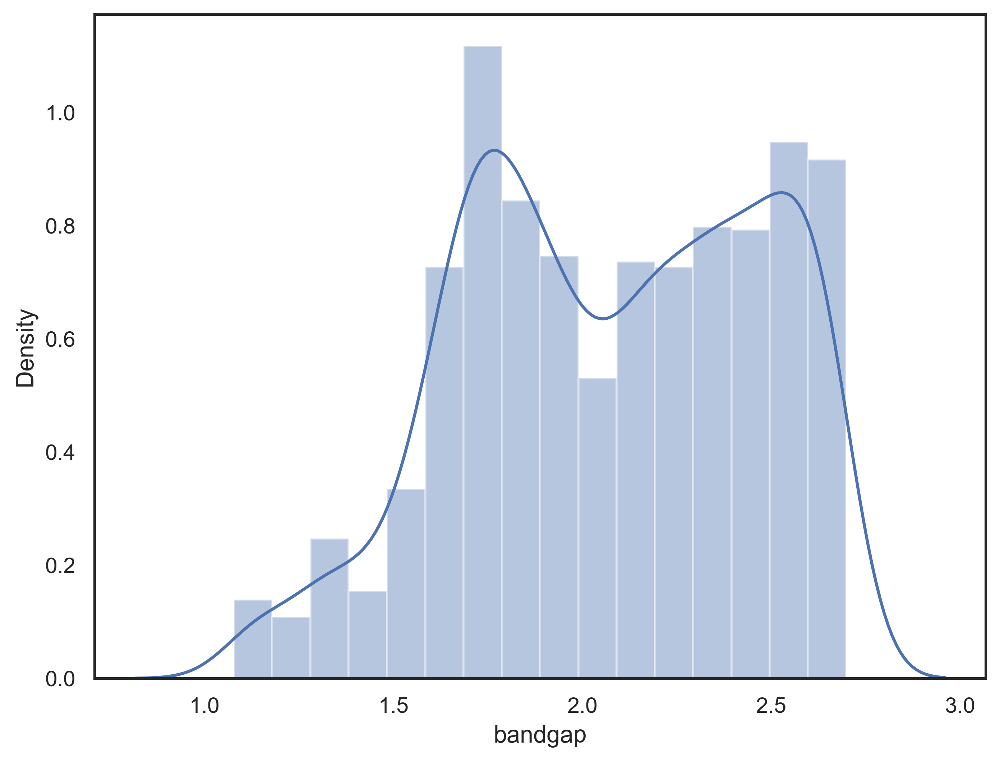

In [556]:
sns.distplot(aa1bb1o3['bandgap'])

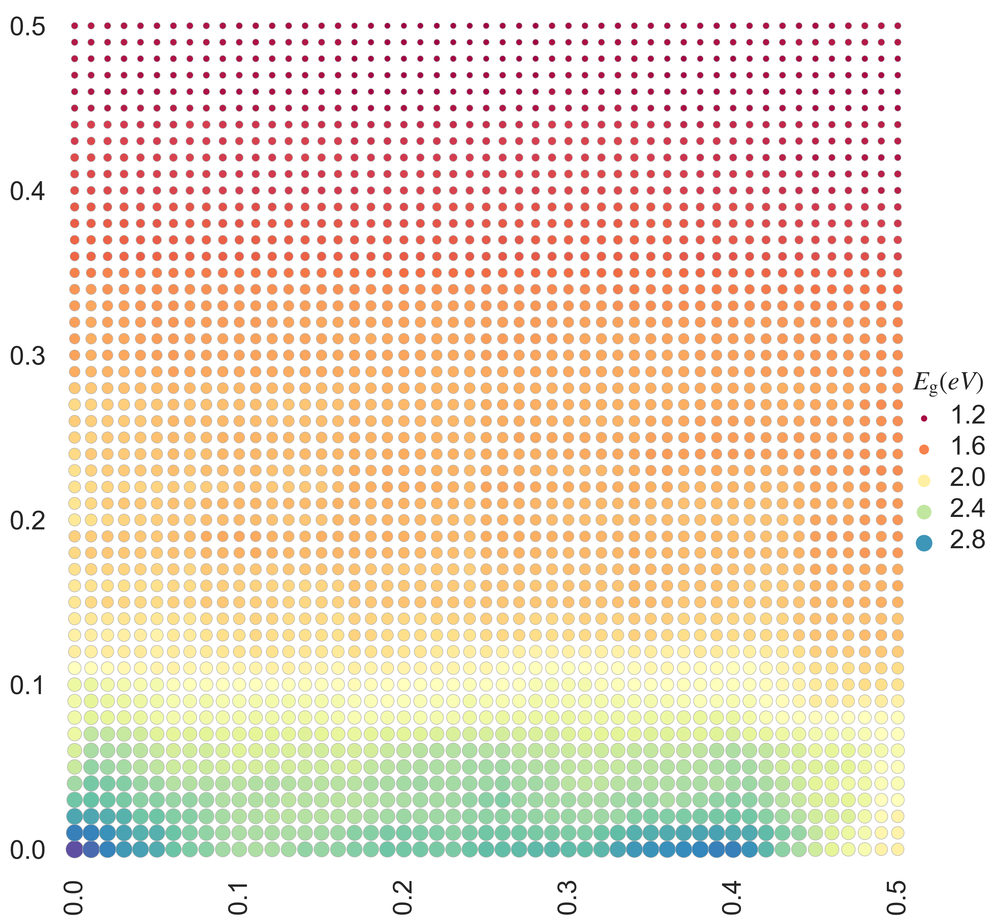

In [486]:
g = sns.relplot(
    data=candidate_eg_df,
    x="A2_ratio", y="B2_ratio", hue="bandgap", size="bandgap",
    palette="Spectral",  edgecolor=".7",
    height=10, sizes=(20, 180), 
)

ax = g.ax
ax.xaxis.set_major_locator(MultipleLocator(0.1))
ax.yaxis.set_major_locator(MultipleLocator(0.1))    


g.set(xlabel="", ylabel="", aspect="equal")
g.despine(left=True, bottom=True)
g.ax.margins(.02)
for label in g.ax.get_xticklabels():
    label.set_rotation(90)

    
ax.tick_params(axis='both', which='major', labelsize=20)  
ax.tick_params(axis='both', which='minor', labelsize=20) 


colorbar = g._legend

colorbar.set_title('$E_{\mathrm{g}}(eV)$', prop={'size': 30})
colorbar_title = colorbar.get_title()
colorbar_title.set_fontsize(20) 
for text in colorbar.get_texts():
    text.set_fontsize(20)  
plt.savefig('co-doped_La-Mn.png',dpi=400, bbox_inches='tight')

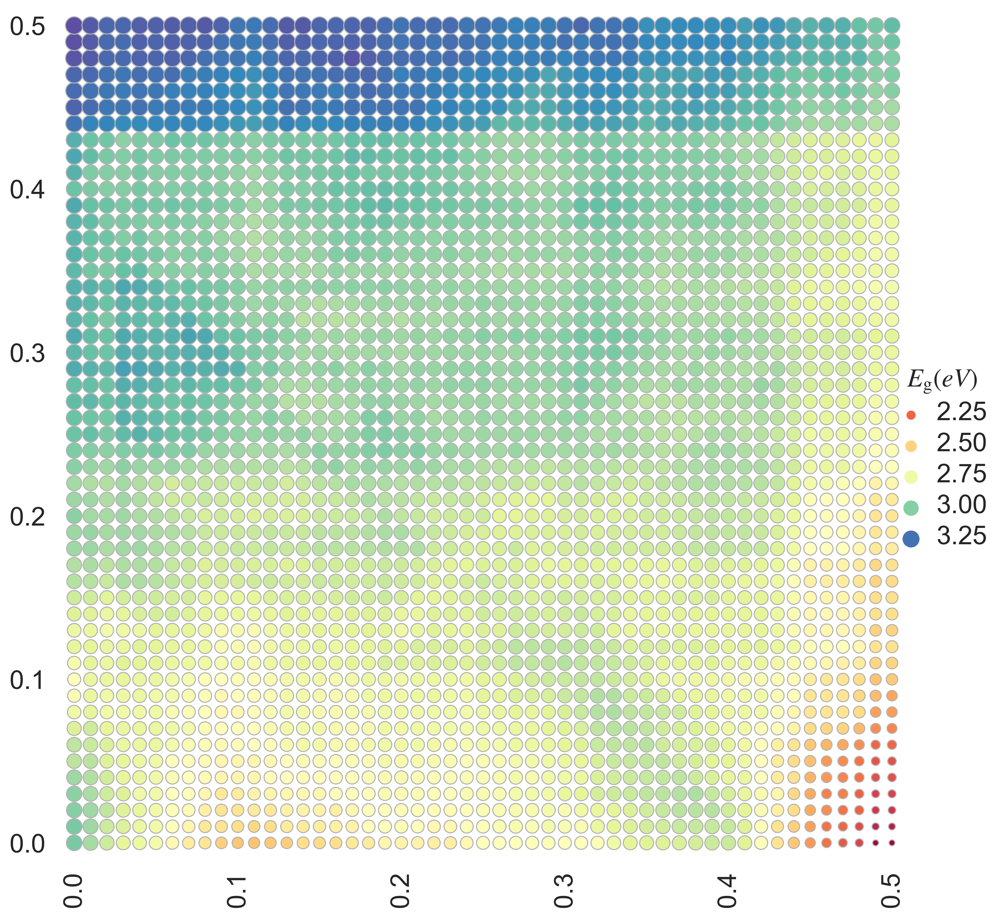

In [485]:
g = sns.relplot(
    data=candidate_eg_df2,
    x="A2_ratio", y="B2_ratio", hue="bandgap", size="bandgap",
    palette="Spectral",  edgecolor=".7",
    height=10, sizes=(20, 180), 
)

ax = g.ax
ax.xaxis.set_major_locator(MultipleLocator(0.1))
ax.yaxis.set_major_locator(MultipleLocator(0.1))    

# Tweak the figure to finalize
g.set(xlabel="", ylabel="", aspect="equal")
g.despine(left=True, bottom=True)
g.ax.margins(.02)
for label in g.ax.get_xticklabels():
    label.set_rotation(90)

    
ax.tick_params(axis='both', which='major', labelsize=20)  
ax.tick_params(axis='both', which='minor', labelsize=20)  

colorbar = g._legend

colorbar.set_title('$E_{\mathrm{g}}(eV)$', prop={'size': 30})
colorbar_title = colorbar.get_title()
colorbar_title.set_fontsize(20) 
for text in colorbar.get_texts():
    text.set_fontsize(20)  
plt.savefig('co-doped_La-Sc.png',dpi=400, bbox_inches='tight')

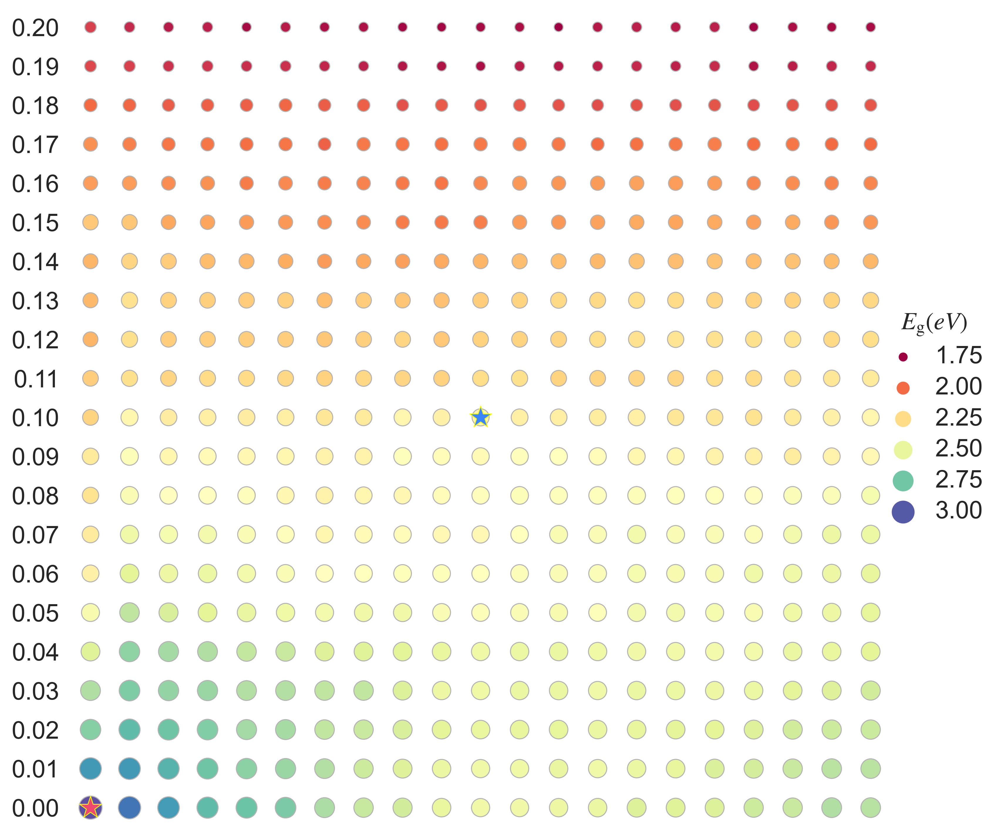

In [498]:
from matplotlib.ticker import MultipleLocator
g = sns.relplot(
    data=candidate_eg_df3,
    x="A2_ratio", y="B2_ratio", hue="bandgap", size="bandgap",
    palette='Spectral',  edgecolor=".7",
    height=8, sizes=(30, 200), 
)

ax = g.ax
target_points = [(0, 0),(0.1,0.1)]  
facecolor_points = ['#ef476f','#3a86ff']

for i, point in enumerate(target_points):
    ax.scatter(
        point[0], point[1], 
        s=200,        
        facecolors=facecolor_points[i], 
        edgecolors='yellow', 
        linewidths=0.5,
        marker='*',       
        zorder=10
    )

ax.xaxis.set_major_locator(MultipleLocator(0.01))
ax.yaxis.set_major_locator(MultipleLocator(0.01))

# Tweak the figure to finalize
g.set(xlabel="", ylabel="", aspect="equal")
g.despine(left=True, bottom=True)
g.ax.margins(.02)
for label in g.ax.get_xticklabels():
    label.set_rotation(90)

ax.set(xticklabels=[])  
ax.tick_params(axis='both', which='major', labelsize=15)  
ax.tick_params(axis='both', which='minor', labelsize=15)  

colorbar = g._legend

colorbar.set_title('$E_{\mathrm{g}}(eV)$', prop={'size': 50})
colorbar_title = colorbar.get_title()
colorbar_title.set_fontsize(15)  
for text in colorbar.get_texts():
    text.set_fontsize(15)  
    
plt.savefig('co-doped_La-Cr.png',dpi=400, bbox_inches='tight')

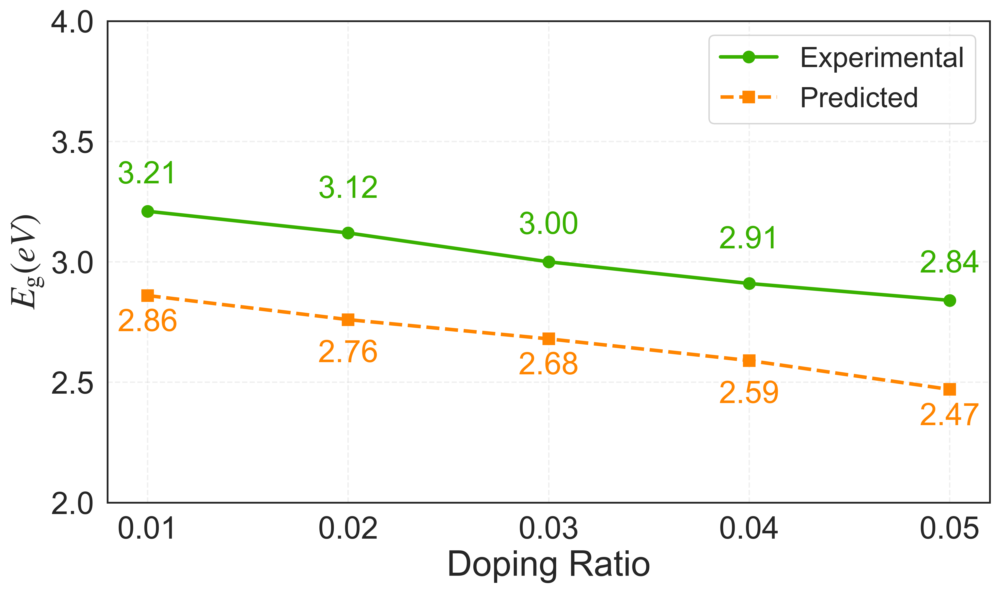

In [540]:
import matplotlib.pyplot as plt
import numpy as np

doping_ratios = np.arange(0.01, 0.051, 0.01)  
experimental_values = [3.21, 3.12, 3, 2.91, 2.84] 
predicted_values = [2.86,2.76,2.68,2.59,2.47]  


plt.figure(figsize=(10, 6), dpi=400)


exp_line, = plt.plot(doping_ratios, experimental_values, 
             'o-',  
             color='#38b000',
             linewidth=2.5,
             markersize=8,
             label='Experimental')

pred_line, = plt.plot(doping_ratios, predicted_values,
             's--',  
             color='#ff8500', 
             linewidth=2.5,
             markersize=8,
             label='Predicted')


for i, (x, y) in enumerate(zip(doping_ratios, experimental_values)):
    offset = 0.01 if i % 2 == 0 else 0.03 
    plt.annotate(f'{y:.2f}', 
                 (x, y),
                 textcoords="offset points", 
                 xytext=(0, 20 + i%2*5), 
                 ha='center', 
                 fontsize=22,
                 color=exp_line.get_color())


for i, (x, y) in enumerate(zip(doping_ratios, predicted_values)):
    plt.annotate(f'{y:.2f}', 
                 (x, y),
                 textcoords="offset points", 
                 xytext=(0, -25 - i%2*5), 
                 ha='center', 
                 fontsize=22,
                 color=pred_line.get_color())


plt.xticks(np.round(doping_ratios, 2), 
           [f'{x:.2f}' for x in doping_ratios]) 
plt.xlabel('Doping Ratio', fontsize=25)
plt.ylabel('$E_{\mathrm{g}}(eV)$', fontsize=25)
plt.grid(alpha=0.3, linestyle='--') 
plt.ylim([2,4])


plt.legend(fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=22) 
plt.tick_params(axis='both', which='minor', labelsize=22) 


plt.tight_layout()
plt.savefig('bandgap_comparison.png', dpi=400)  
plt.show()

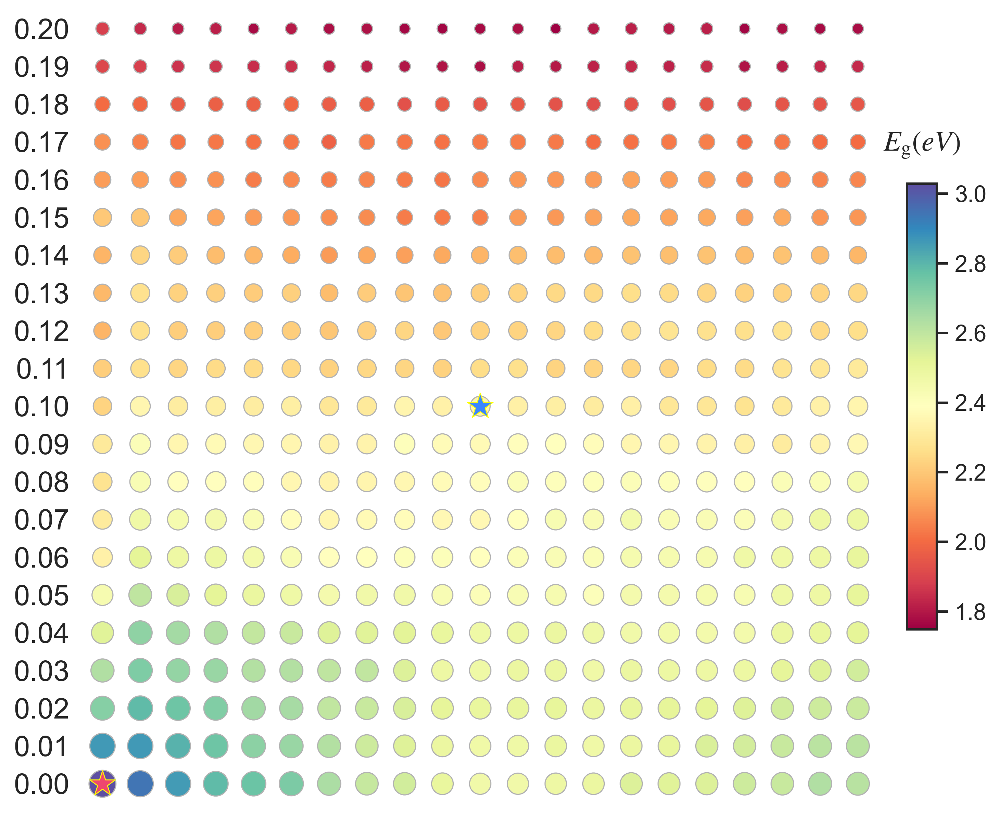

In [539]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from matplotlib.ticker import MultipleLocator

plt.figure(figsize=(8, 8))
ax = plt.gca()

size_min = 30
size_max = 200
bandgap = candidate_eg_df3['bandgap']
size_values = size_min + (size_max - size_min) * (bandgap - bandgap.min()) / (bandgap.max() - bandgap.min())

sc = sns.scatterplot(
    data=candidate_eg_df3,
    x="A2_ratio", y="B2_ratio", 
    hue="bandgap", 
    size=size_values, 
    palette='Spectral', 
    edgecolor=".7",
    sizes=(size_min, size_max),
    ax=ax
)

target_points = [(0, 0),(0.1,0.1)]  
facecolor_points = ['#ef476f','#3a86ff']

for i, point in enumerate(target_points):
    ax.scatter(
        point[0], point[1], 
        s=200,           
        facecolors=facecolor_points[i], 
        edgecolors='yellow',  
        linewidths=0.5,
        marker='*',      
        zorder=10
    )

ax.xaxis.set_major_locator(MultipleLocator(0.01))
ax.yaxis.set_major_locator(MultipleLocator(0.01))
ax.set(xlabel="", ylabel="", aspect="equal")
ax.margins(.02)

for label in ax.get_xticklabels():
    label.set_rotation(90)

ax.set(xticklabels=[])  

ax.tick_params(axis='both', which='major', labelsize=15)
ax.tick_params(axis='both', which='minor', labelsize=15)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

vmin = bandgap.min()
vmax = bandgap.max()


norm = Normalize(vmin=vmin, vmax=vmax)
sm = ScalarMappable(cmap='Spectral', norm=norm)
sm.set_array([])


cbar = plt.colorbar(sm, ax=ax, fraction=0.035, pad=0.04, aspect=15) 

cbar.ax.tick_params(labelsize=12)  

cbar_pos = cbar.ax.get_position()
label_x = cbar_pos.x0 + 0.5 * cbar_pos.width
label_y = cbar_pos.y1 - 0.16 

plt.figtext(
    label_x, label_y, 
    '$E_{\mathrm{g}}(eV)$', 
    fontsize=15, 
    ha='center', 
    va='bottom'
)

if ax.legend_ is not None:
    ax.legend_.remove()

plt.savefig('co-doped_La-Cr.png',dpi=400, bbox_inches='tight')
plt.show()